## Practical Work 4

For this practical work, the student will have to develop a Python program that is able to implement the accelerated gradient descent methods with adaptive learning rate <b>(Adagrad, RMSProp, and Adam)</b> in order to achieve the linear regression of a set of datapoints.
##### Please notice that we will apply these algorithm to single variable LR.

#### Import numpy, matplotlib.pyplot and make it inline

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline

To have a dataset or set of data points, the student must generate a pair of arrays <b>X</b> and <b>y</b> with the values in <b>X</b> equally distributed between <b>0</b> and <b>20</b> and the values in <b>y</b> such that: 
<b>yi = a*xi + b (and a = -1, b = 2)</b>


In [30]:
X = np.linspace(0, 20, 50).reshape(-1, 1)

X

array([[ 0.        ],
       [ 0.40816327],
       [ 0.81632653],
       [ 1.2244898 ],
       [ 1.63265306],
       [ 2.04081633],
       [ 2.44897959],
       [ 2.85714286],
       [ 3.26530612],
       [ 3.67346939],
       [ 4.08163265],
       [ 4.48979592],
       [ 4.89795918],
       [ 5.30612245],
       [ 5.71428571],
       [ 6.12244898],
       [ 6.53061224],
       [ 6.93877551],
       [ 7.34693878],
       [ 7.75510204],
       [ 8.16326531],
       [ 8.57142857],
       [ 8.97959184],
       [ 9.3877551 ],
       [ 9.79591837],
       [10.20408163],
       [10.6122449 ],
       [11.02040816],
       [11.42857143],
       [11.83673469],
       [12.24489796],
       [12.65306122],
       [13.06122449],
       [13.46938776],
       [13.87755102],
       [14.28571429],
       [14.69387755],
       [15.10204082],
       [15.51020408],
       [15.91836735],
       [16.32653061],
       [16.73469388],
       [17.14285714],
       [17.55102041],
       [17.95918367],
       [18

In [31]:
a=-1
b=2
y=a*X+b
y

array([[  2.        ],
       [  1.59183673],
       [  1.18367347],
       [  0.7755102 ],
       [  0.36734694],
       [ -0.04081633],
       [ -0.44897959],
       [ -0.85714286],
       [ -1.26530612],
       [ -1.67346939],
       [ -2.08163265],
       [ -2.48979592],
       [ -2.89795918],
       [ -3.30612245],
       [ -3.71428571],
       [ -4.12244898],
       [ -4.53061224],
       [ -4.93877551],
       [ -5.34693878],
       [ -5.75510204],
       [ -6.16326531],
       [ -6.57142857],
       [ -6.97959184],
       [ -7.3877551 ],
       [ -7.79591837],
       [ -8.20408163],
       [ -8.6122449 ],
       [ -9.02040816],
       [ -9.42857143],
       [ -9.83673469],
       [-10.24489796],
       [-10.65306122],
       [-11.06122449],
       [-11.46938776],
       [-11.87755102],
       [-12.28571429],
       [-12.69387755],
       [-13.10204082],
       [-13.51020408],
       [-13.91836735],
       [-14.32653061],
       [-14.73469388],
       [-15.14285714],
       [-15

#### Plot X vs. y

In [39]:
X_b = np.c_[np.ones((len(X), 1)), X]
X_b

array([[ 1.        ,  0.        ],
       [ 1.        ,  0.40816327],
       [ 1.        ,  0.81632653],
       [ 1.        ,  1.2244898 ],
       [ 1.        ,  1.63265306],
       [ 1.        ,  2.04081633],
       [ 1.        ,  2.44897959],
       [ 1.        ,  2.85714286],
       [ 1.        ,  3.26530612],
       [ 1.        ,  3.67346939],
       [ 1.        ,  4.08163265],
       [ 1.        ,  4.48979592],
       [ 1.        ,  4.89795918],
       [ 1.        ,  5.30612245],
       [ 1.        ,  5.71428571],
       [ 1.        ,  6.12244898],
       [ 1.        ,  6.53061224],
       [ 1.        ,  6.93877551],
       [ 1.        ,  7.34693878],
       [ 1.        ,  7.75510204],
       [ 1.        ,  8.16326531],
       [ 1.        ,  8.57142857],
       [ 1.        ,  8.97959184],
       [ 1.        ,  9.3877551 ],
       [ 1.        ,  9.79591837],
       [ 1.        , 10.20408163],
       [ 1.        , 10.6122449 ],
       [ 1.        , 11.02040816],
       [ 1.        ,

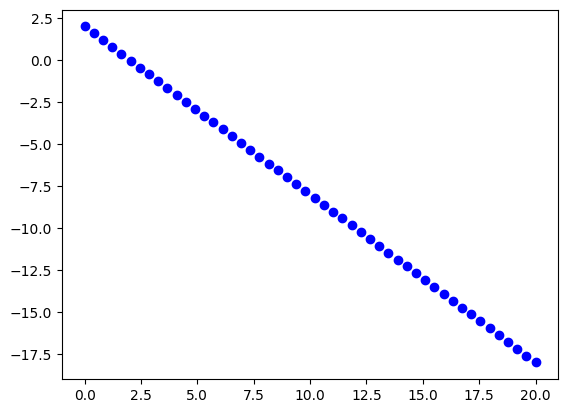

In [32]:
plt.scatter(X, y, color='blue', label='Data Points')
plt.show()

## Adagrad

### For a single variable linear regression ML model, build a function to find the optimum Theta_0 and Theta_1 parameters using Adagrad optimization algorithm.
#### The funtion should have the following input parameters:
##### 1. Input data as a matrix (or vector based on your data).
##### 2. Target label as a vector.
##### 3. Learning rate.
##### 4. Epsilon.
##### 5. Maximum number of iterations (Epochs).
#### The funtion should return the following outputs:
##### 1. All predicted Theta_0 in all iterations.
##### 2. All predicted Theta_1 in all iterations.
##### 3. Corresponding loss for each Theta_0 and Theta_1 predictions.
##### 4.All hypothesis outputs (prdicted labels) for each Theta_0 and Theta_1 predictions.
##### 5.Final Optimum values of Theta_0 and Theta_1.
#### Choose the suitable number of iterations, learning rate, Epsilon, and stop criteria.
#### Calculate r2 score. Shouldn't below 0.9
#### Plot the required curves (loss-epochs, loss-theta0, loss-theta1, all fitted lines per epoch (single graph), best fit line)
#### Try different values of the huperparameters and see the differnce in your results.

##### The following results uses alpha = 0.05, epsilon =  1e-08, and max. iterations = 500.

In [46]:
from sklearn.metrics import r2_score


def adagrad_optimization(X, y, learning_rate=0.1, epsilon=1e-8, n_iterations=1000, stop_criteria=1e-5):
    m, n = X.shape
    theta = np.random.randn(n, 1)
    gradient_squared_sum = np.zeros_like(theta)

    theta_0_history, theta_1_history, loss_history, hypothesis_history = [], [], [], []

    for iteration in range(n_iterations):
        h = X.dot(theta)
        loss = np.mean((h - y) ** 2)
        gradients = (2 / m) * X.T.dot(h - y)
        gradient_squared_sum += gradients ** 2
        adjusted_lr = learning_rate / (np.sqrt(gradient_squared_sum) + epsilon)
        theta -= adjusted_lr * gradients

        theta_0_history.append(theta[0, 0])
        theta_1_history.append(theta[1, 0])
        loss_history.append(loss)
        hypothesis_history.append(h.copy())

        if iteration > 0 and abs(loss_history[-2] - loss_history[-1]) < stop_criteria:
            break

    y_pred = X.dot(theta)
    r2 = r2_score(y, y_pred)

    if r2 < 0.9:
        print("Warning: R² score is below 0.9. Consider adjusting hyperparameters.")

    return theta_0_history, theta_1_history, loss_history, hypothesis_history, theta




In [181]:
def plot_all_predictions(theta_0_hist, theta_1_hist, x, y):
    plt.figure(figsize=(10, 6))
    plt.plot(x, y, label='Actual y', color='black', marker='o')
    for i in range(len(theta_0_hist)):
        h = theta_0_hist[i] + theta_1_hist[i] * x
        plt.plot(x, h, label=f'Predicted h (Theta {i+1})', linestyle='--')
    plt.title('Predicted h vs Actual y for each Theta')
    plt.show()
def plot_losses(theta0_values, theta1_values, losses, X, y, predictions):
    plt.plot( losses, marker='o', color='r')
    plt.show()
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(theta0_values, losses, marker='o', color='b', label='Losses vs Theta0')
    plt.xlabel('Theta0')
    plt.ylabel('Losses')
    plt.grid(True)
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(theta1_values, losses, marker='o', color='r', label='Losses vs Theta1')
    plt.xlabel('Theta1')
    plt.ylabel('Losses')
    plt.grid(True)
    plt.legend()

    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.scatter(X[:, 1], y, color='red', label='True values')
    plt.plot(X[:, 1], predictions, color='blue', label='Predicted values (h)')
    plt.xlabel("X")
    plt.ylabel("y")
    plt.legend()
    plt.grid(True)
    plt.show()
    plot_all_predictions(theta0_values, theta1_values, X, y)






Final Theta_0: 0.018750658895514385
Final Theta_1: -0.8697802132572628
Final R² Score: 0.9698


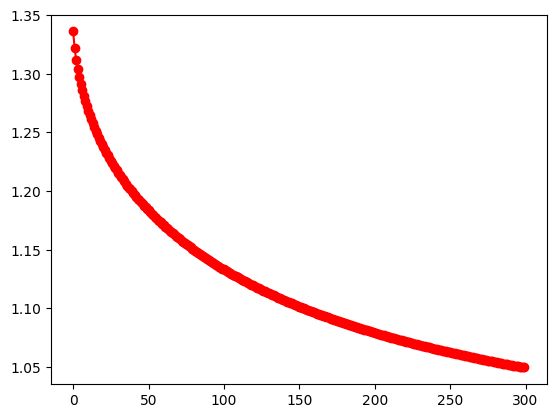

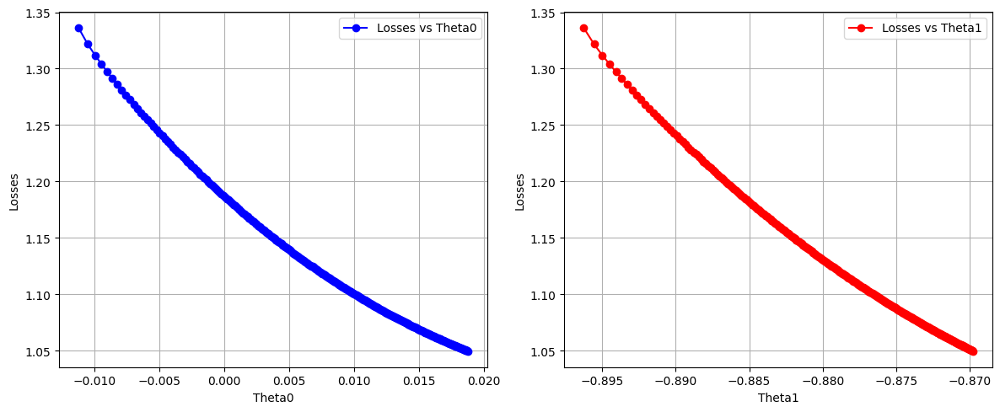

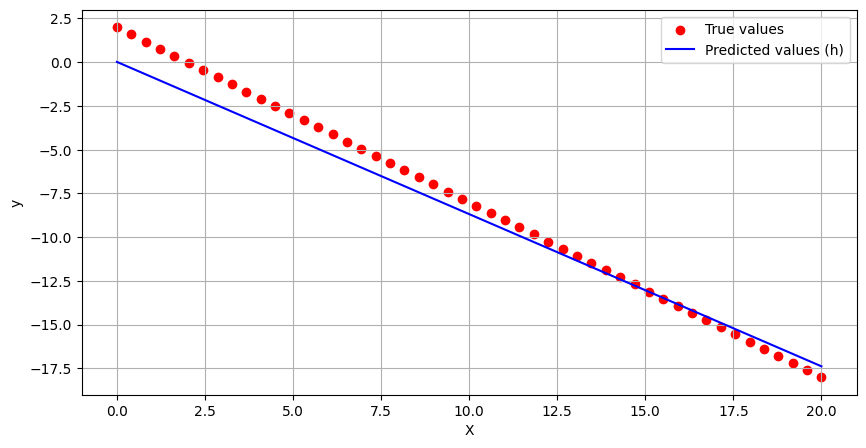

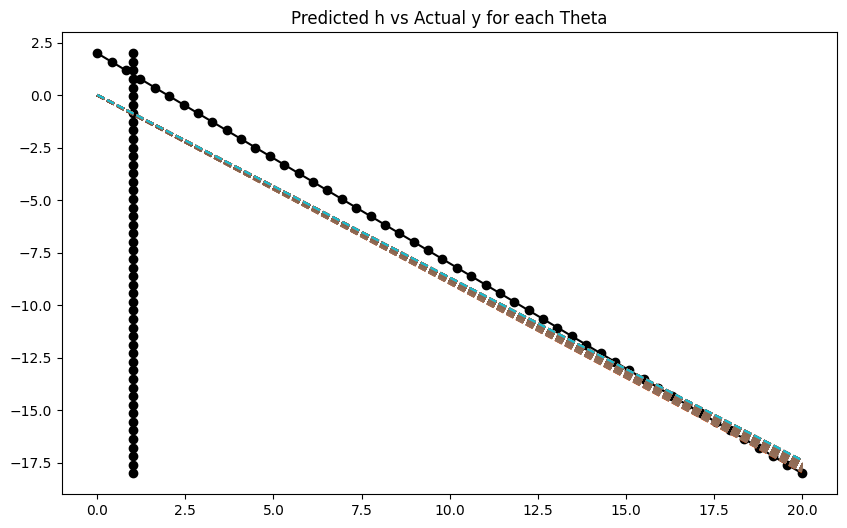

In [188]:
learning_rate = 0.001
y = y.reshape(-1, 1)

epsilon = 1e-8
n_iterations = 300

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)



Final Theta_0: 1.4502720879333602
Final Theta_1: -0.9587218217245341
Final R² Score: 0.9978


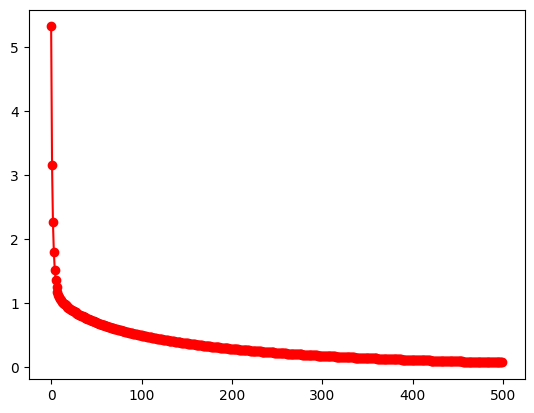

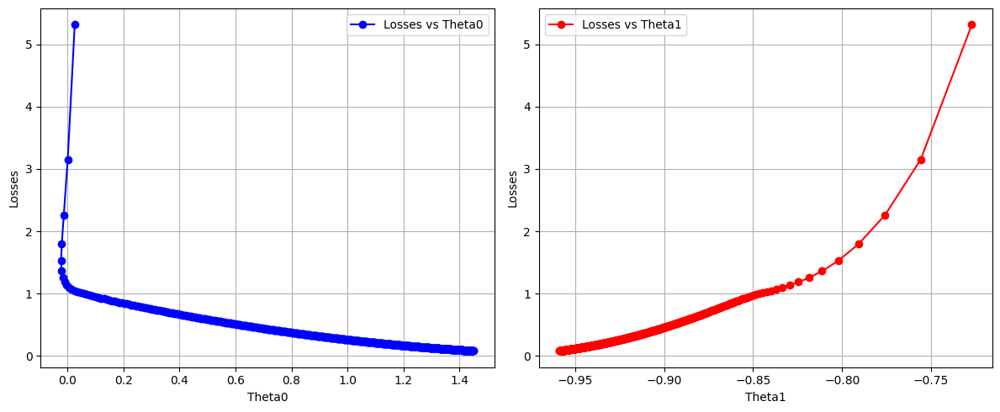

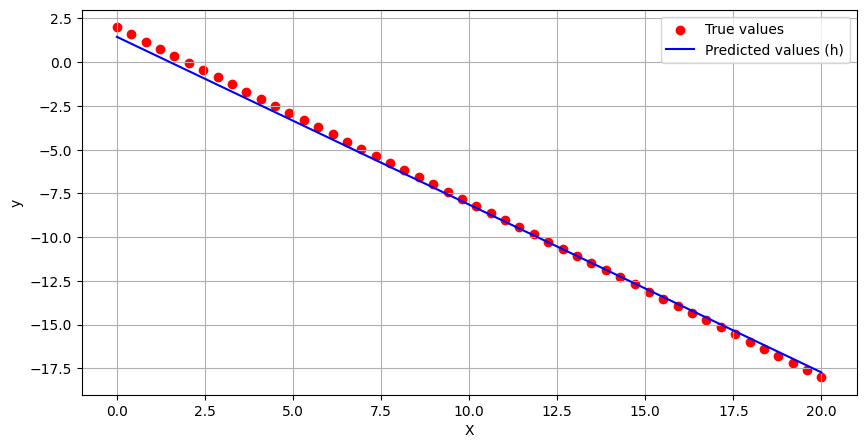

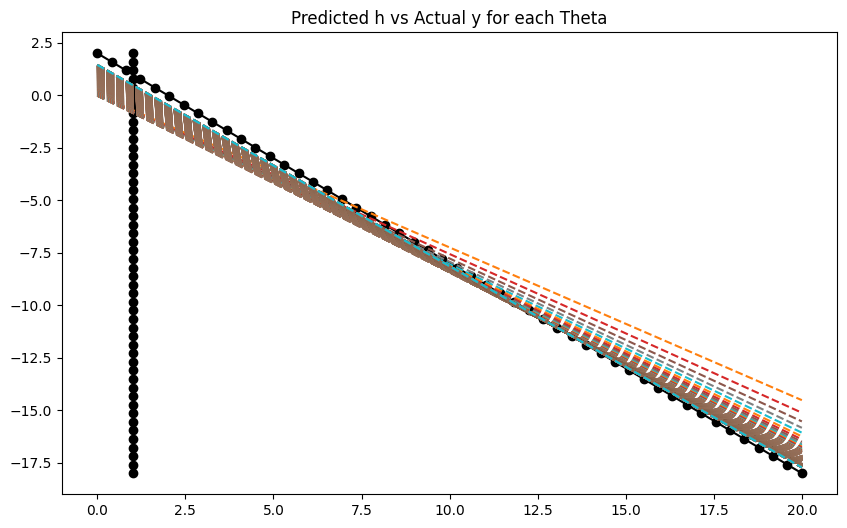

In [189]:
learning_rate = 0.05
epsilon = 1e-8
n_iterations = 500

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: -0.014705710512722622
Final Theta_1: -0.9982244758556317
Final R² Score: 0.8851


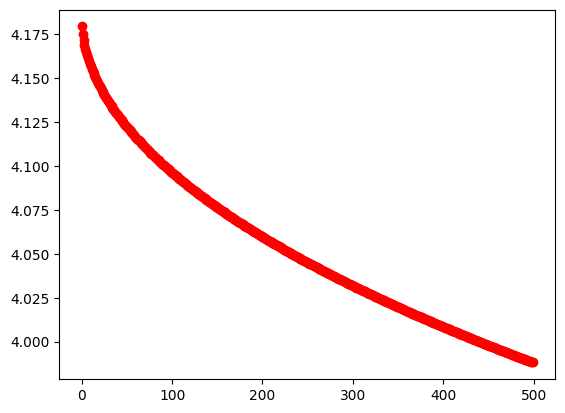

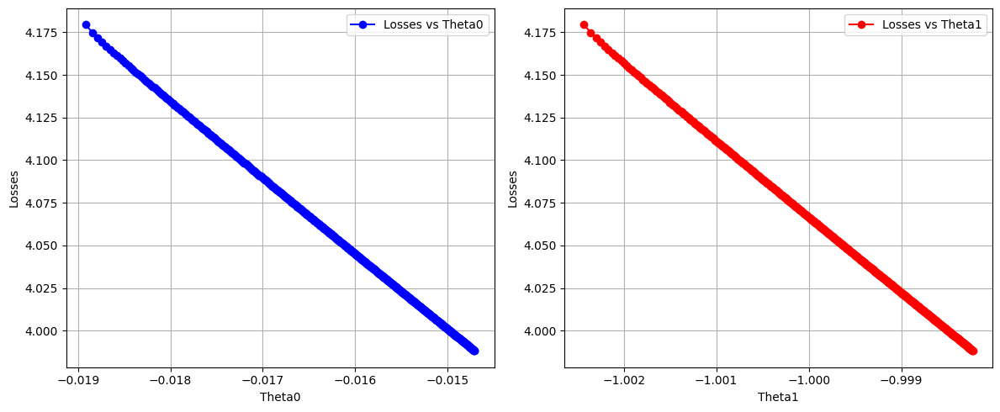

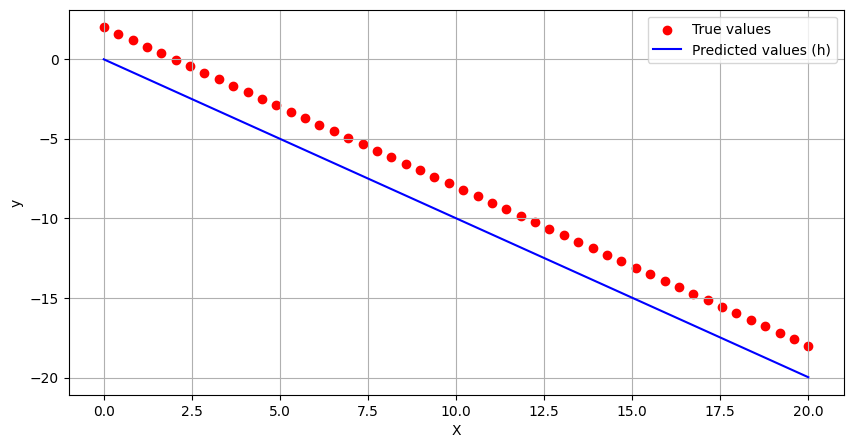

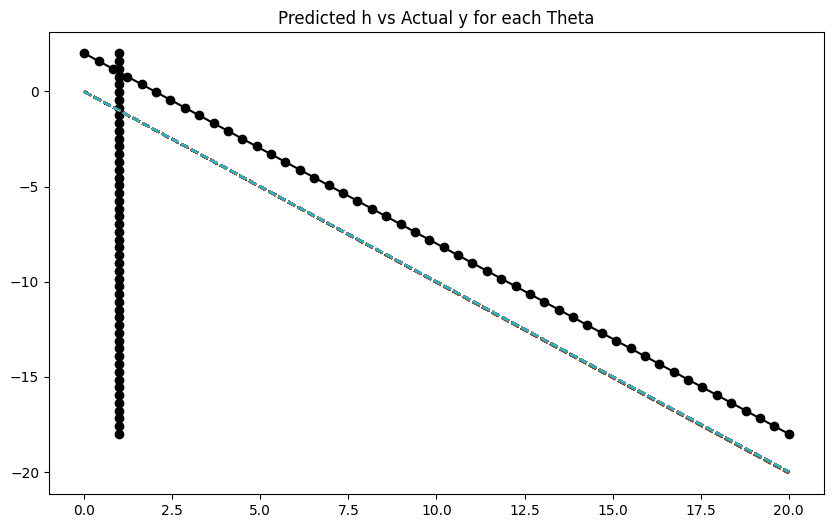

In [200]:
learning_rate = 0.0001
epsilon = 1e-8
n_iterations = 500

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: 0.37468137237414023
Final Theta_1: -0.8627729822061933
Final R² Score: 0.9793


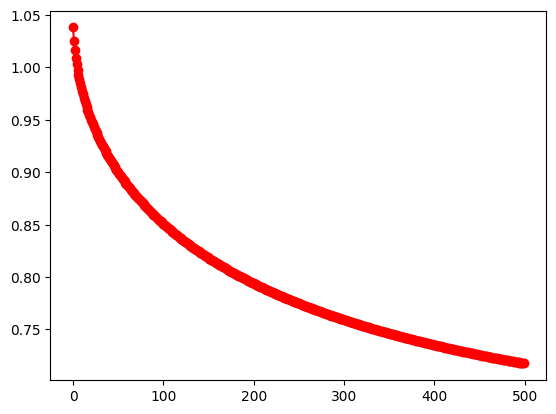

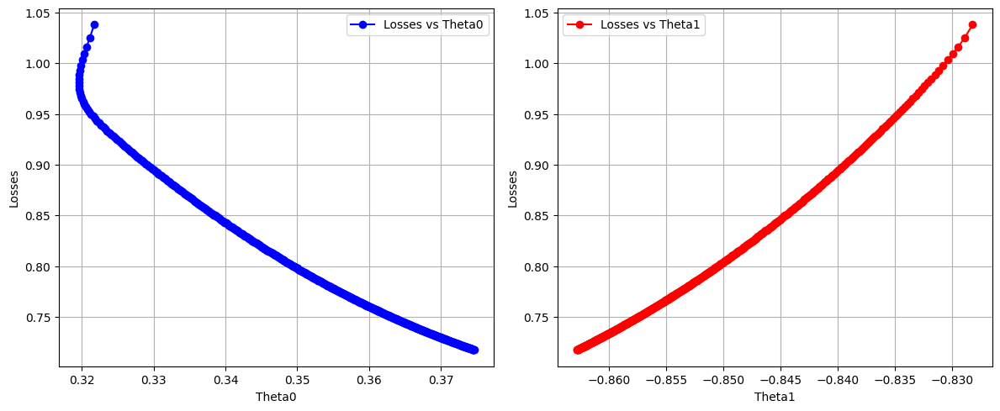

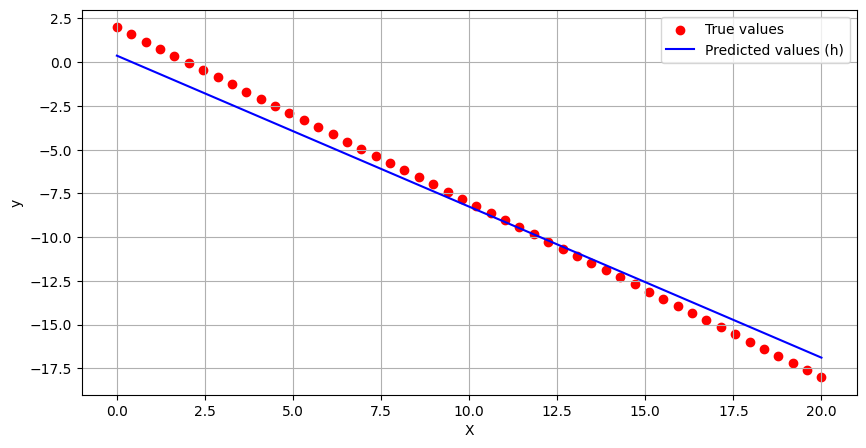

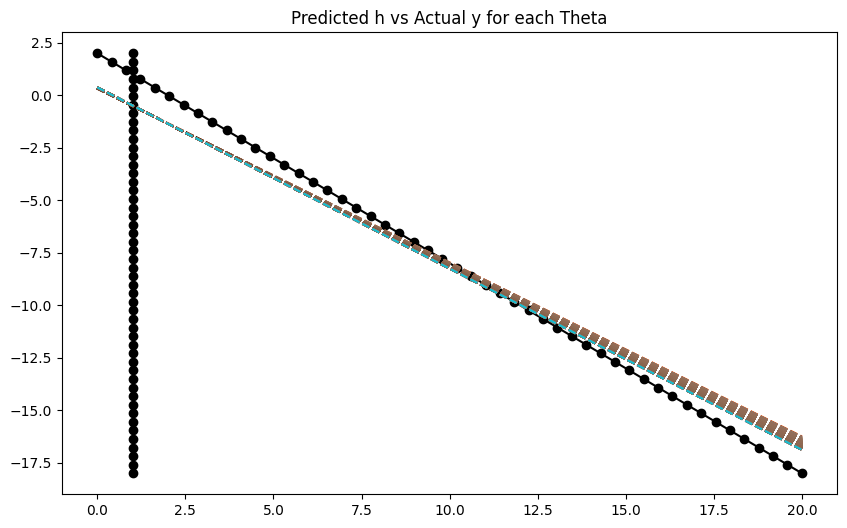

In [202]:
learning_rate = 0.001
epsilon = 1e-8
n_iterations = 500

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: 0.09721789600065414
Final Theta_1: -0.7734686357558708
Final R² Score: 0.9449


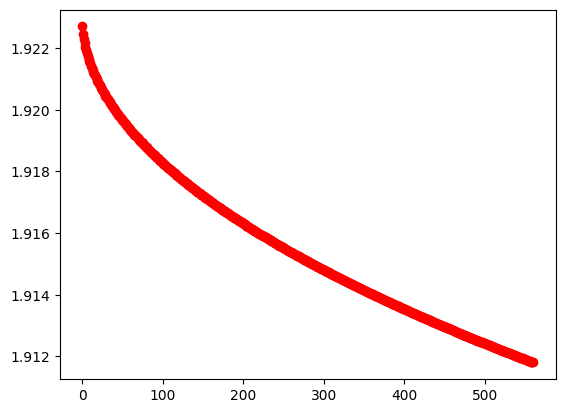

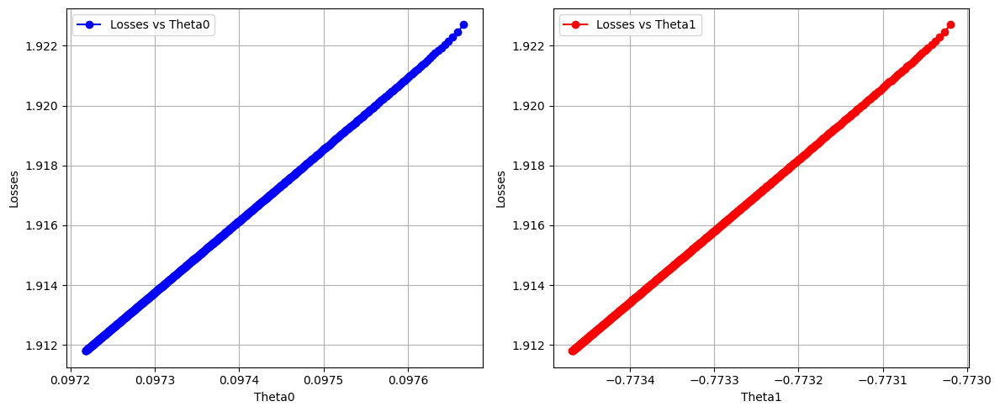

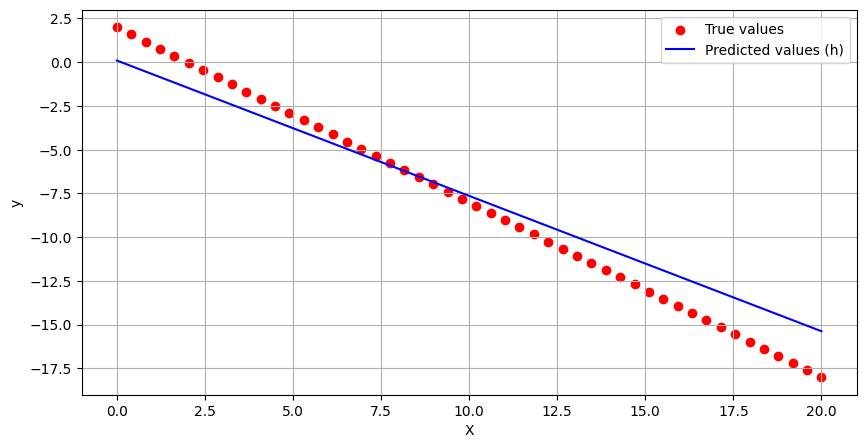

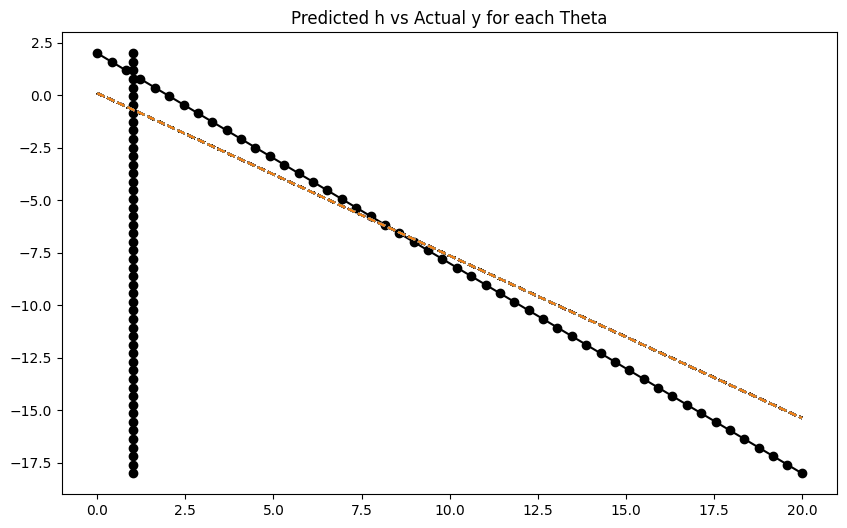

In [207]:
learning_rate = 0.00001
epsilon = 1e-8
n_iterations = 10000

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: -1.0455388777925714
Final Theta_1: -0.6994602928192152
Final R² Score: 0.9096


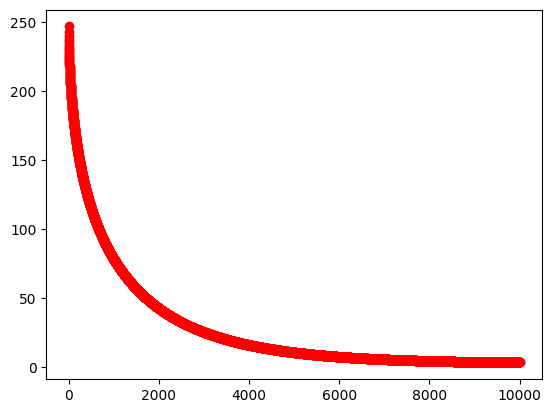

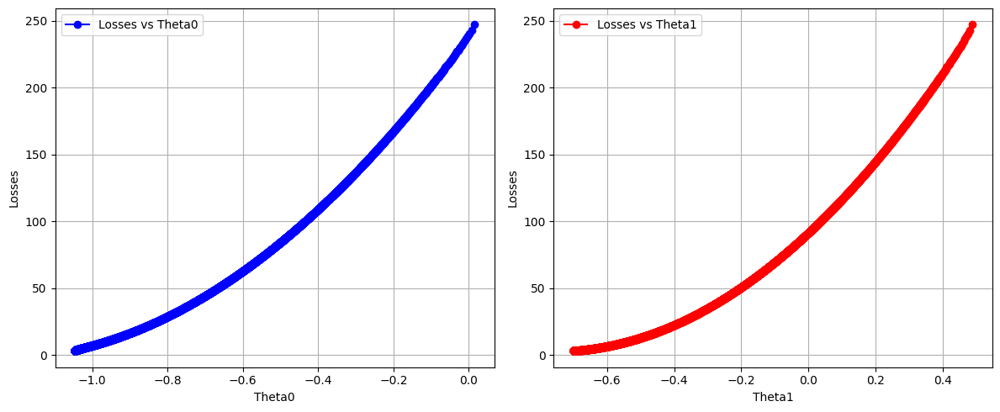

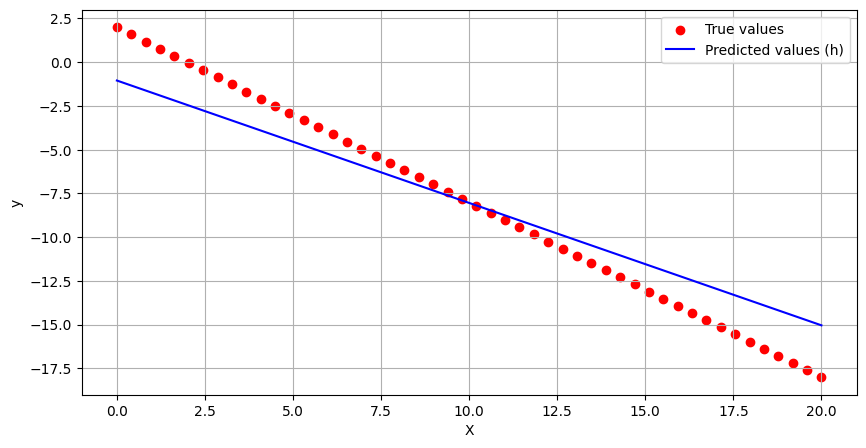

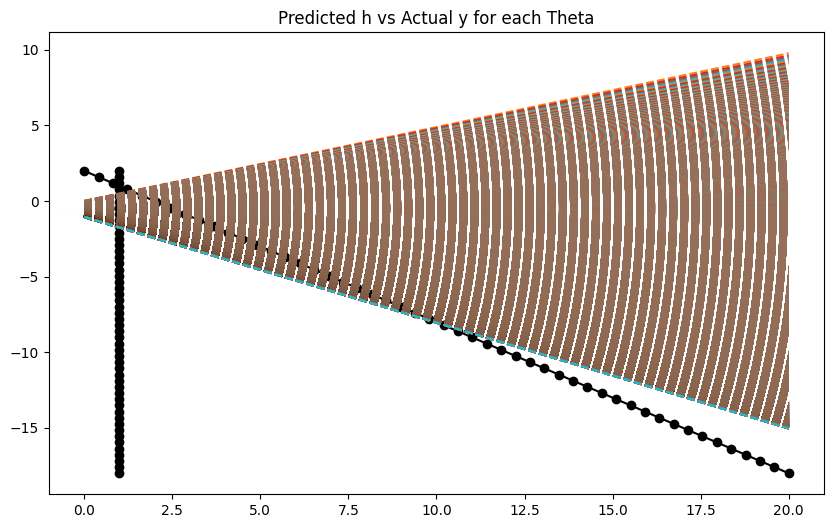

In [208]:
learning_rate = 0.01
epsilon = 1e-8
n_iterations = 10000

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: 2.002938907774681
Final Theta_1: -0.9180042360545912
Final R² Score: 0.9738


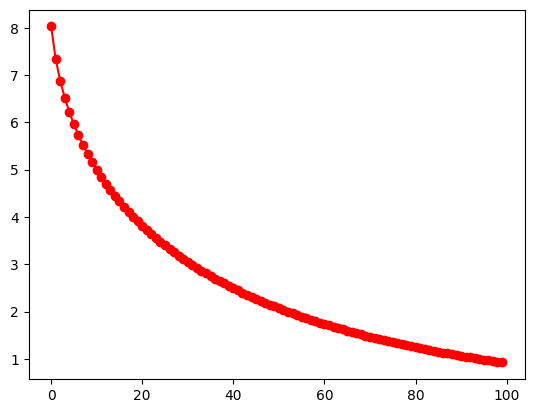

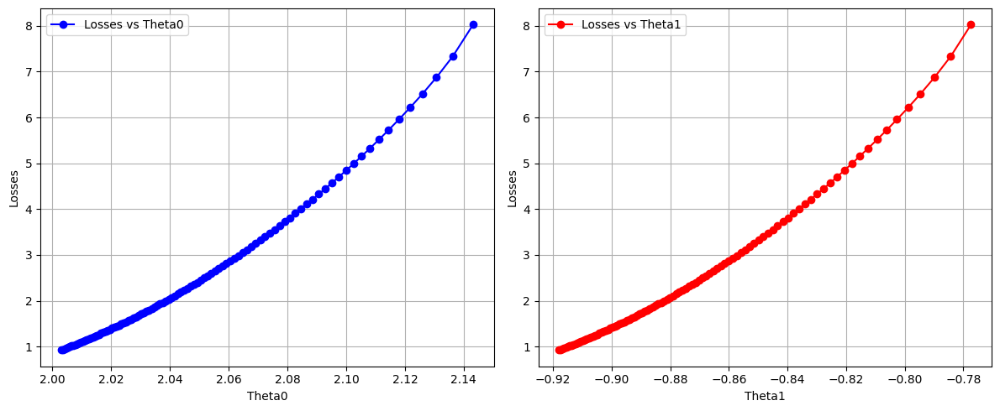

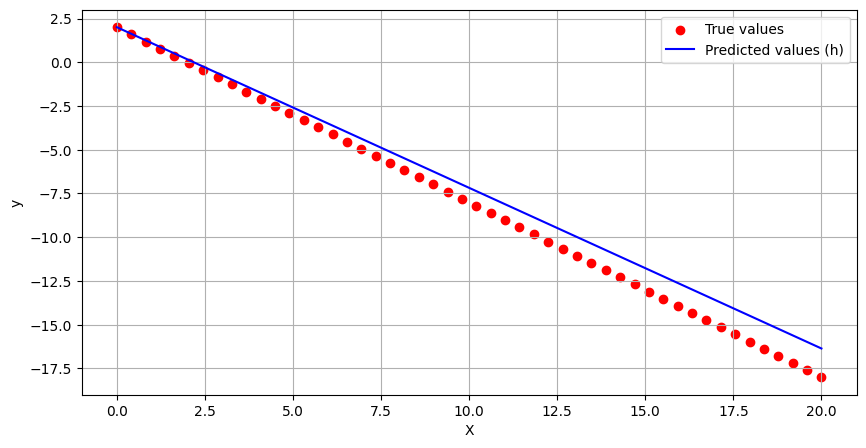

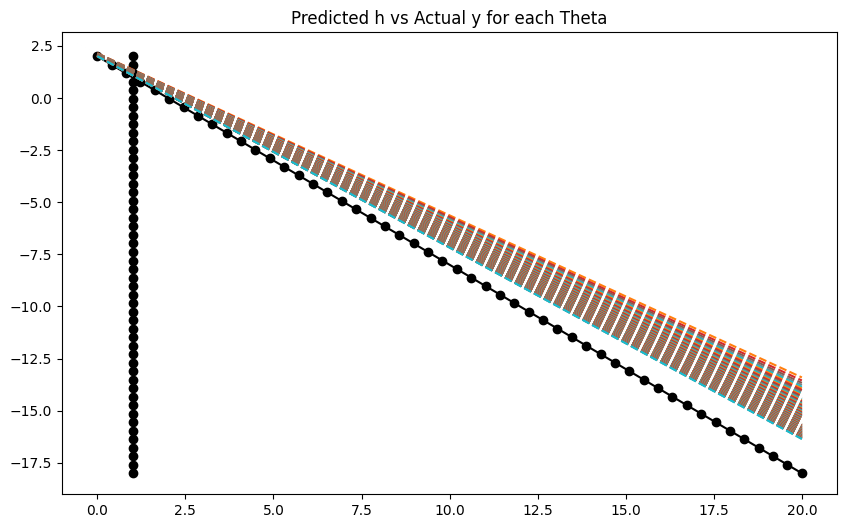

In [210]:
learning_rate = 0.01
epsilon = 1e-8
n_iterations = 100

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


##### The following results uses alpha = 0.005, epsilon =  1e-08, and max. iterations = 5000.

Final Theta_0: 2.0018636206312834
Final Theta_1: -0.9963370751737576
Final R² Score: 0.9999


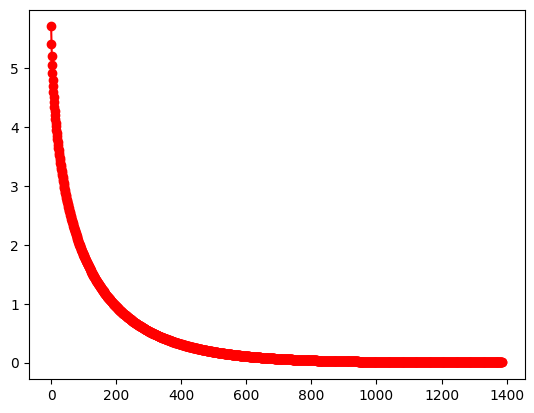

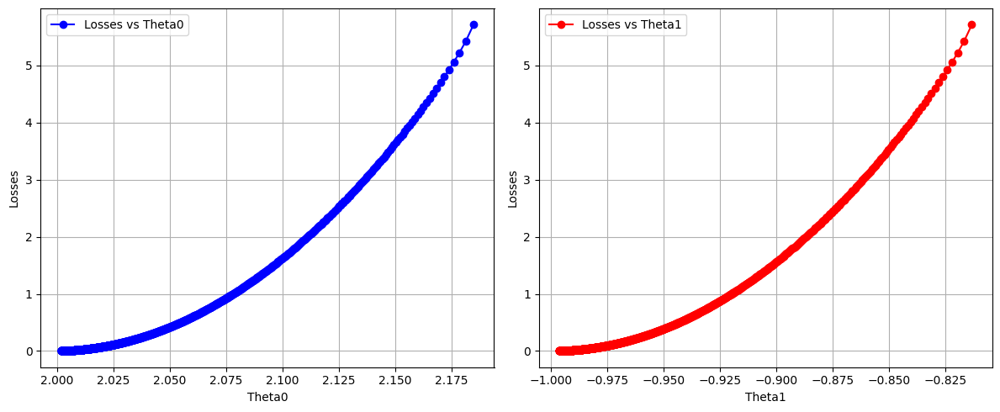

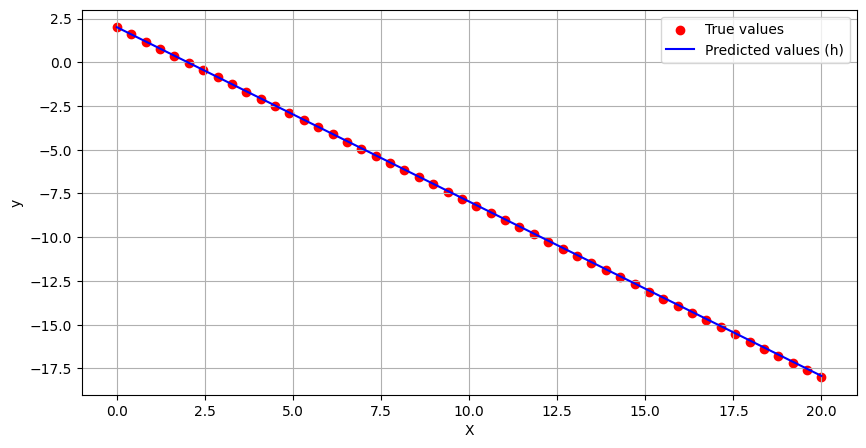

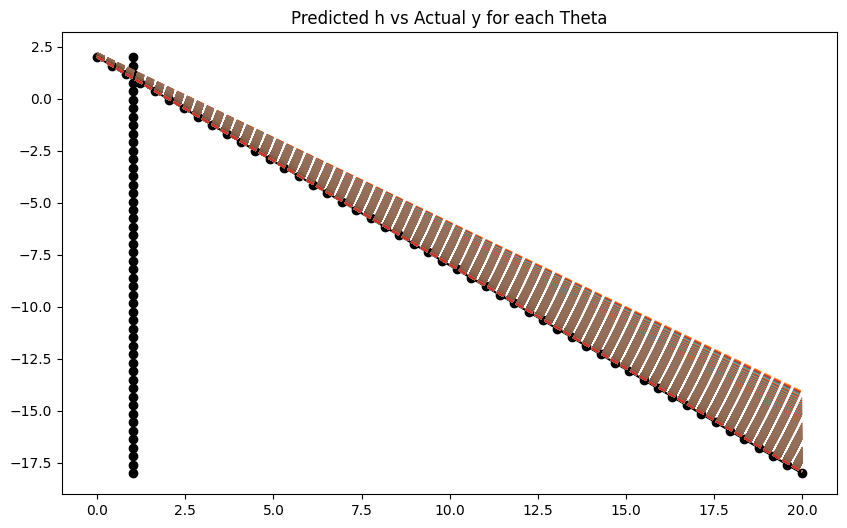

In [212]:
learning_rate = 0.005
epsilon = 1e-8
n_iterations = 5000

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: -0.864561305823112
Final Theta_1: -0.7540975850879044
Final R² Score: 0.9348


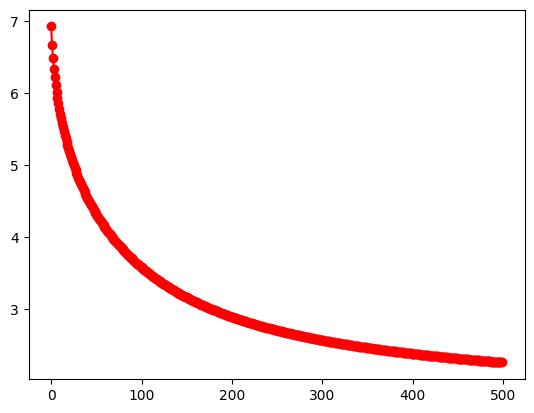

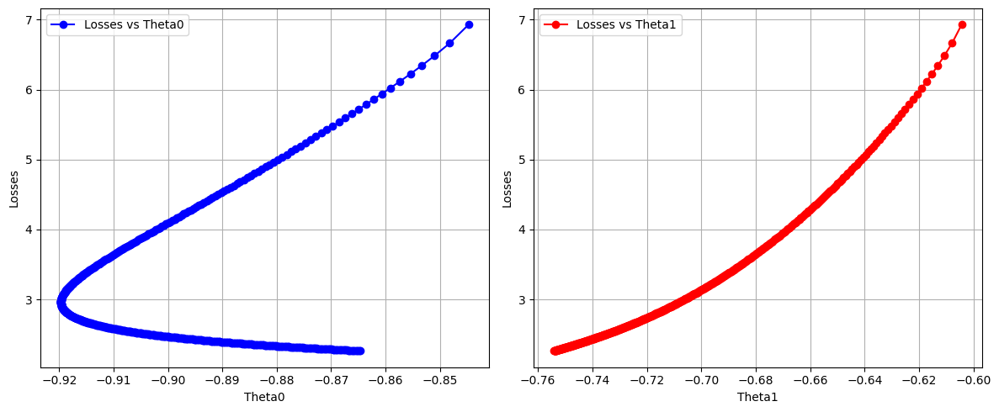

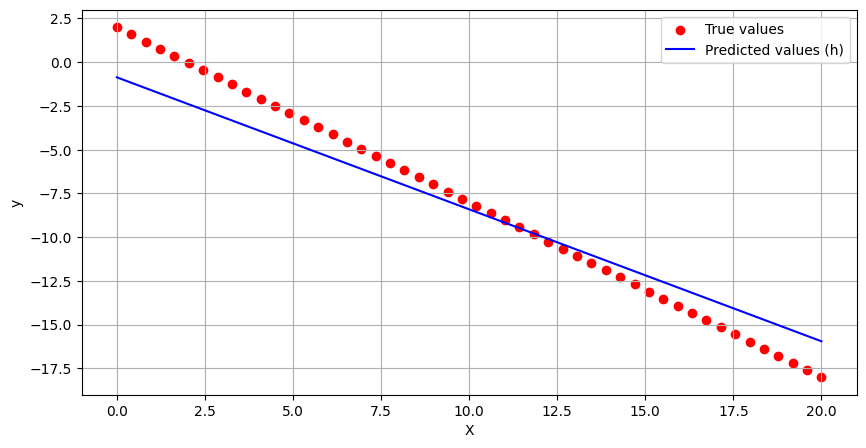

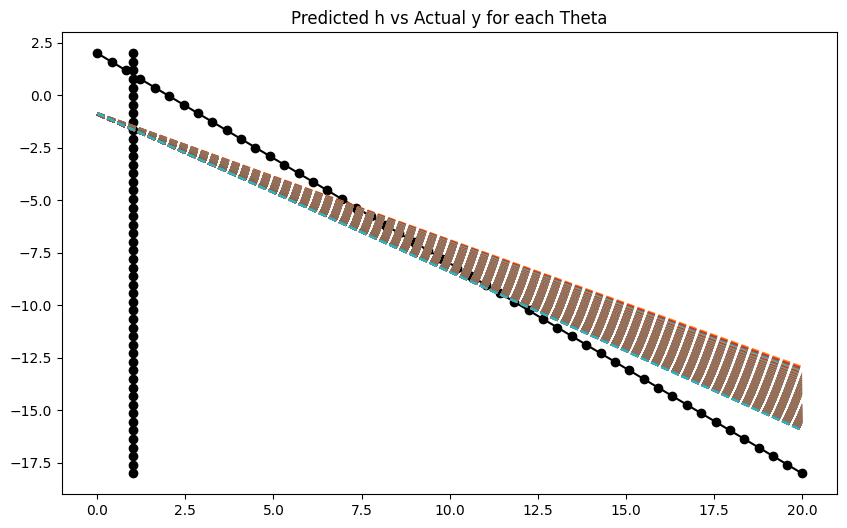

In [213]:
learning_rate = 0.005
epsilon = 1e-8
n_iterations = 500

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: 1.9679985306467074
Final Theta_1: -0.9975884696440479
Final R² Score: 1.0000


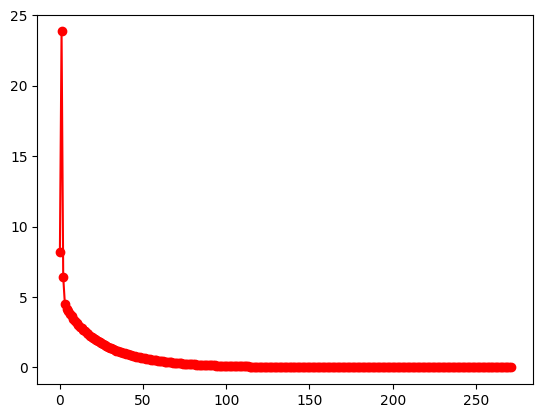

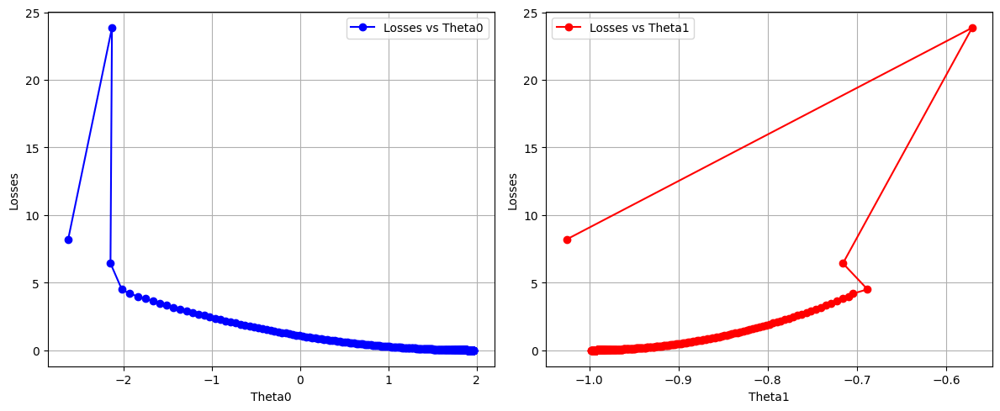

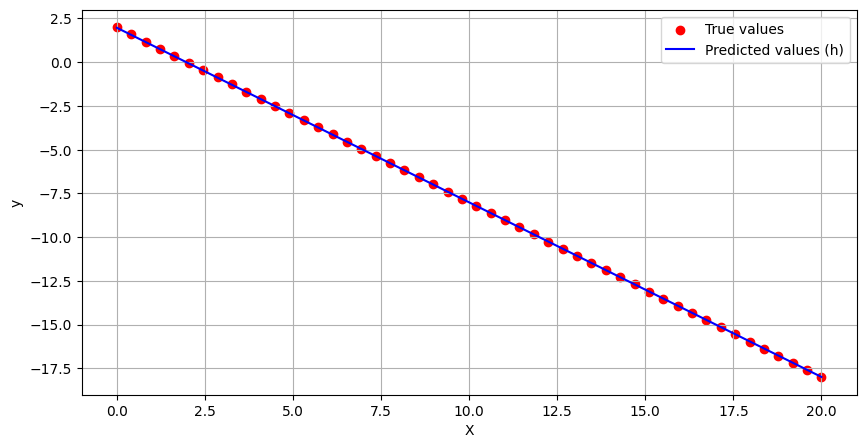

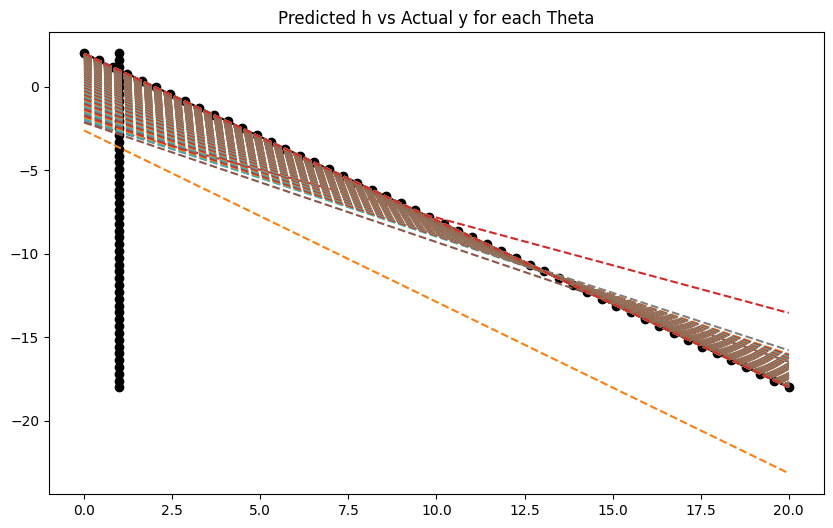

In [214]:
learning_rate = 0.5
epsilon = 1e-8
n_iterations = 5000

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


##### The following results uses alpha = 0.0005, epsilon =  1e-08, and max. iterations = 5000.

Final Theta_0: 0.777641092242393
Final Theta_1: -1.0592006698104781
Final R² Score: 0.9016


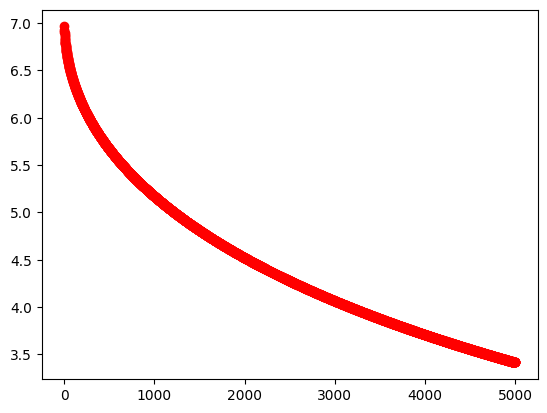

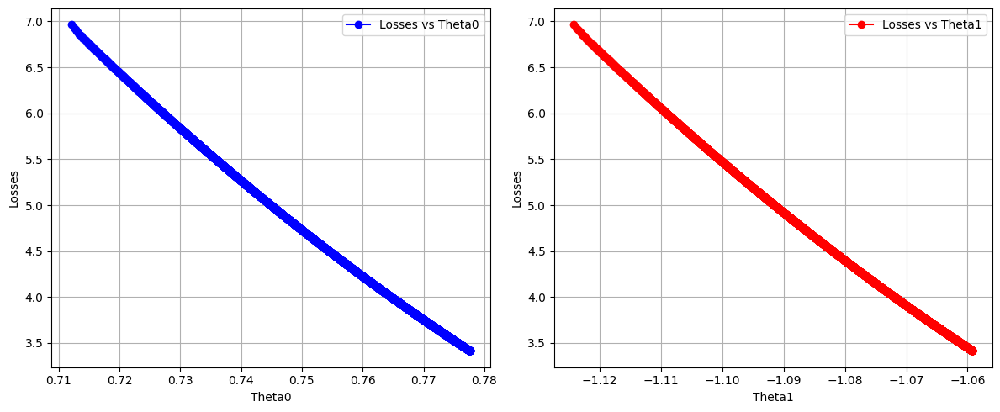

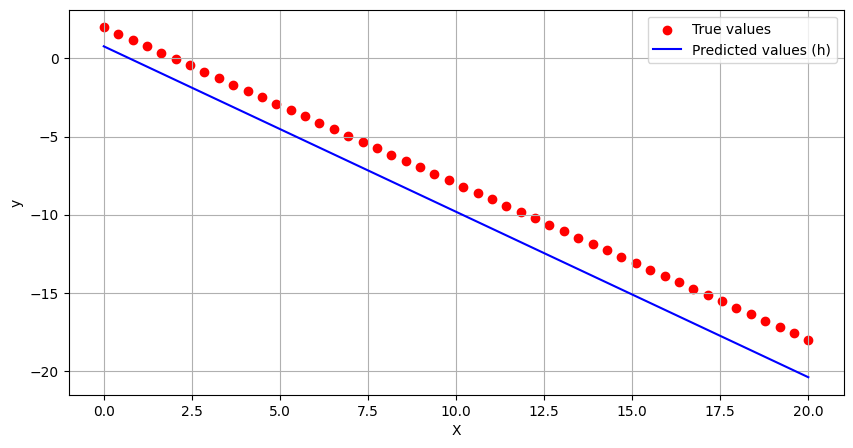

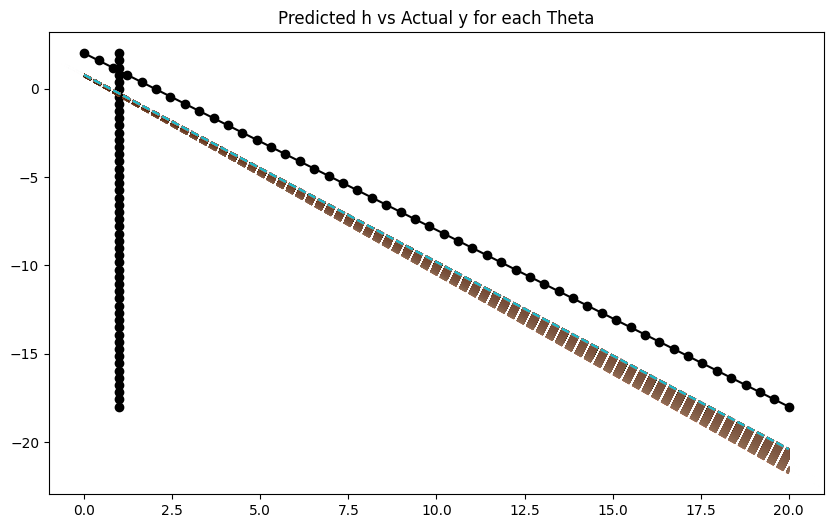

In [228]:
learning_rate = 0.0005
epsilon = 1e-8
n_iterations = 5000

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: 1.299315852585692
Final Theta_1: -0.9475976398508935
Final R² Score: 0.9964


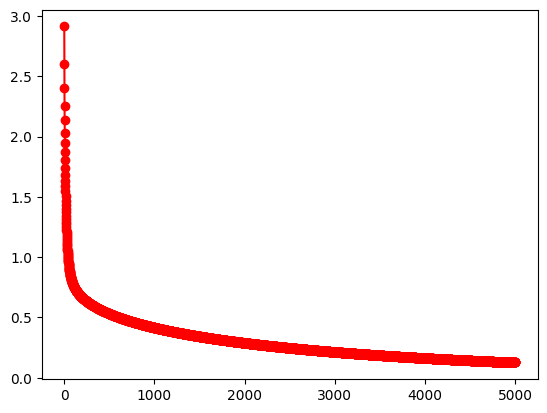

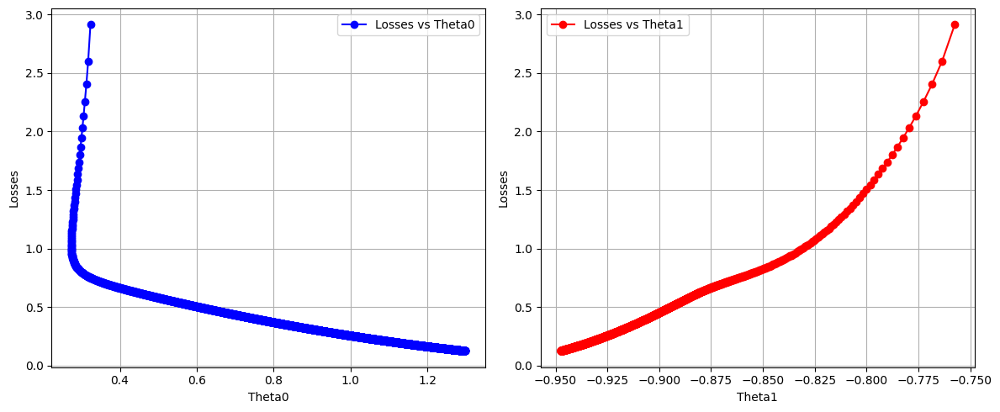

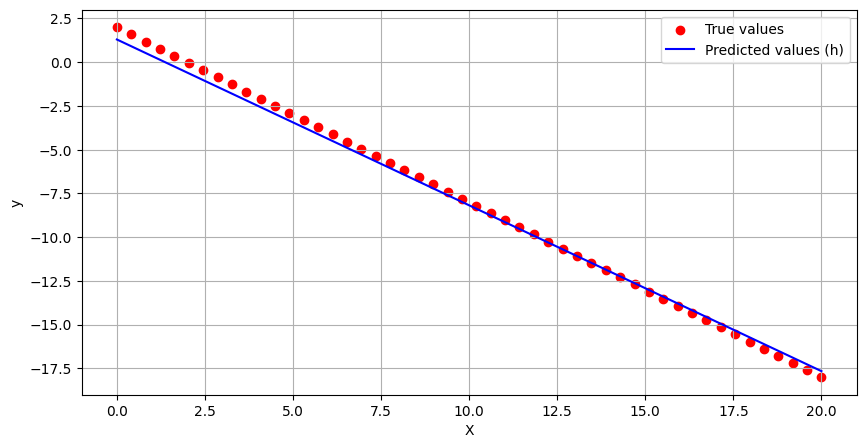

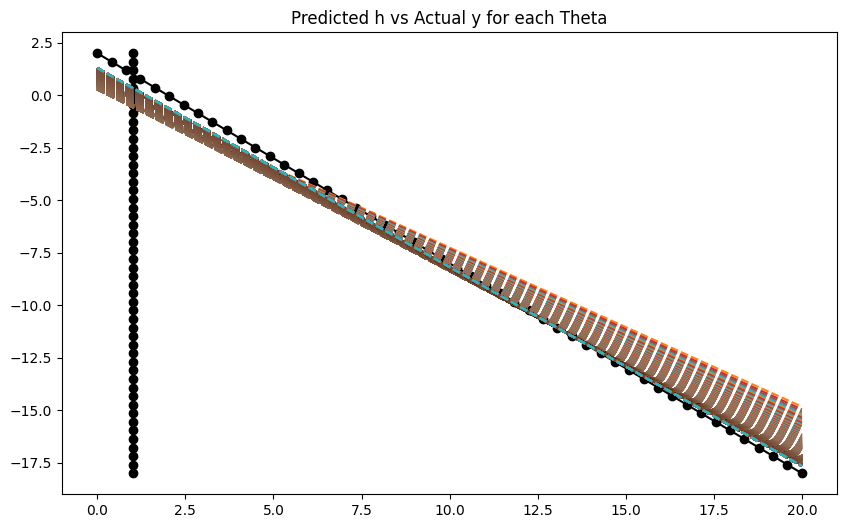

In [230]:
learning_rate = 0.009
epsilon = 1e-8
n_iterations = 5000

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


Final Theta_0: 0.4905896706383372
Final Theta_1: -0.8872209252143991
Final R² Score: 0.9831


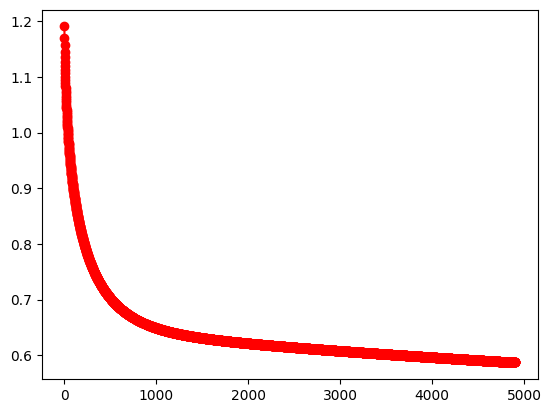

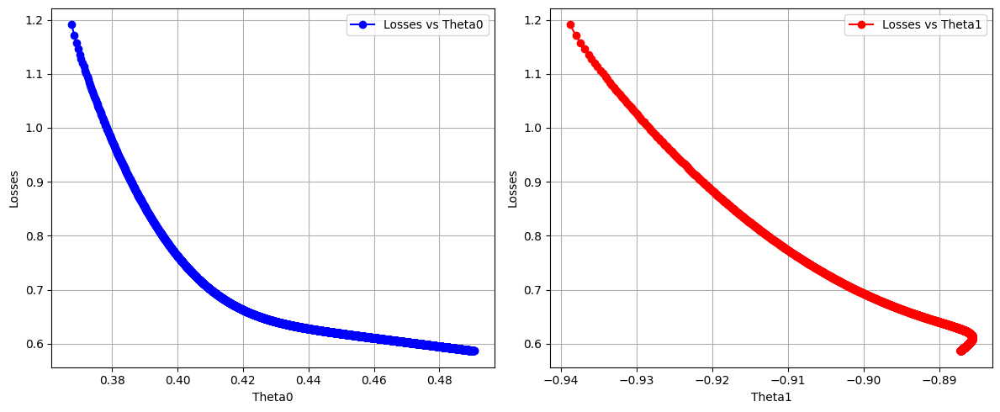

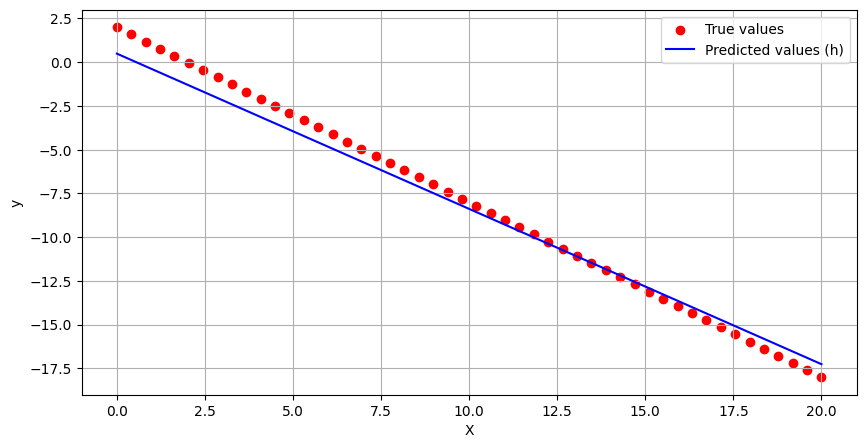

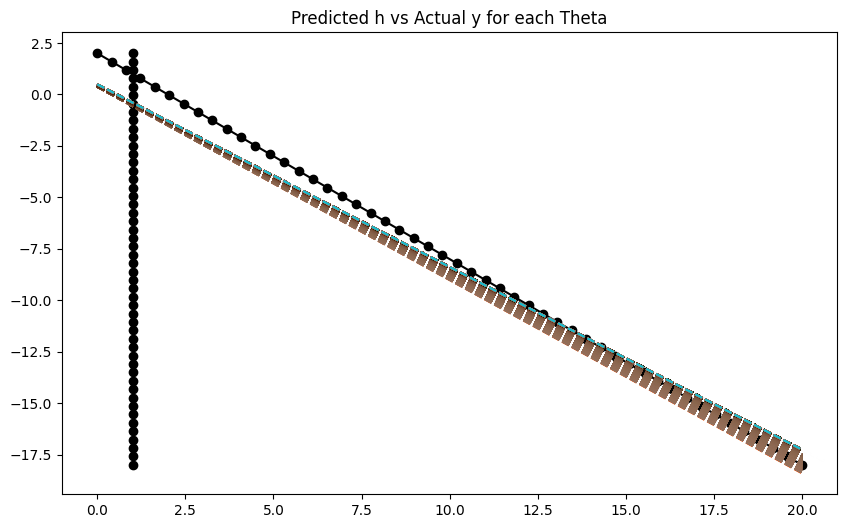

In [246]:
learning_rate = 0.0011
epsilon = 1e-8
n_iterations = 5000

theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, optimal_theta = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
print(f"Final Theta_0: {optimal_theta[0,0]}")
print(f"Final Theta_1: {optimal_theta[1,0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta)):.4f}")

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)


## RMSProp

### Update the previos implementation to be RMSProp.
#### Compare your results with Adagrad results.

In [247]:
def rmsprop_optimization(X, y, learning_rate, epsilon, n_iterations, decay_rate=0.9):
    m = len(y)
    theta = np.zeros((X.shape[1], 1))
    cache = np.zeros_like(theta)
    theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist = [], [], [], []

    for i in range(n_iterations):
        prediction = X.dot(theta)
        gradients = (2/m) * X.T.dot(prediction - y)
        cache = decay_rate * cache + (1 - decay_rate) * gradients ** 2
        theta -= learning_rate * gradients / (np.sqrt(cache) + epsilon)

        loss = np.mean((prediction - y) ** 2)

        theta_0_hist.append(theta[0, 0])
        theta_1_hist.append(theta[1, 0])
        loss_hist.append(loss)
        hypothesis_hist.append(prediction)

    return theta_0_hist, theta_1_hist, loss_hist, hypothesis_hist, theta



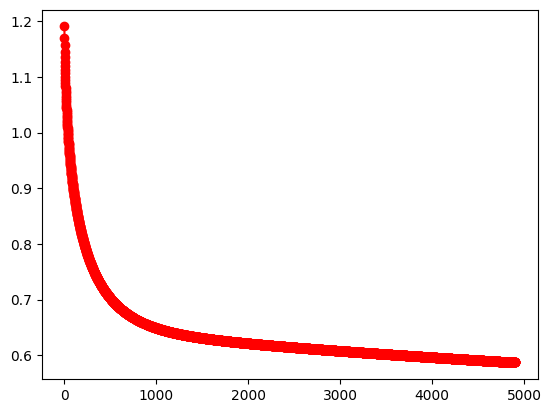

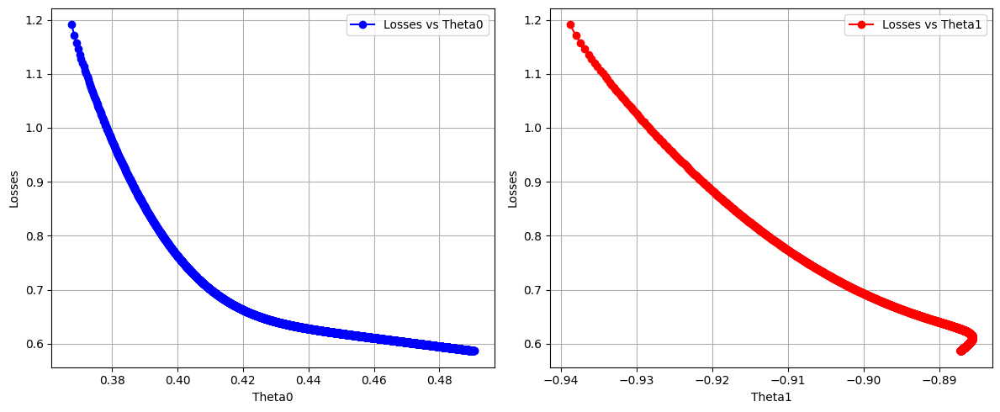

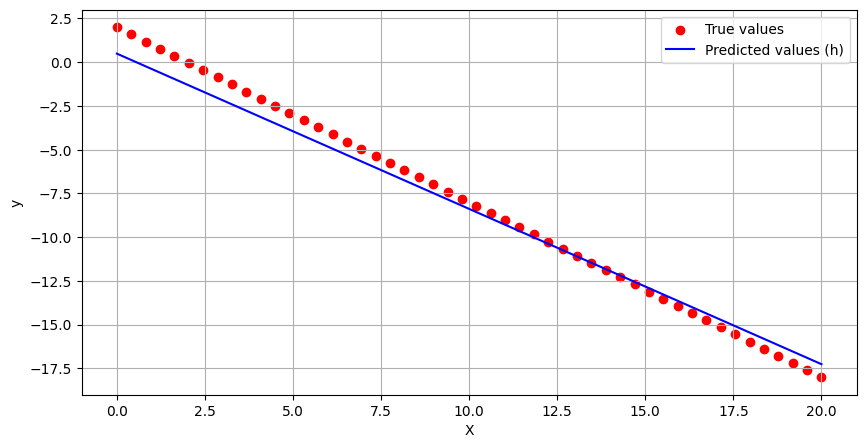

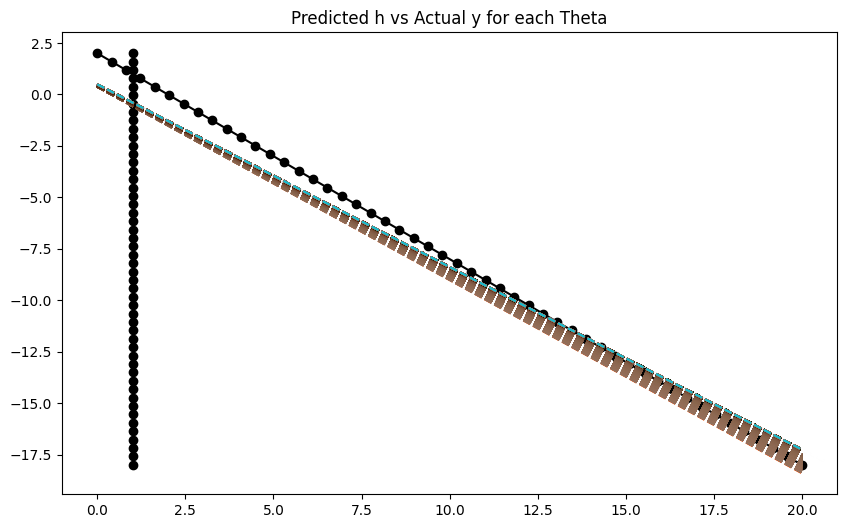

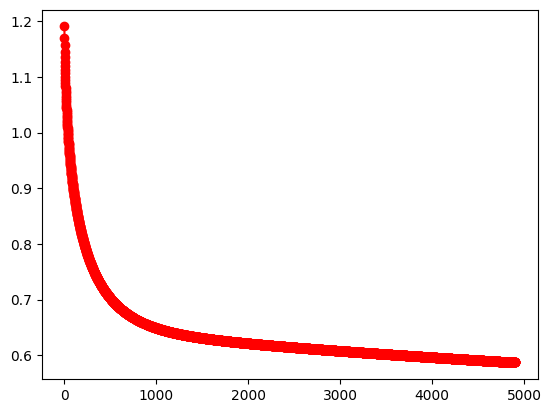

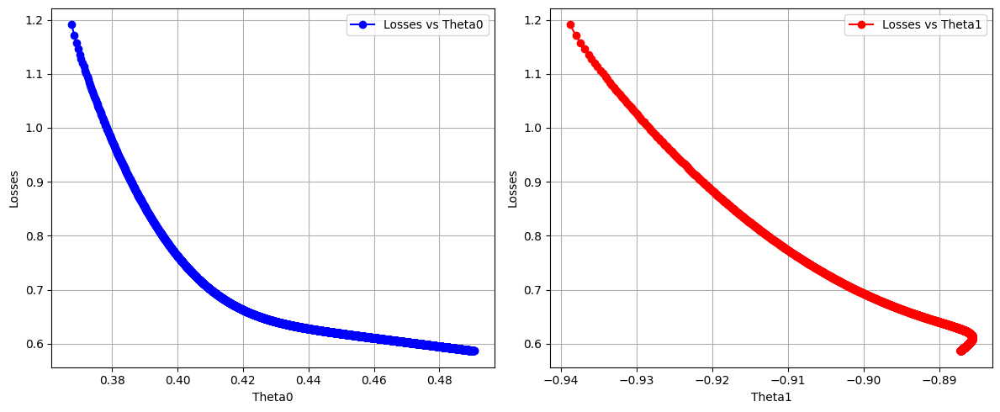

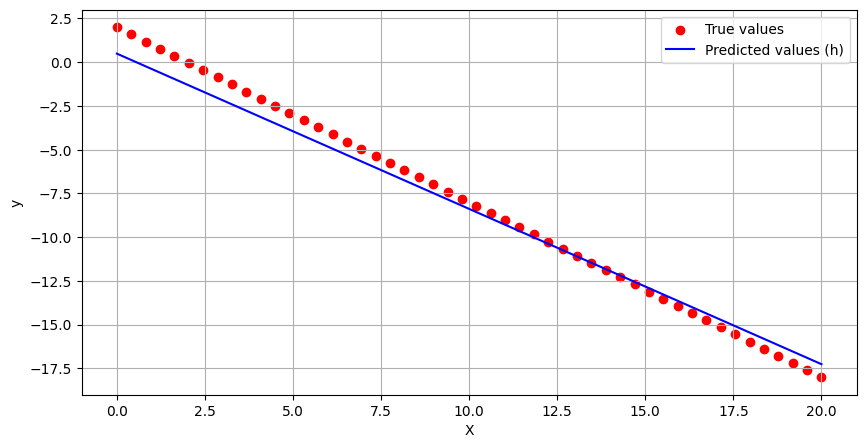

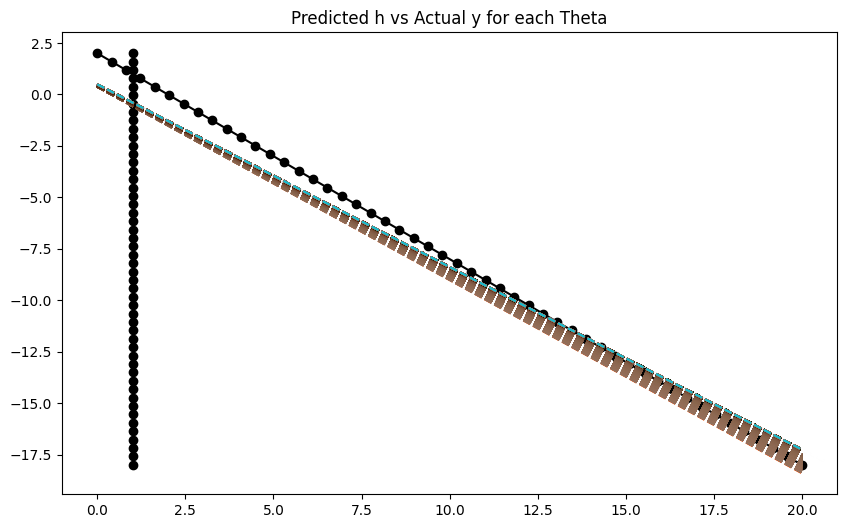

RMSProp Results:
Final Theta_0: 1.3194666092037086
Final Theta_1: -0.9542055950076841
Final R² Score: 0.9965

AdaGrad Results:
Final Theta_0: -0.26392467729011915
Final Theta_1: -0.8506486321642631
Final R² Score: 0.9606


In [248]:
learning_rate = 0.01
epsilon = 1e-8
n_iterations = 300
decay_rate = .9
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


##### The following results uses alpha = 0.05, beta = 0.9, epsilon =  1e-08, and max. iterations = 500.

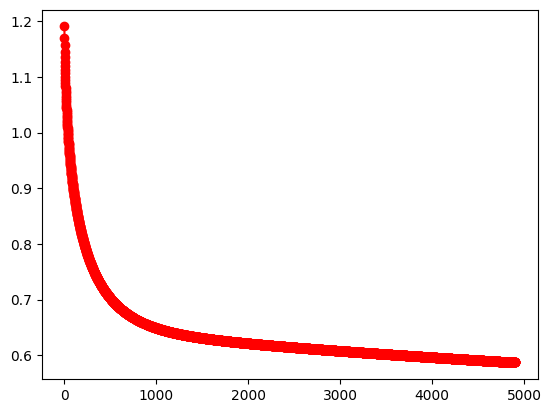

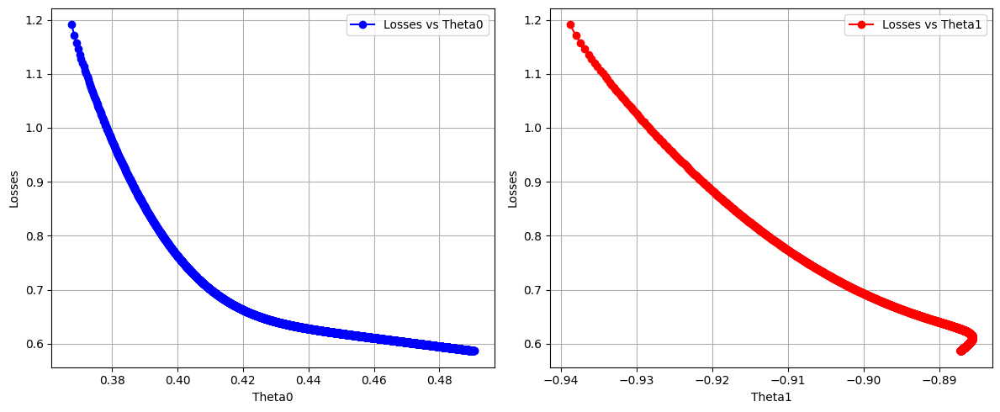

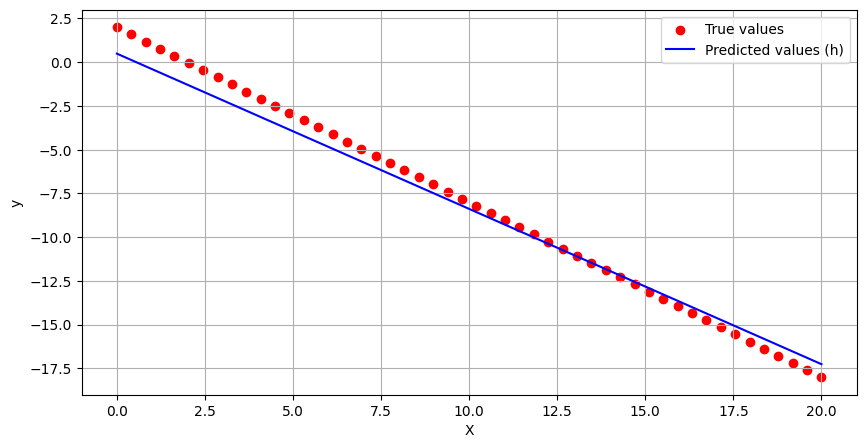

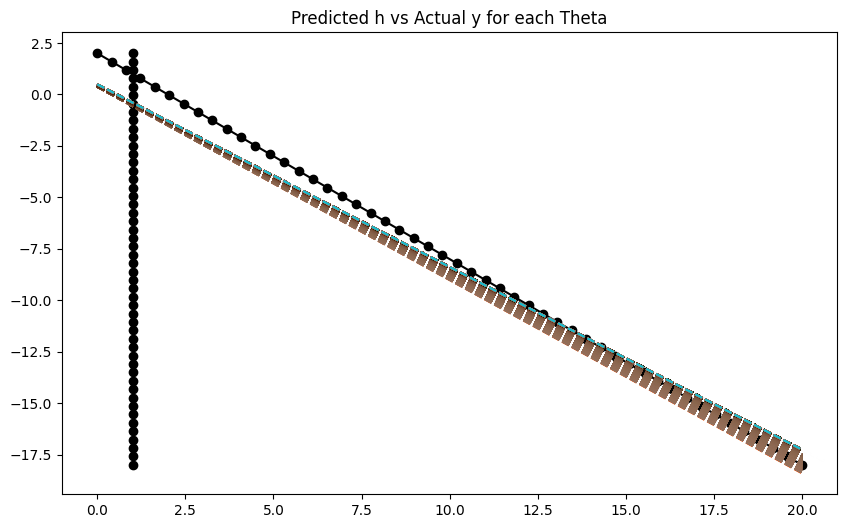

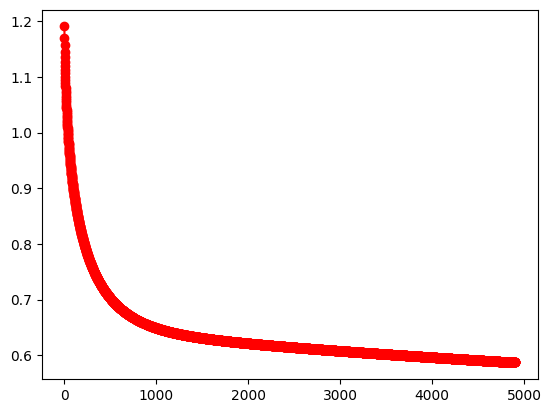

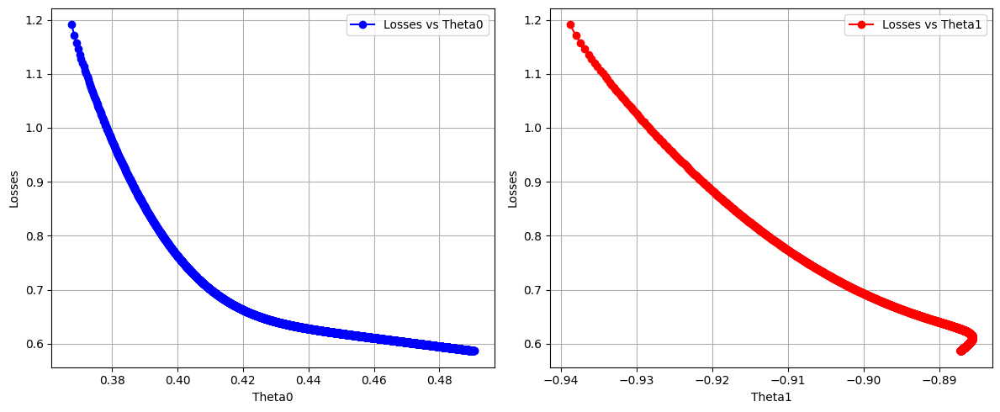

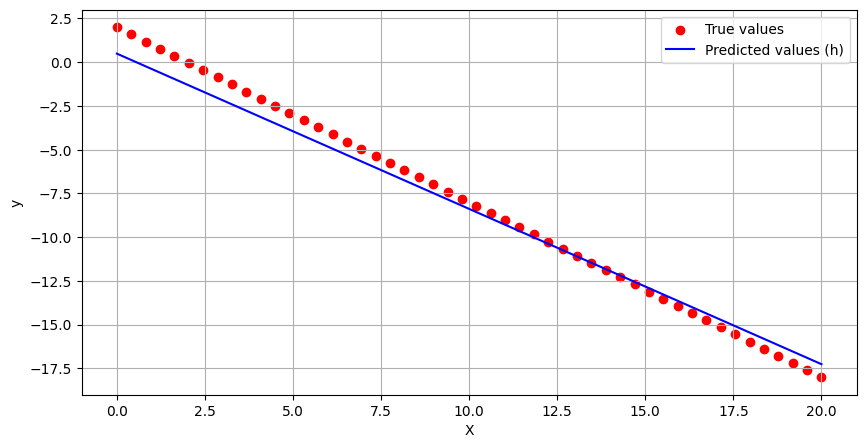

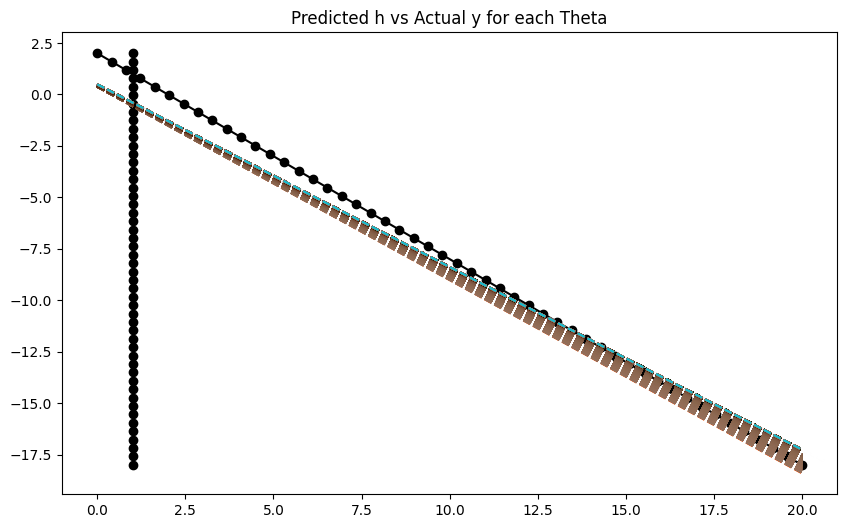

RMSProp Results:
Final Theta_0: 1.9749999886134395
Final Theta_1: -1.0249999990379546
Final R² Score: 0.9972

AdaGrad Results:
Final Theta_0: -1.4571595140283256
Final Theta_1: -0.518666835776891
Final R² Score: 0.7153


In [249]:
learning_rate = 0.05
epsilon = 1e-8
n_iterations = 500
decay_rate = .9
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


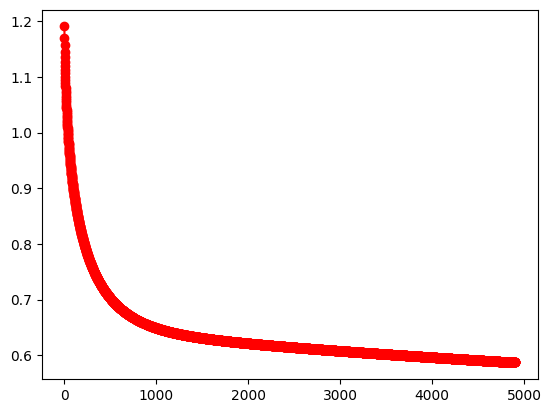

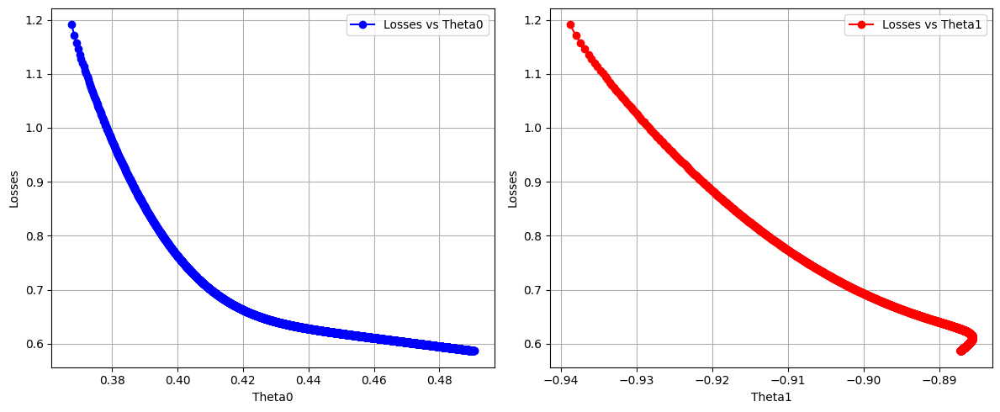

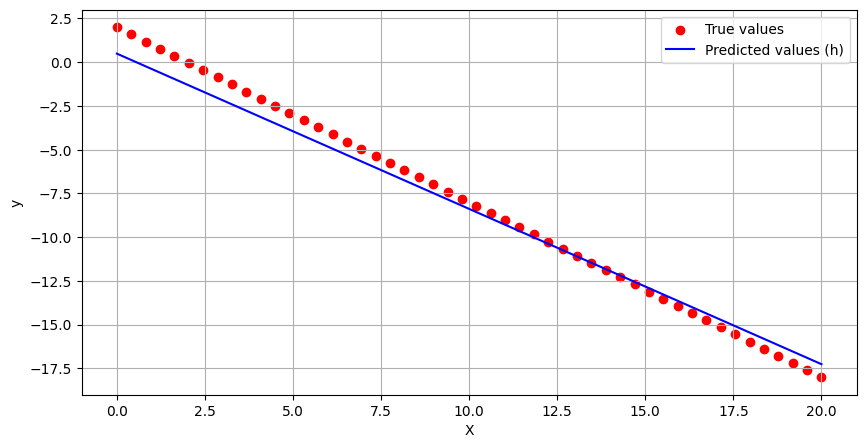

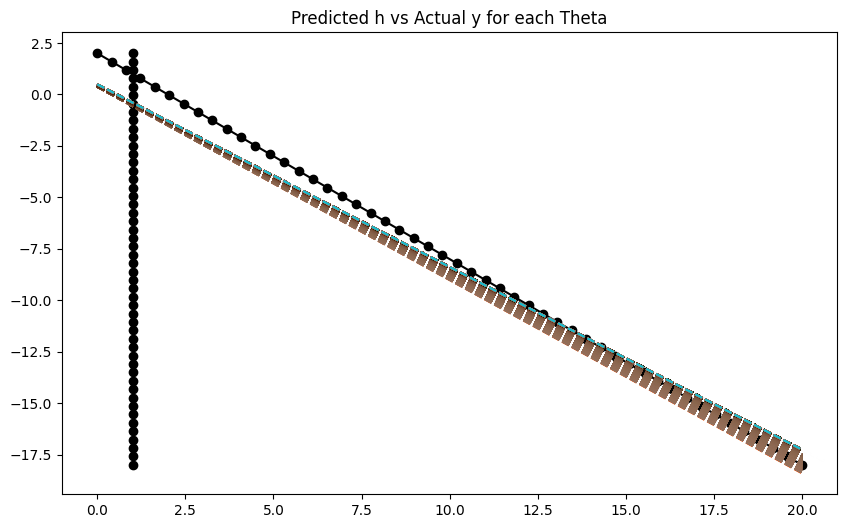

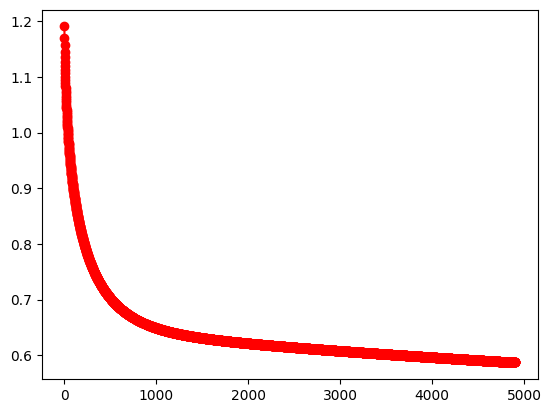

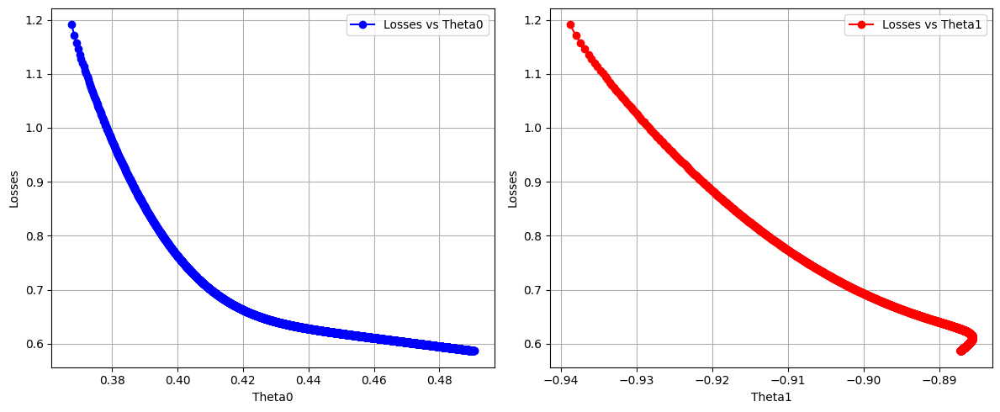

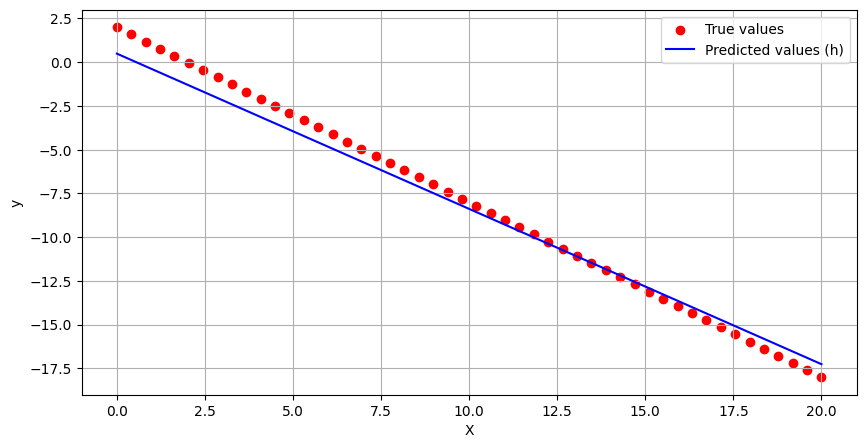

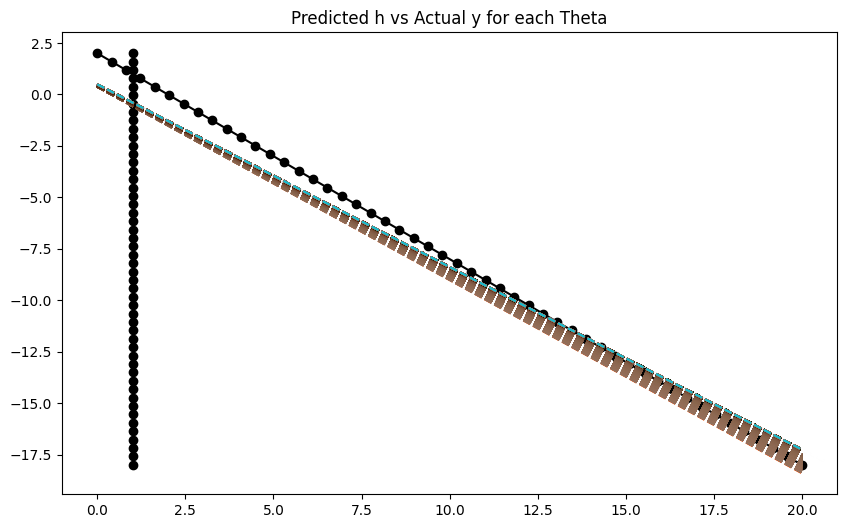

RMSProp Results:
Final Theta_0: 1.2646526467476813
Final Theta_1: -0.939861354483718
Final R² Score: 0.9959

AdaGrad Results:
Final Theta_0: -1.2980197835423404
Final Theta_1: 0.18988613226227452
Final R² Score: -2.5480


In [250]:
learning_rate = 0.01
epsilon = 1e-8
n_iterations = 300
decay_rate = .92
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


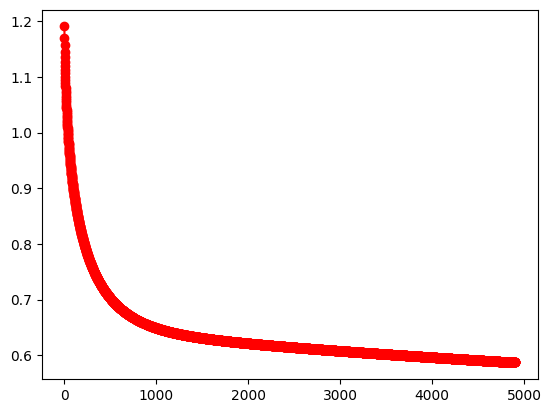

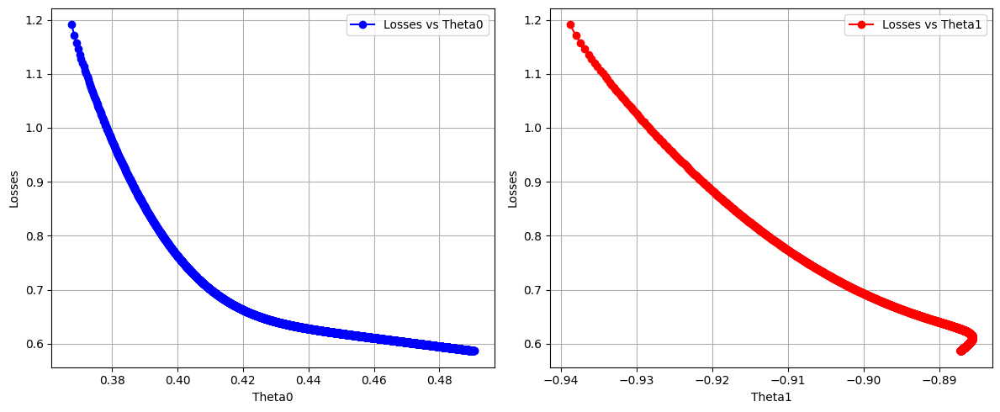

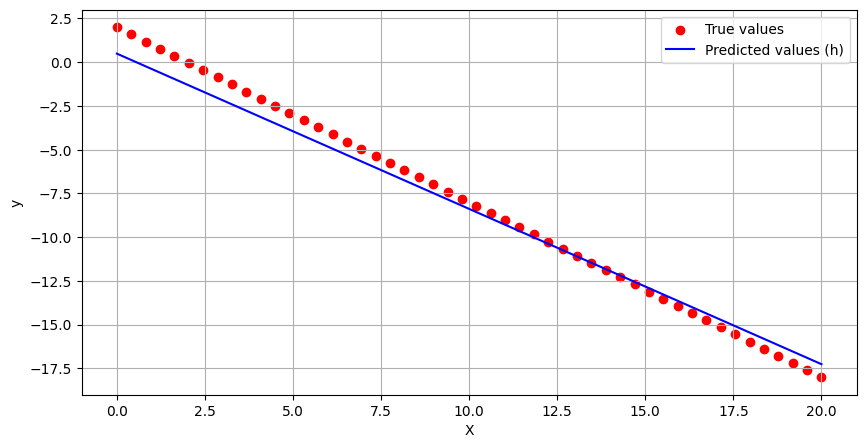

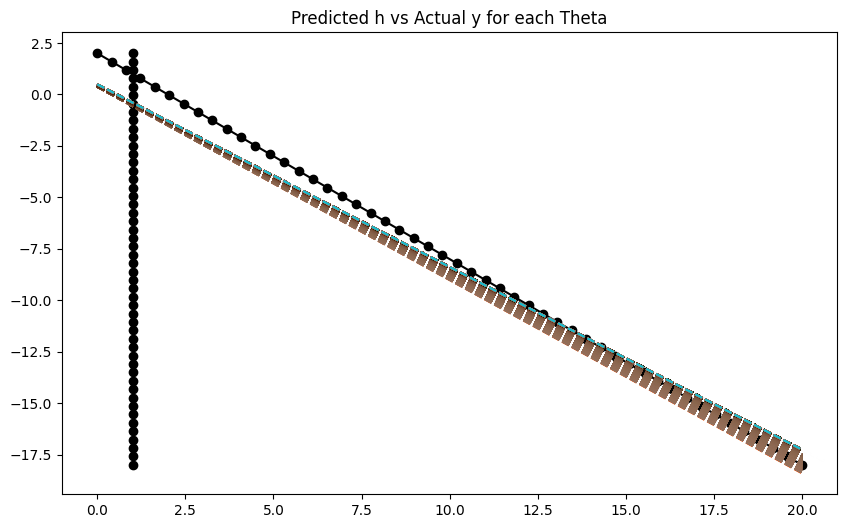

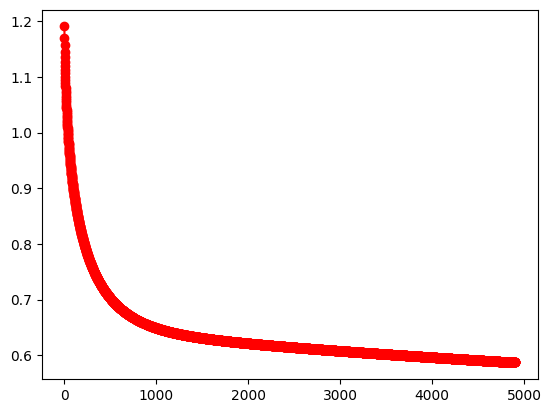

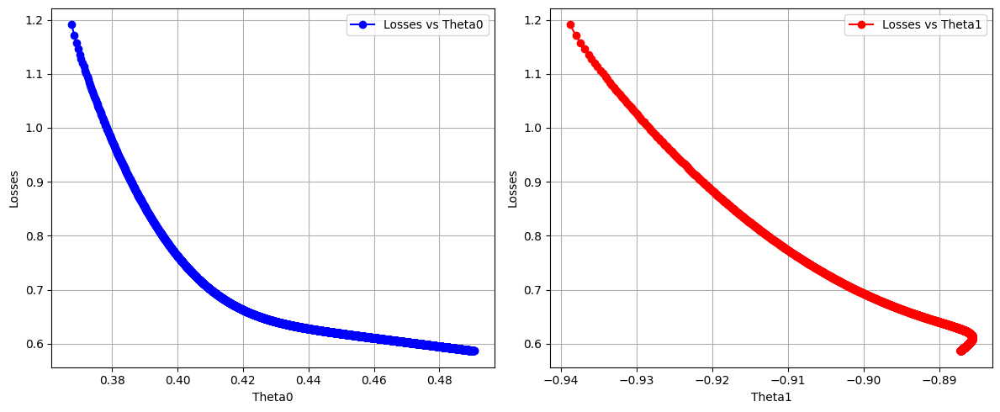

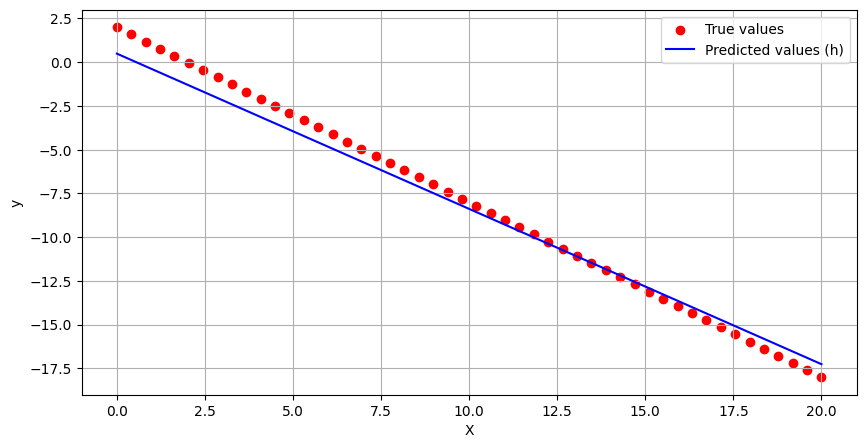

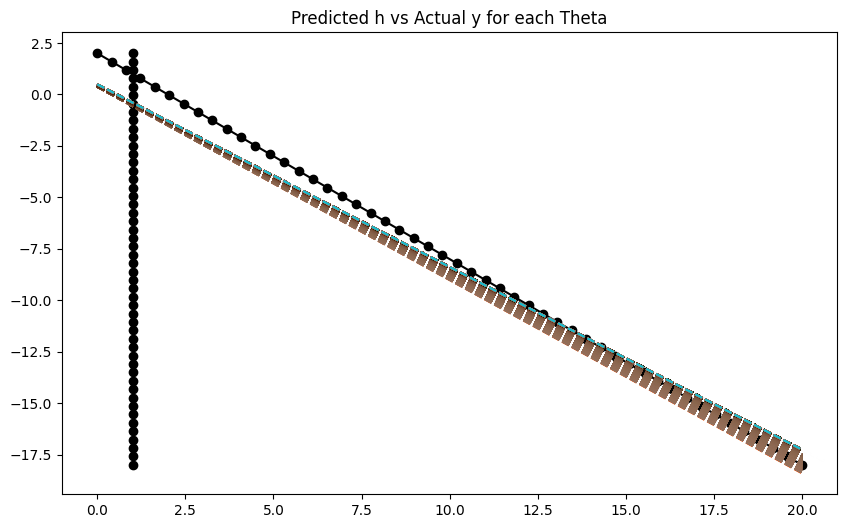

RMSProp Results:
Final Theta_0: 1.4322922074722508
Final Theta_1: -0.9625747991497076
Final R² Score: 0.9975

AdaGrad Results:
Final Theta_0: -0.19923996268450567
Final Theta_1: -0.8366271722897738
Final R² Score: 0.9641


In [251]:
learning_rate = 0.01
epsilon = 1e-8
n_iterations = 300
decay_rate = .8
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


##### The following results uses alpha = 0.005, beta = 0.9, epsilon =  1e-08, and max. iterations = 5000.

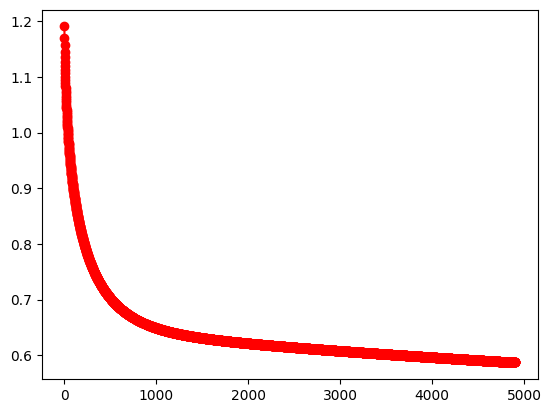

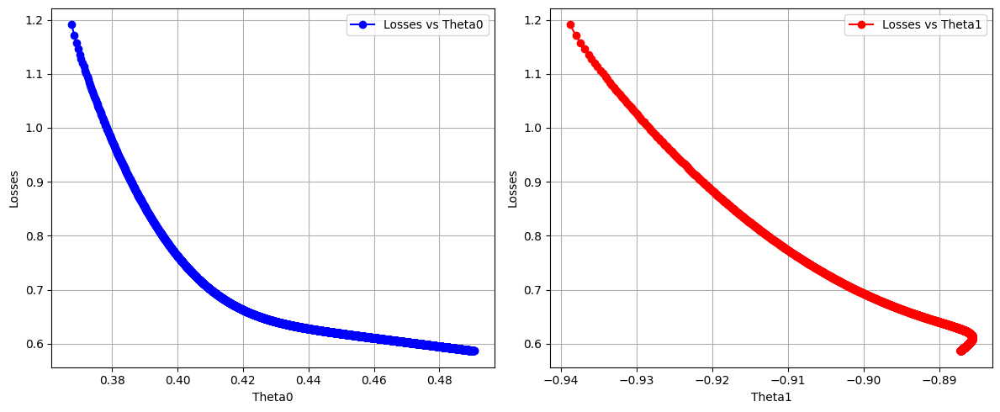

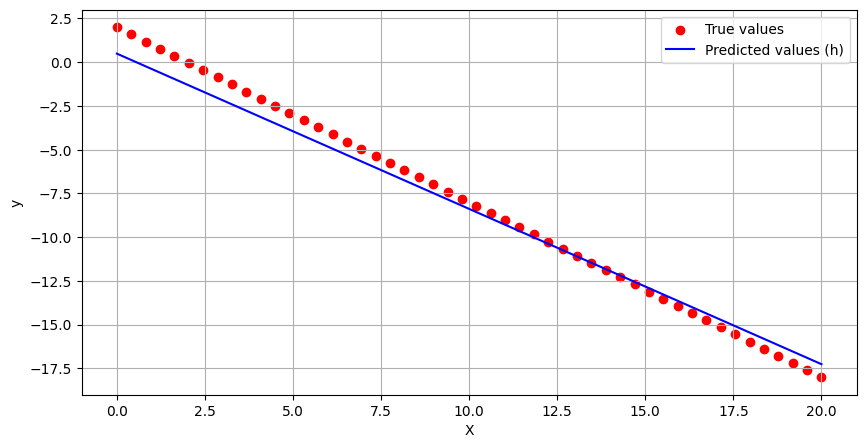

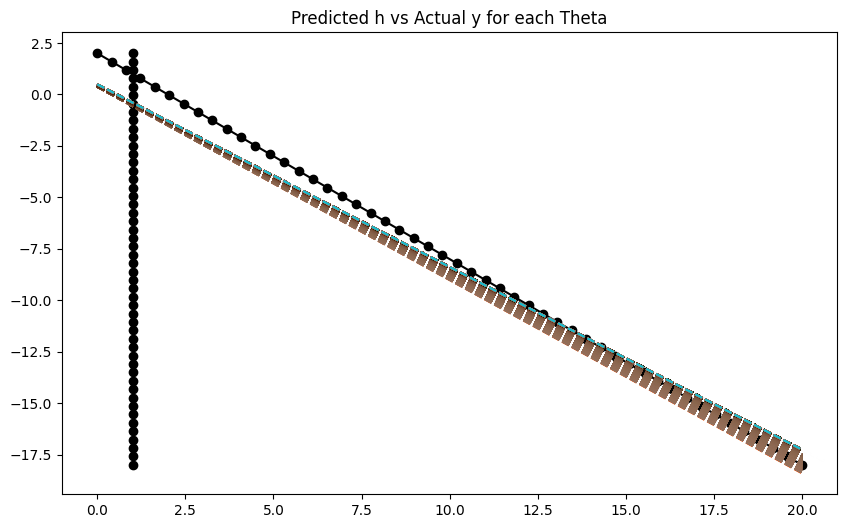

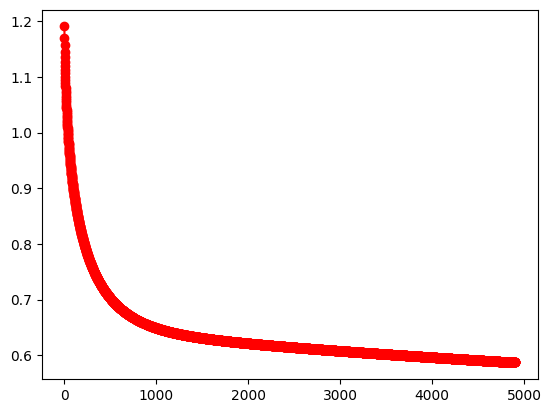

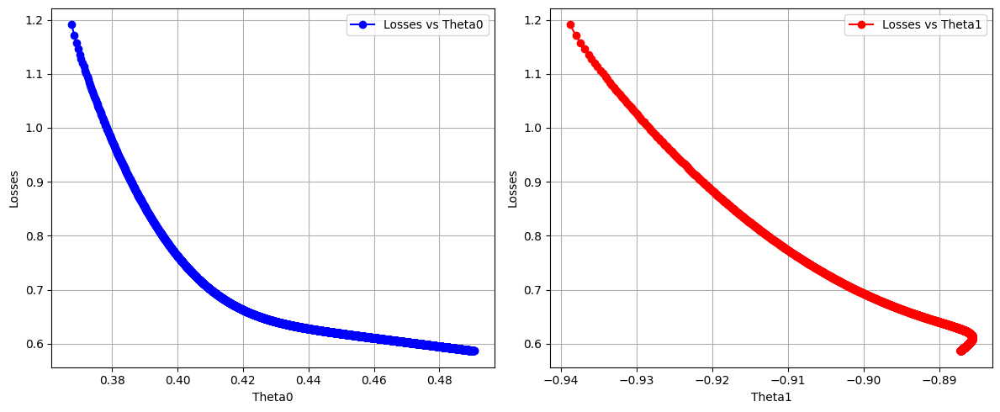

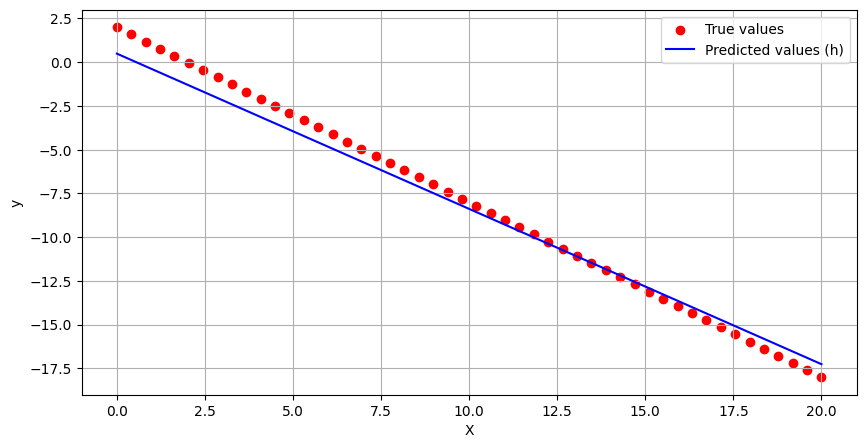

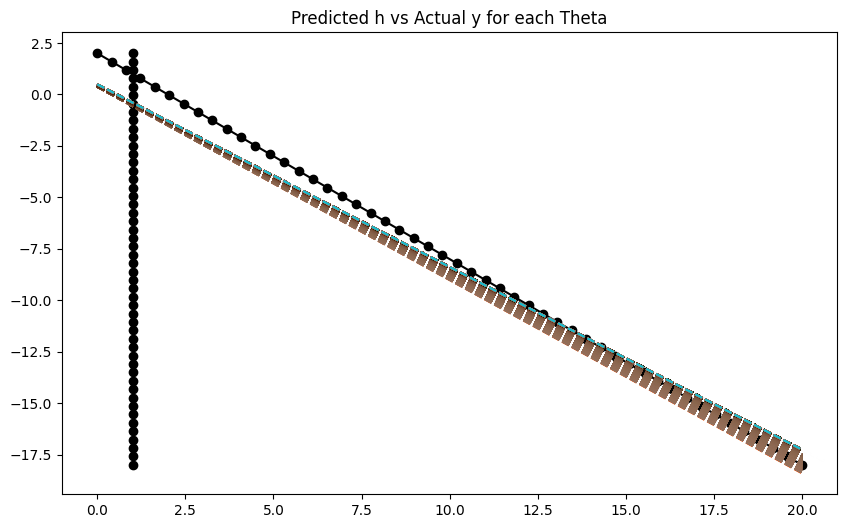

RMSProp Results:
Final Theta_0: 2.002499999545454
Final Theta_1: -0.9975000000345559
Final R² Score: 1.0000

AdaGrad Results:
Final Theta_0: 0.35348178831599886
Final Theta_1: -0.8764050554311219
Final R² Score: 0.9799


In [252]:
learning_rate = 0.005
epsilon = 1e-8
n_iterations = 5000
decay_rate = .9
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


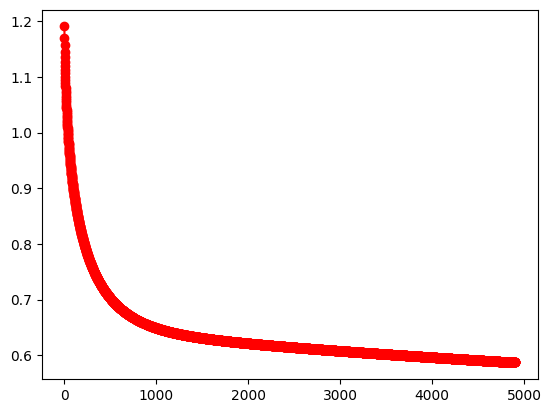

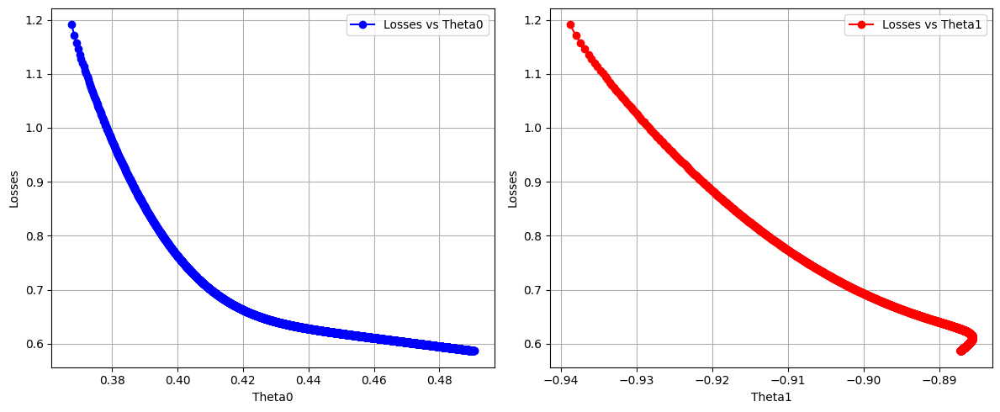

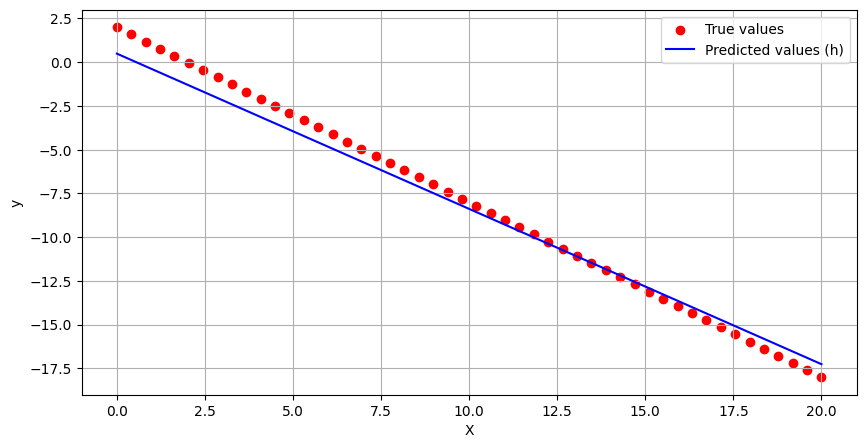

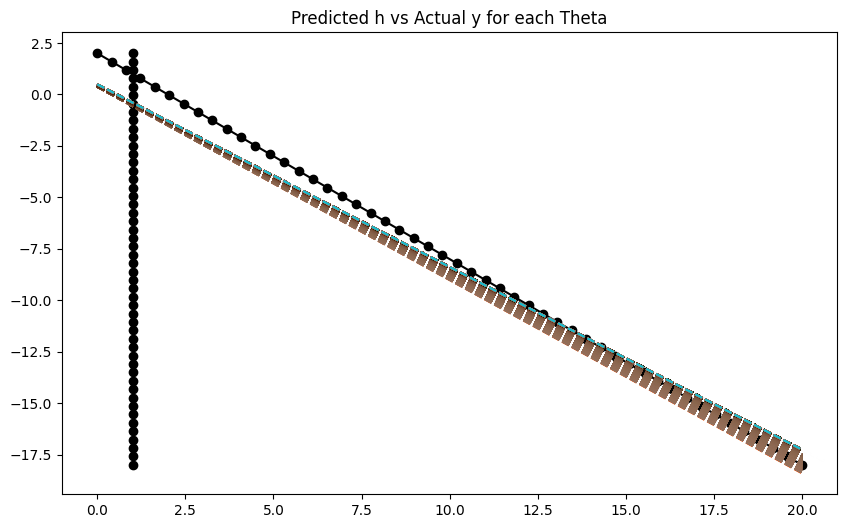

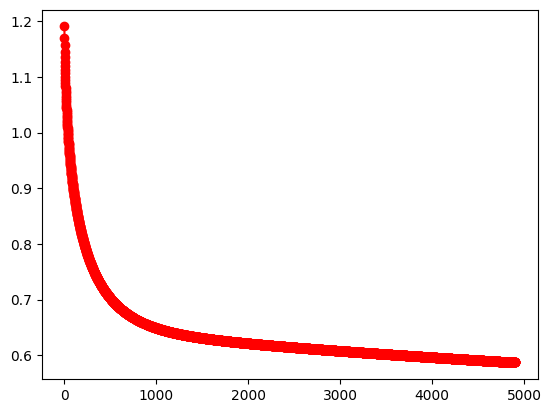

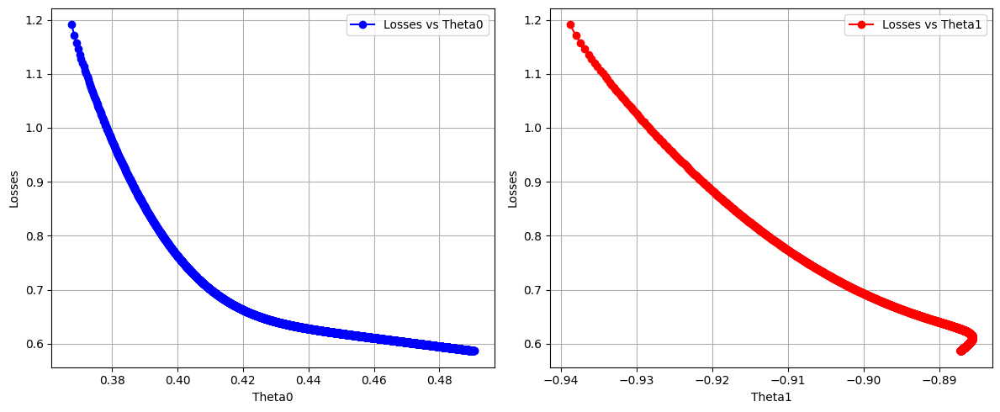

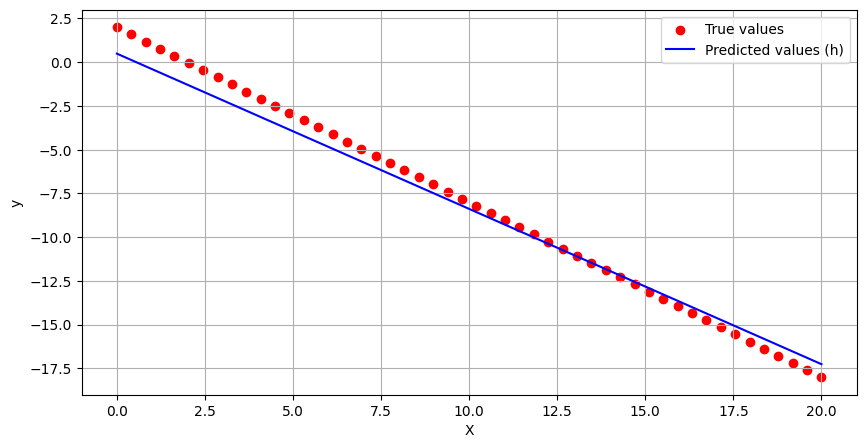

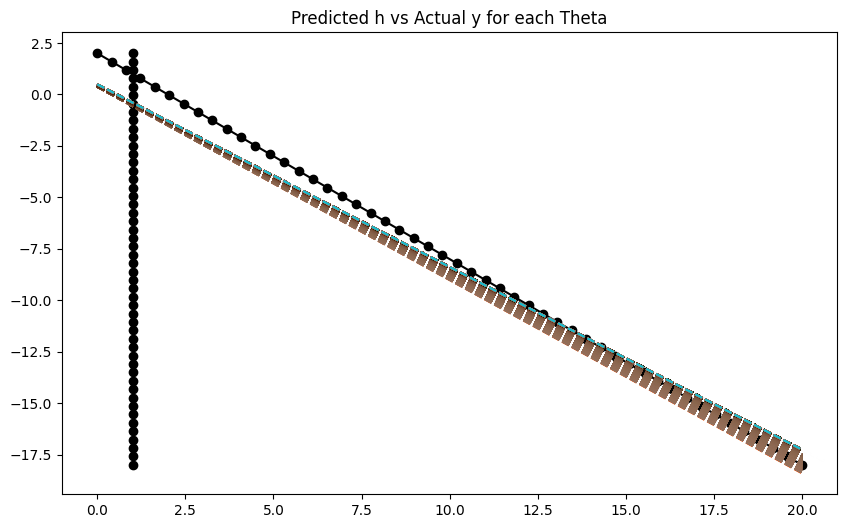

RMSProp Results:
Final Theta_0: 0.9845672782571092
Final Theta_1: -0.9219145542885848
Final R² Score: 0.9923

AdaGrad Results:
Final Theta_0: -0.36029334502817456
Final Theta_1: -1.009025005069028
Final R² Score: 0.8268


In [253]:
learning_rate = 0.005
epsilon = 1e-8
n_iterations = 500
decay_rate = .9
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


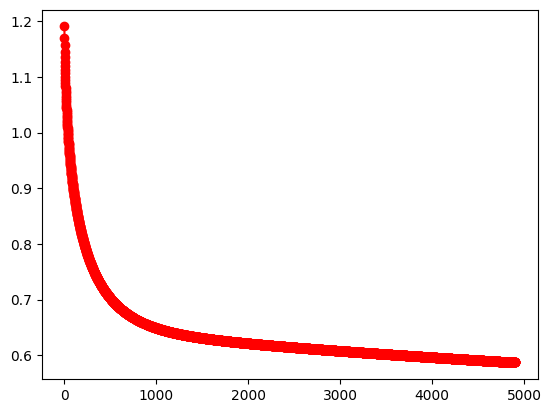

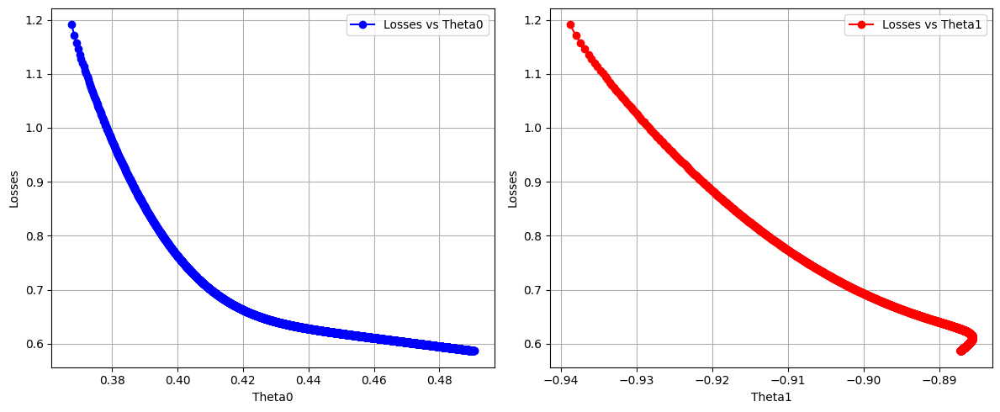

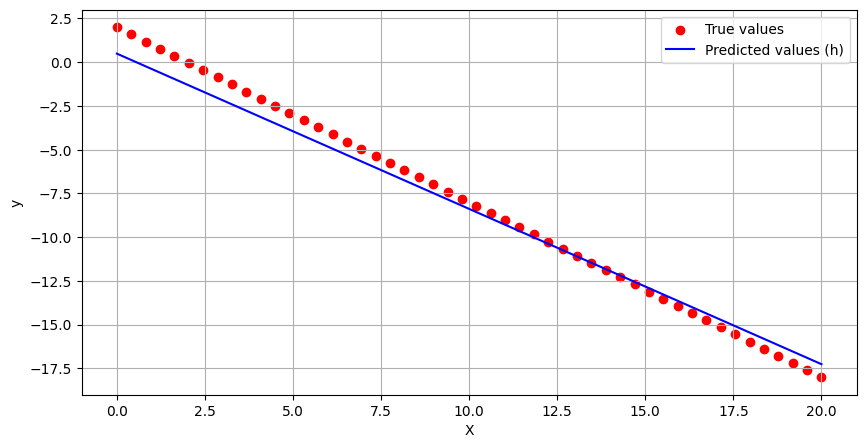

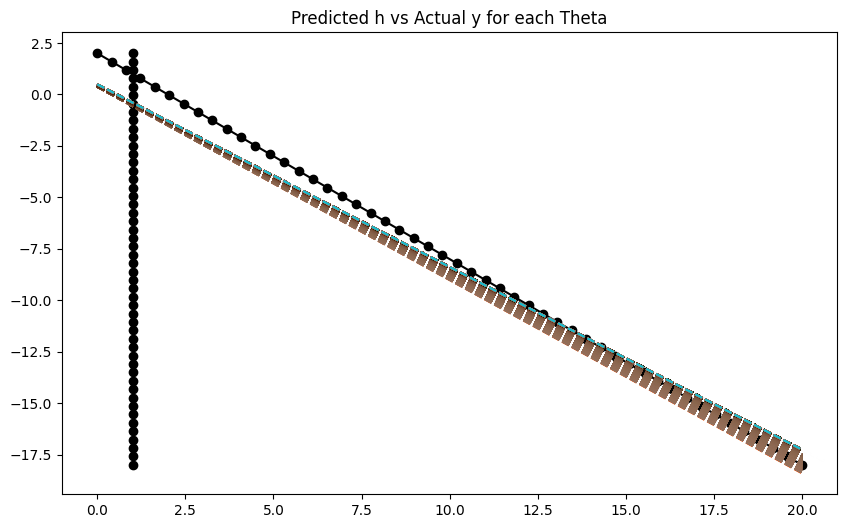

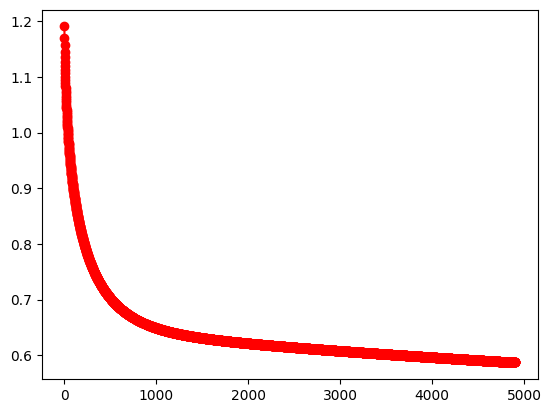

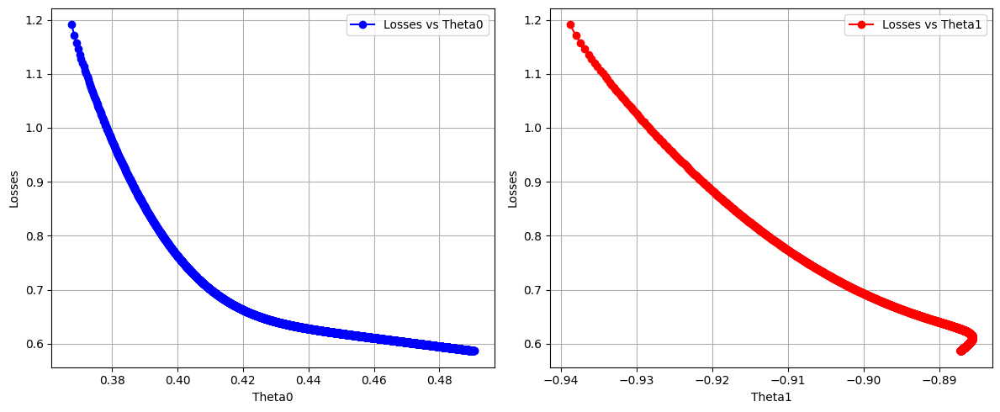

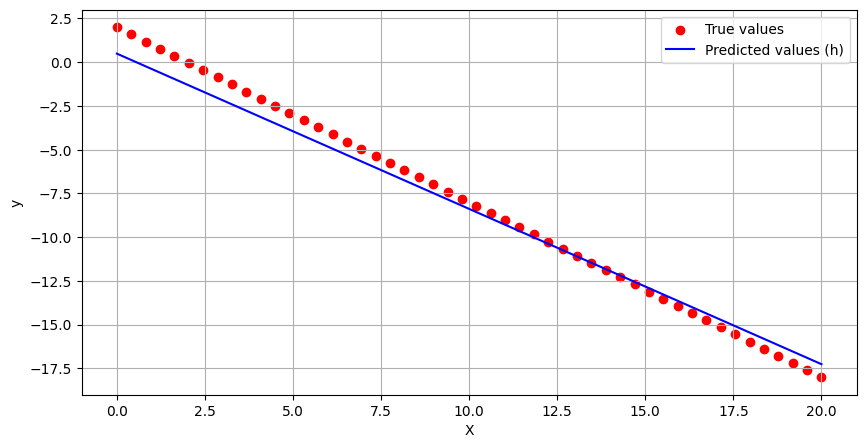

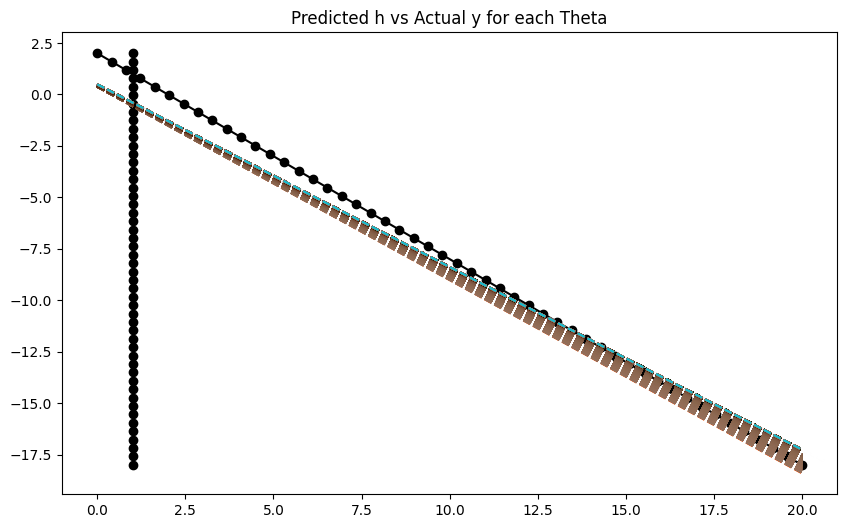

RMSProp Results:
Final Theta_0: 1.9749999886134395
Final Theta_1: -1.0249999990379546
Final R² Score: 0.9972

AdaGrad Results:
Final Theta_0: 1.090333361930703
Final Theta_1: -0.925122067186461
Final R² Score: 0.9936


In [254]:
learning_rate = 0.05
epsilon = 1e-8
n_iterations = 500
decay_rate = .9
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


##### The following results uses alpha = 0.0005, beta = 0.9, epsilon =  1e-08, and max. iterations = 5000.

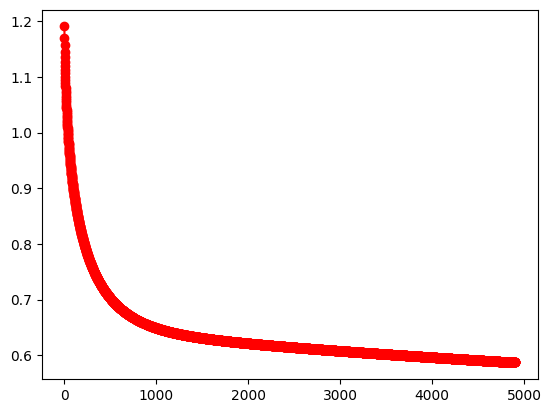

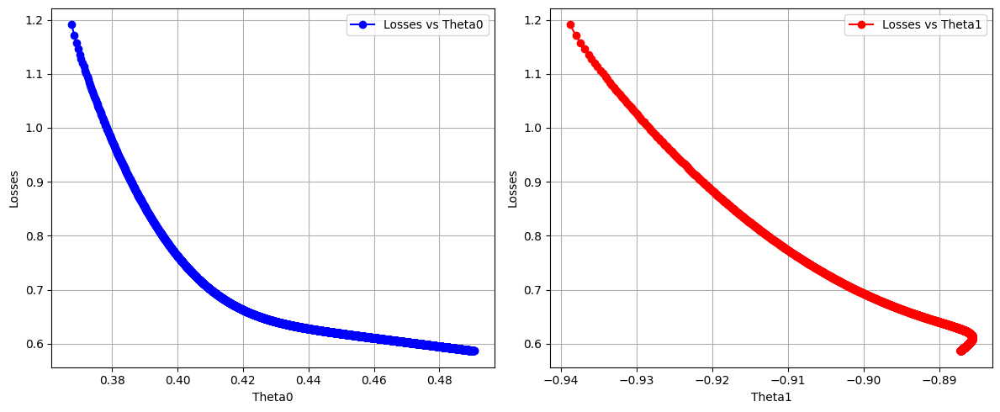

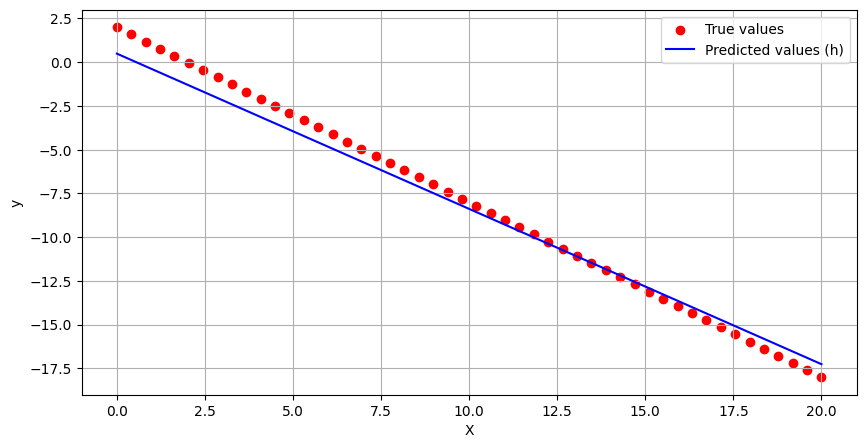

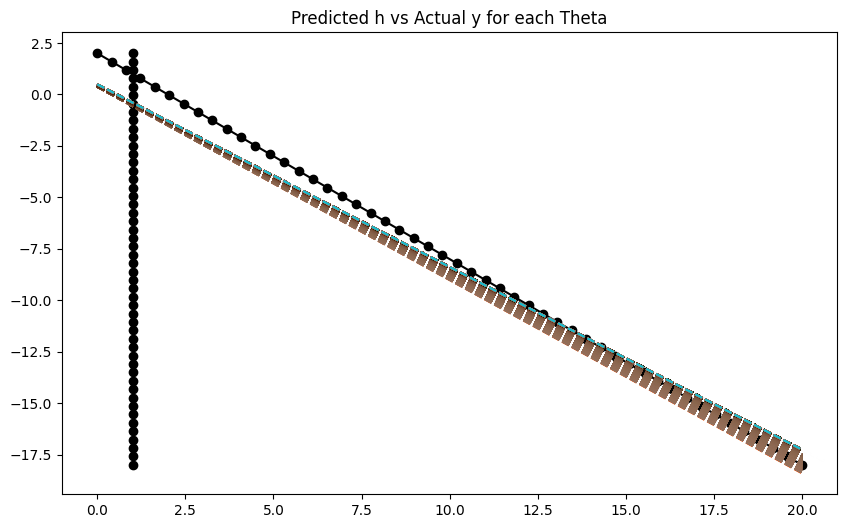

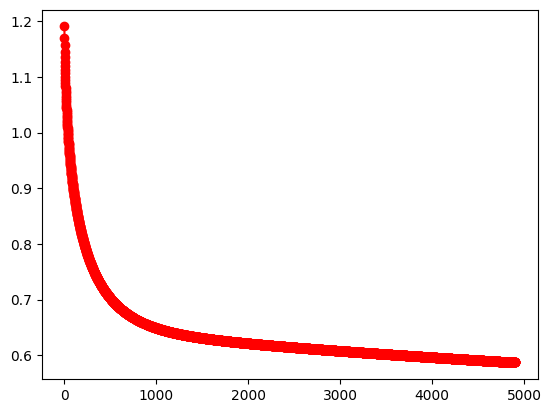

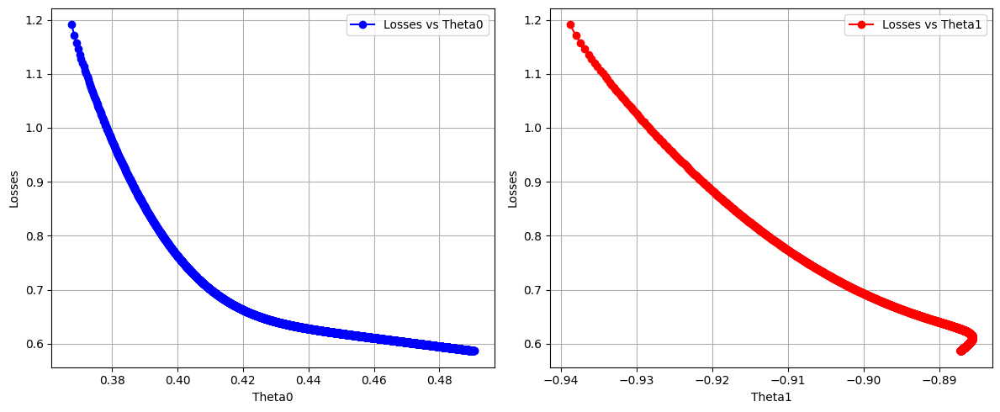

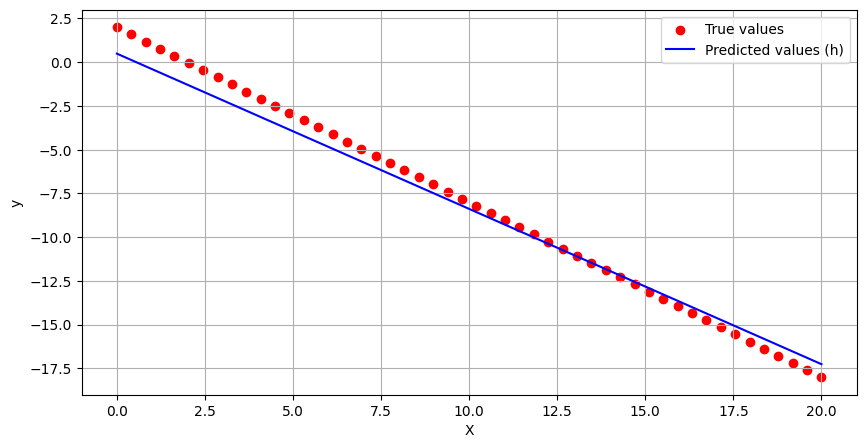

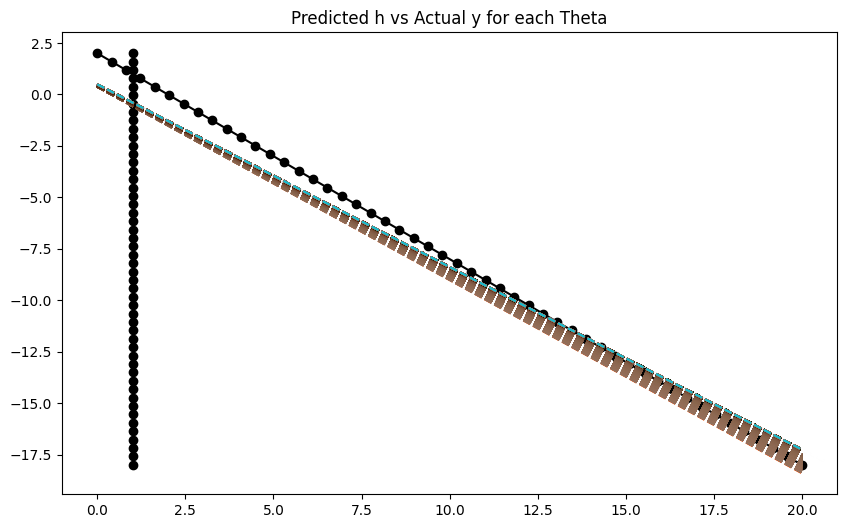

RMSProp Results:
Final Theta_0: 1.0530792795246429
Final Theta_1: -0.9294294652995158
Final R² Score: 0.9933

AdaGrad Results:
Final Theta_0: -0.7687124590012163
Final Theta_1: 0.14489941010295965
Final R² Score: -2.4826


In [255]:
learning_rate = 0.0005
epsilon = 1e-8
n_iterations = 5000
decay_rate = .9
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


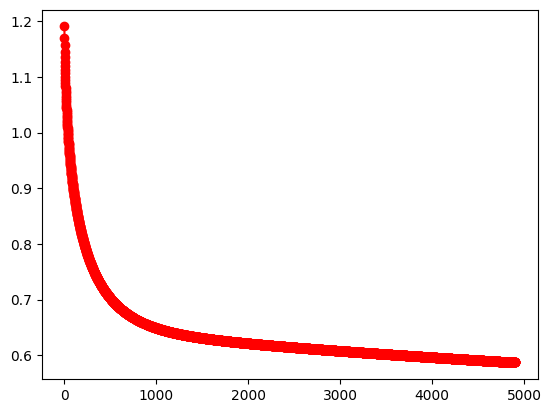

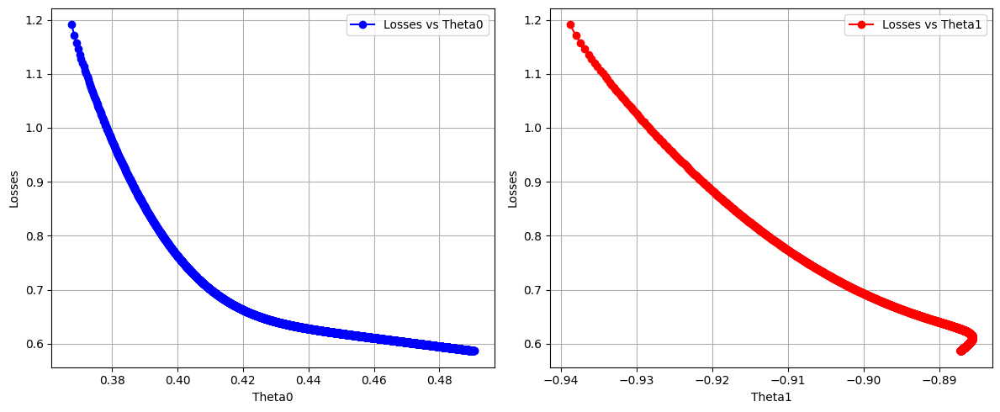

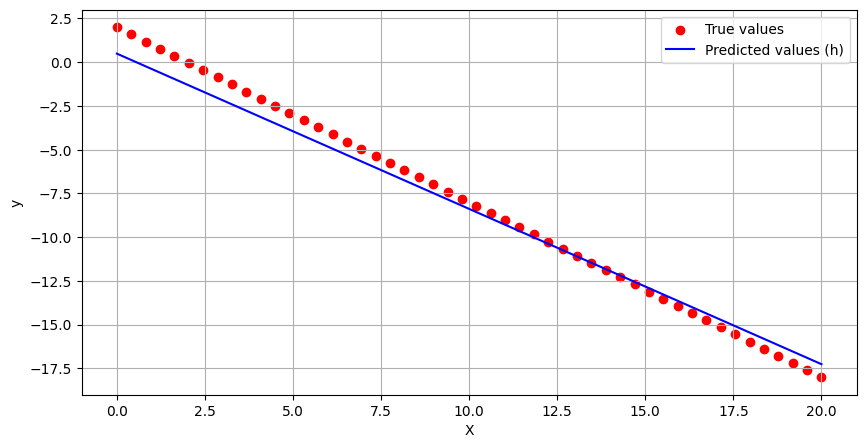

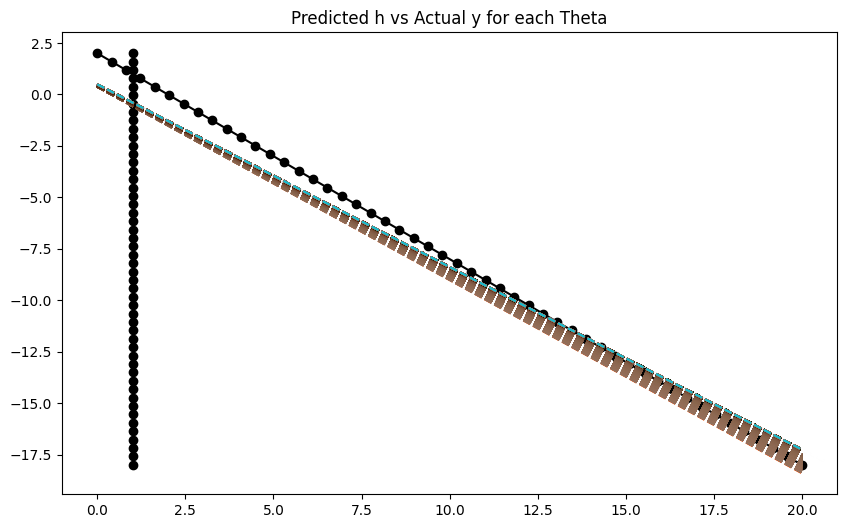

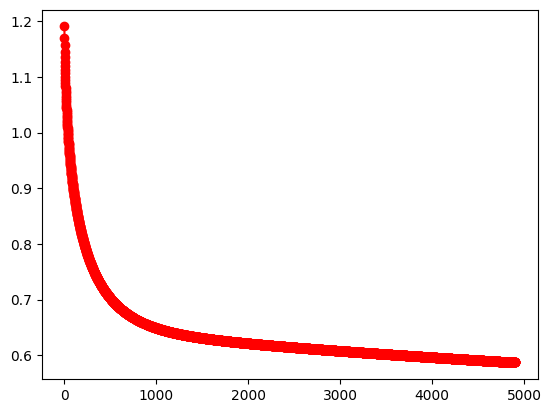

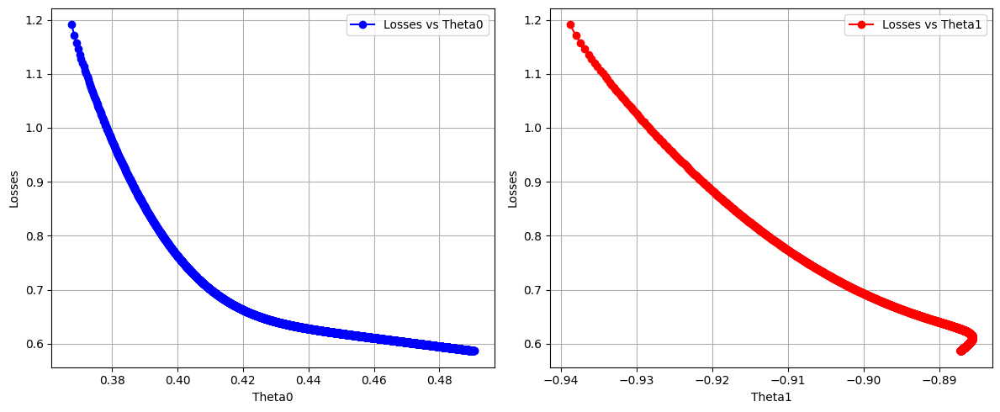

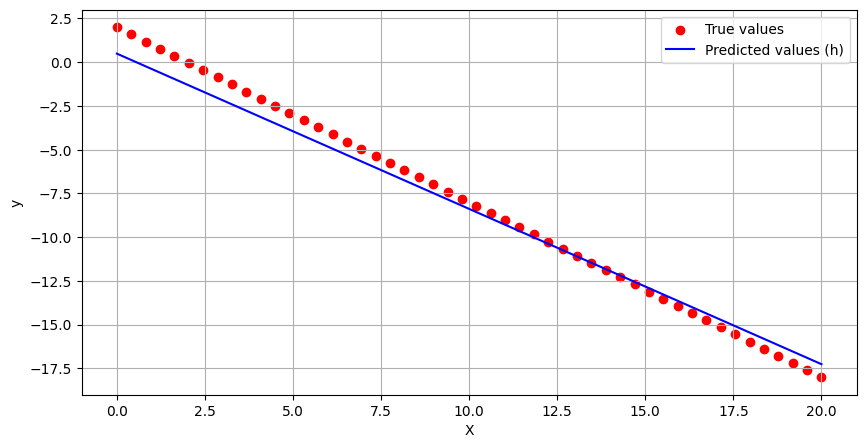

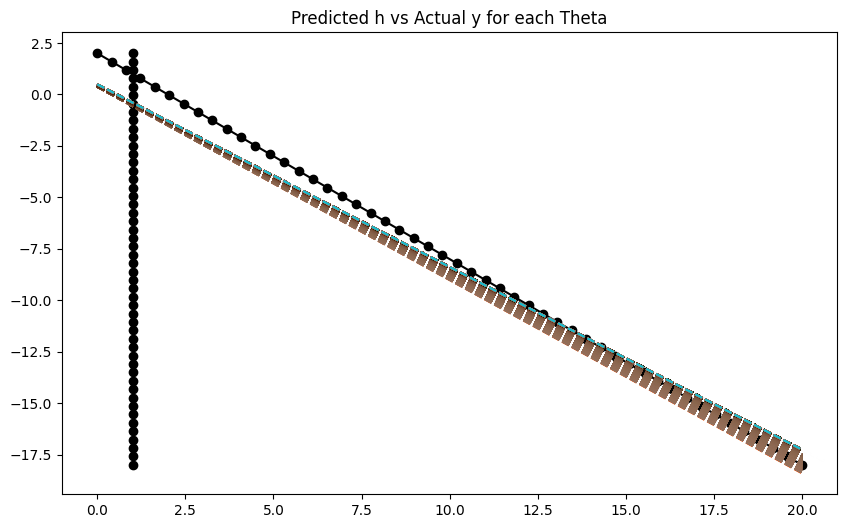

RMSProp Results:
Final Theta_0: 0.7060682692208862
Final Theta_1: -0.8758578616931346
Final R² Score: 0.9845

AdaGrad Results:
Final Theta_0: -0.5374456420595818
Final Theta_1: -0.6854522937839519
Final R² Score: 0.8904


In [256]:
learning_rate = 0.05
epsilon = 1e-8
n_iterations = 50
decay_rate = .4
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


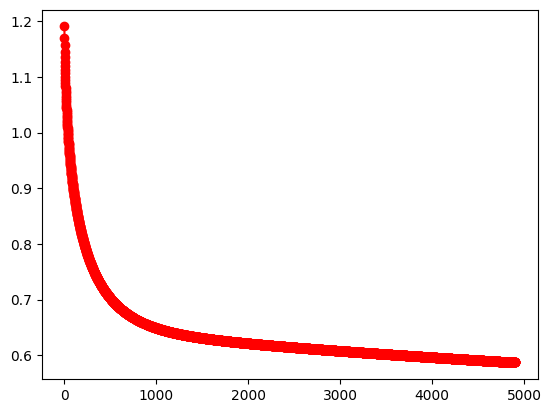

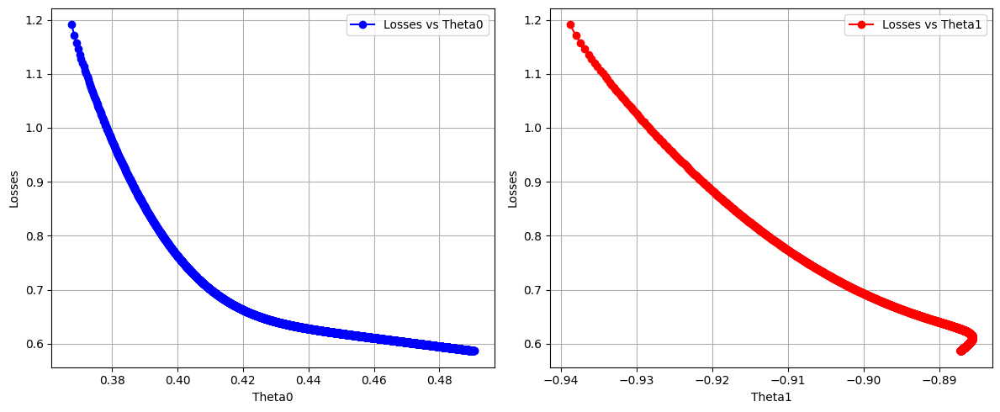

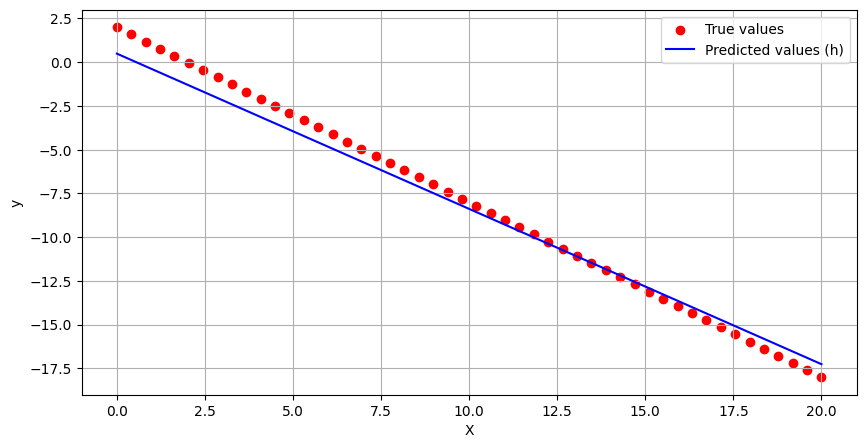

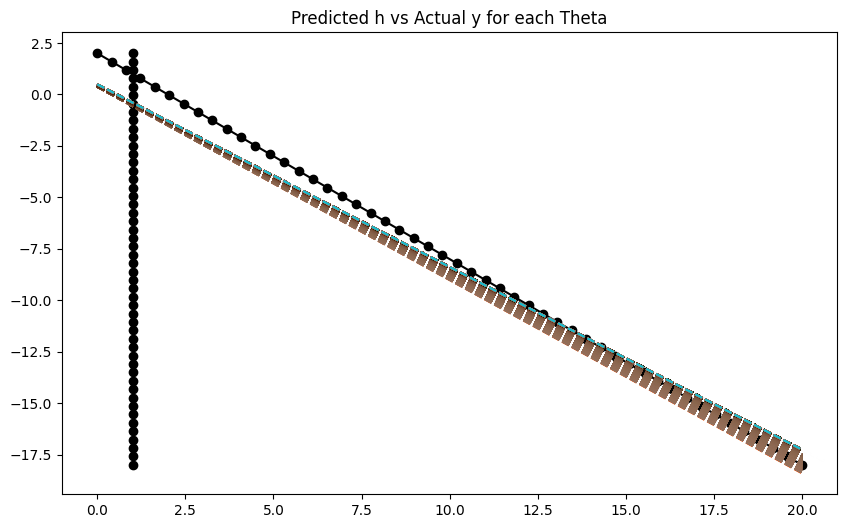

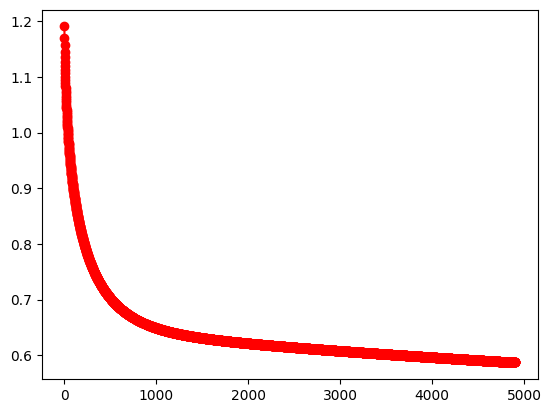

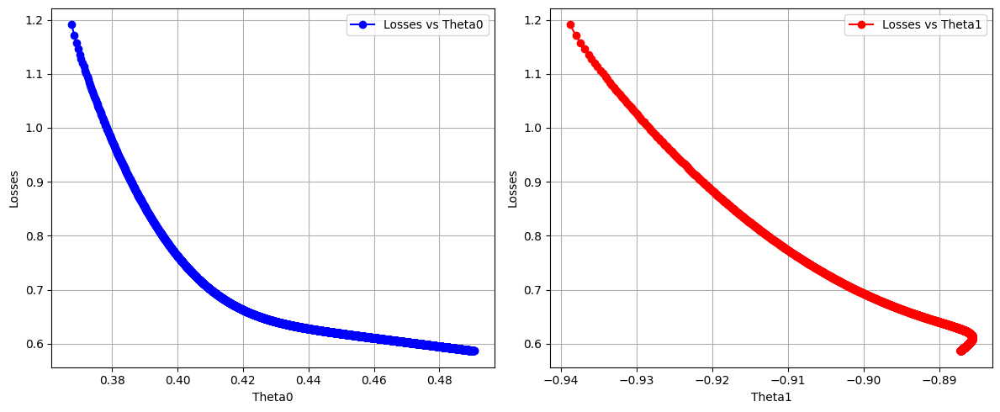

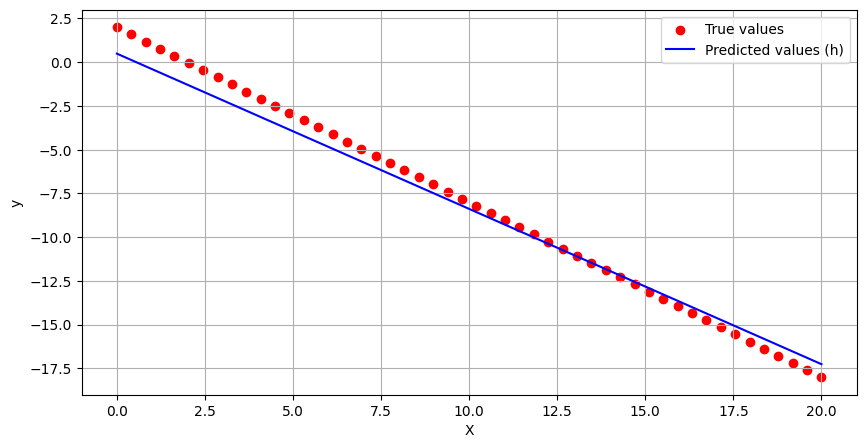

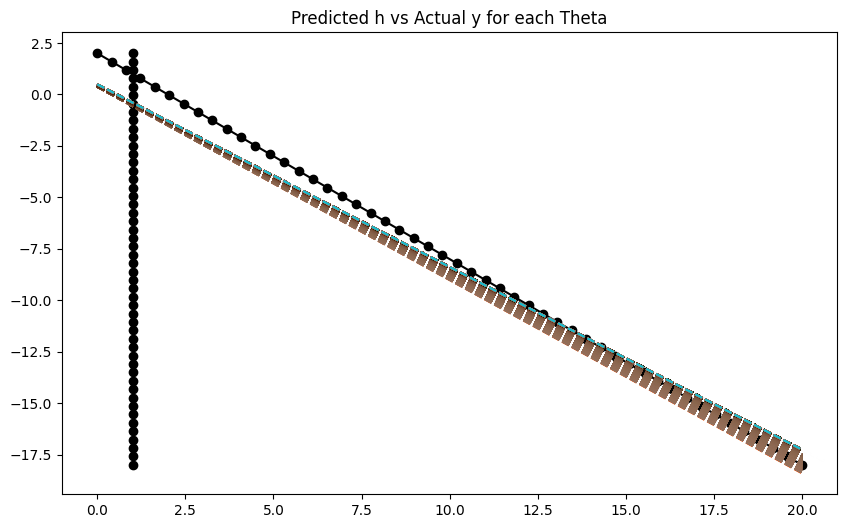

RMSProp Results:
Final Theta_0: 0.6819803827271169
Final Theta_1: -0.9251350567646415
Final R² Score: 0.9851

AdaGrad Results:
Final Theta_0: 0.035823457920096564
Final Theta_1: 0.17593639113990278
Final R² Score: -3.1483


In [257]:
learning_rate = 0.05
epsilon = 1e-8
n_iterations = 50
decay_rate = .3
theta_0_hist_rmsprop, theta_1_hist_rmsprop, loss_hist_rmsprop, hypothesis_hist_rmsprop, optimal_theta_rmsprop = rmsprop_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations,decay_rate
)

y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)
theta_0_hist_adagrad, theta_1_hist_adagrad, loss_hist_adagrad, hypothesis_hist_adagrad, optimal_theta_adagrad = adagrad_optimization(
    X_b, y.reshape(-1, 1), learning_rate, epsilon, n_iterations
)
y_pred = X_b.dot(optimal_theta)
plot_losses(theta_0_hist, theta_1_hist, loss_hist, X_b, y, y_pred)

print("RMSProp Results:")
print(f"Final Theta_0: {optimal_theta_rmsprop[0, 0]}")
print(f"Final Theta_1: {optimal_theta_rmsprop[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_rmsprop)):.4f}")
print("\nAdaGrad Results:")
print(f"Final Theta_0: {optimal_theta_adagrad[0, 0]}")
print(f"Final Theta_1: {optimal_theta_adagrad[1, 0]}")
print(f"Final R² Score: {r2_score(y, X_b.dot(optimal_theta_adagrad)):.4f}")


## Adam

### Update the previos implementation to be Adam.
#### Compare your results with Adagrad and RMSProp results.

In [260]:
def adam_optimization(X, y, learning_rate=0.05, beta1=0.2, beta2=0.7, epsilon=1e-8, n_iterations=500):
    m, n = X.shape
    theta = np.random.randn(n, 1)
    m_t = np.zeros_like(theta)
    v_t = np.zeros_like(theta)
    theta_0_history, theta_1_history, loss_history, hypothesis_history = [], [], [], []
    
    for t in range(1, n_iterations + 1):
        h = X.dot(theta)
        loss = np.mean((h - y) ** 2)
        gradients = (2 / m) * X.T.dot(h - y)
        
        m_t = beta1 * m_t + (1 - beta1) * gradients
        v_t = beta2 * v_t + (1 - beta2) * (gradients ** 2)
        
        m_hat = m_t / (1 - beta1 ** t)
        v_hat = v_t / (1 - beta2 ** t)
        
        theta -= learning_rate * m_hat / (np.sqrt(v_hat) + epsilon)
        
        theta_0_history.append(theta[0, 0])
        theta_1_history.append(theta[1, 0])
        loss_history.append(loss)
        hypothesis_history.append(h.copy())
    
    y_pred = X.dot(theta)
    r2 = r2_score(y, y_pred)
    return theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2

##### The following results uses alpha = 0.05, beta1 = 0.2, beta2 = 0.7, epsilon =  1e-08, and max. iterations = 500.

In [ ]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.05, beta1=0.2, beta2=0.7, epsilon=1e-8, n_iterations=500)


In [262]:
r2

0.999719805898509

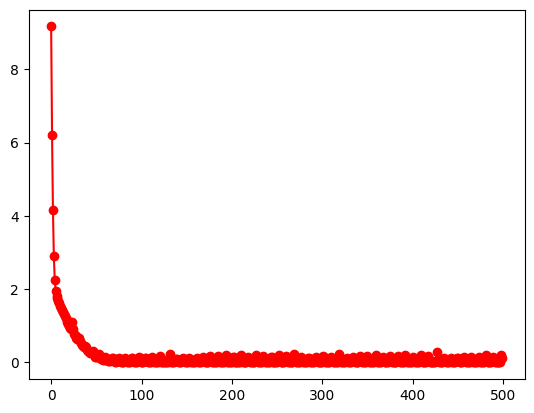

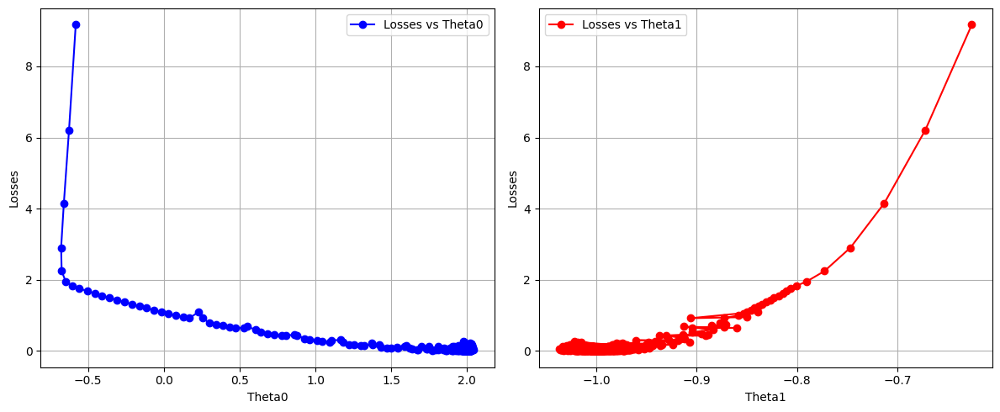

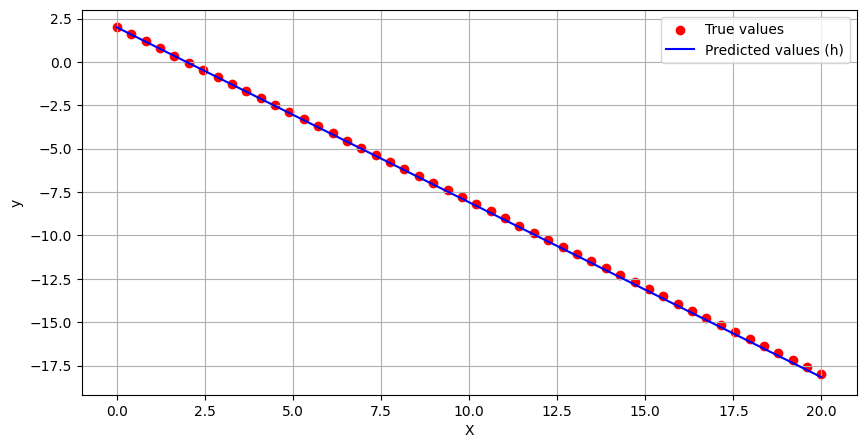

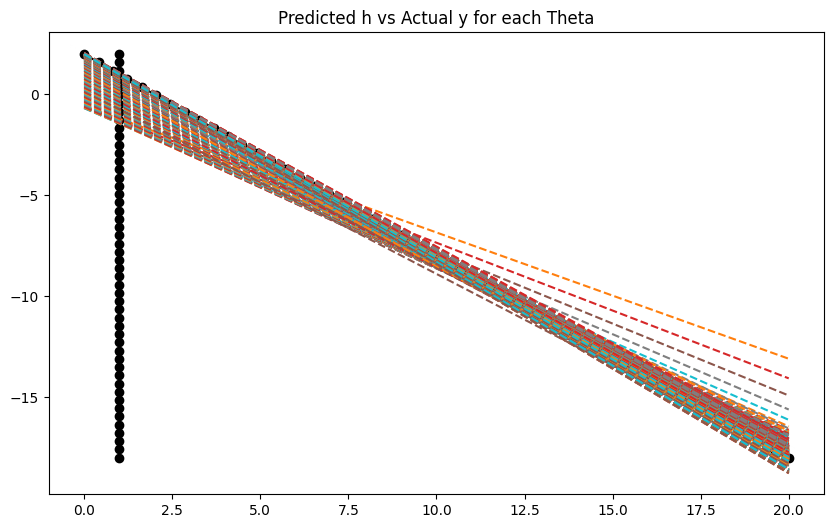

In [263]:
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)

##### The following results uses alpha = 0.005, beta1 = 0.5, beta2 = 0.8, epsilon =  1e-08, and max. iterations = 500.

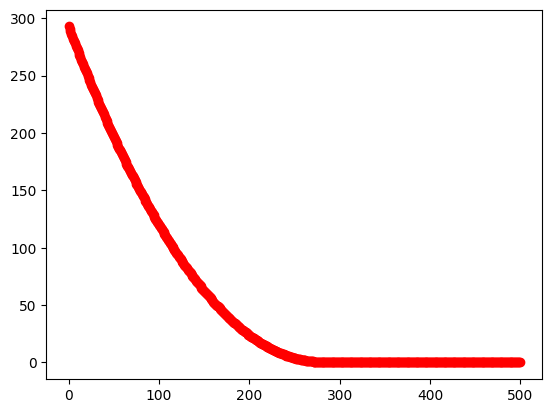

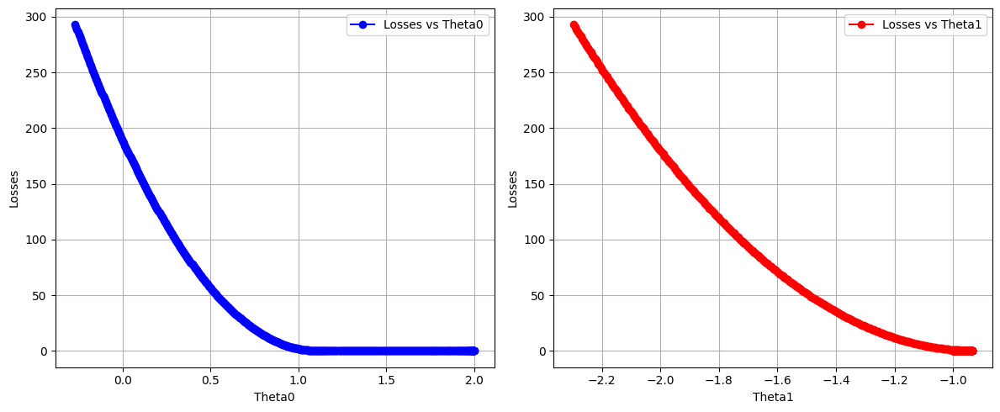

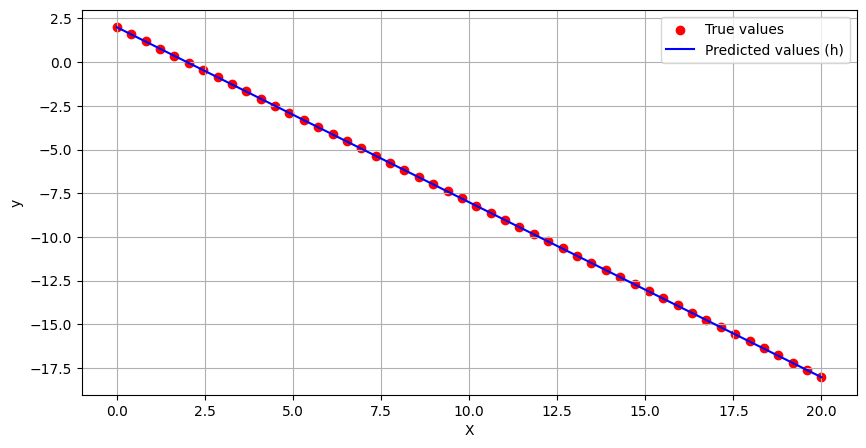

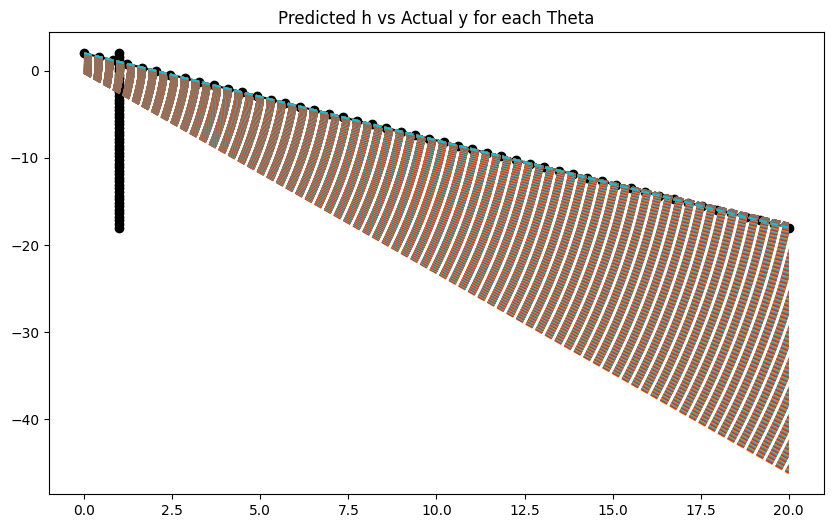

0.9999930453580932


In [264]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.005, beta1=0.5, beta2=0.8, epsilon=1e-8, n_iterations=500)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

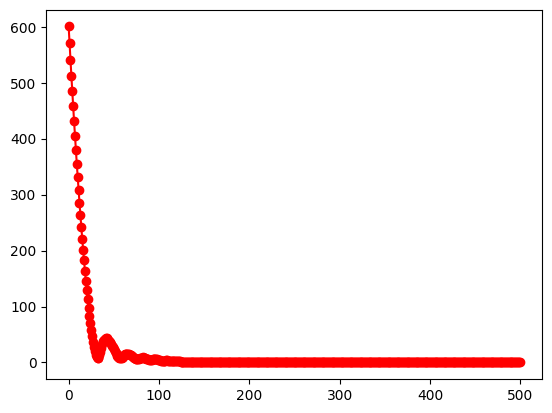

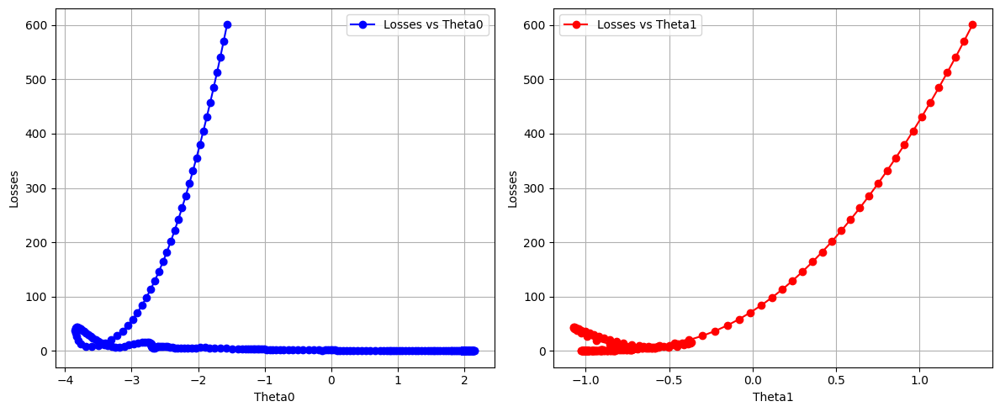

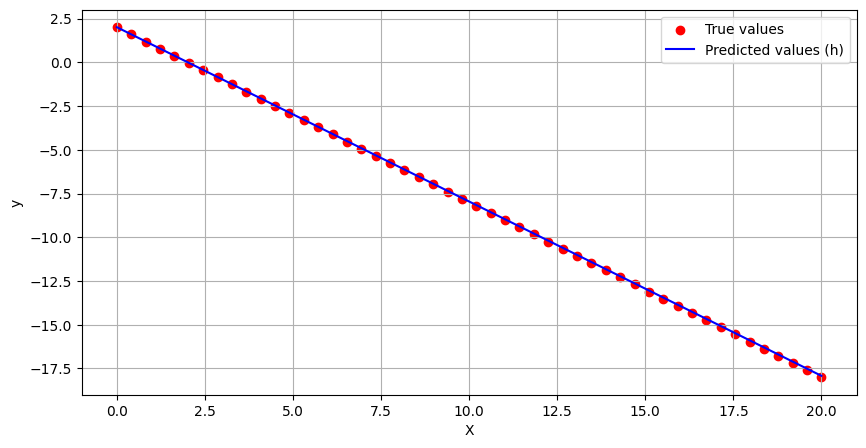

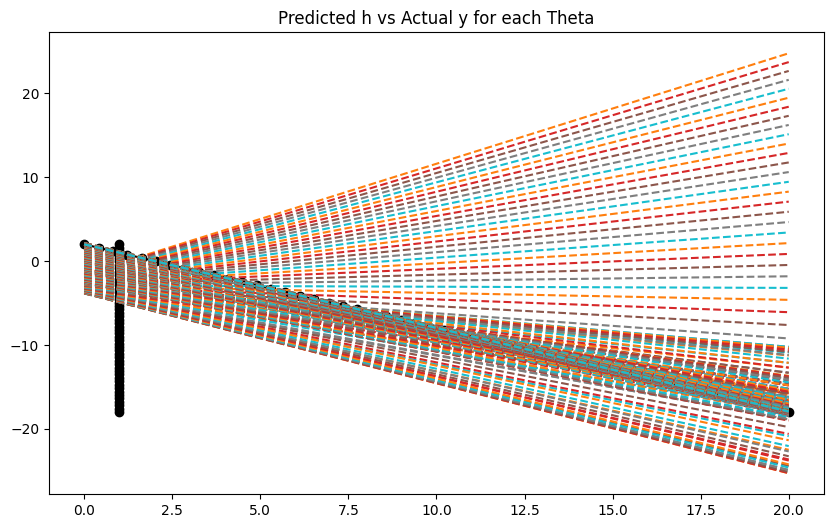

0.9999358194620142


In [265]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.05, beta1=0.9, beta2=0.7, epsilon=1e-8, n_iterations=500)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

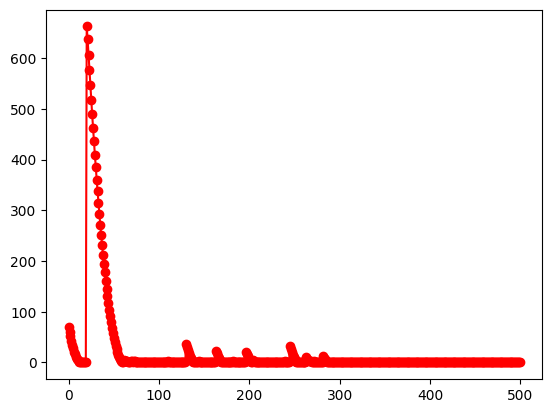

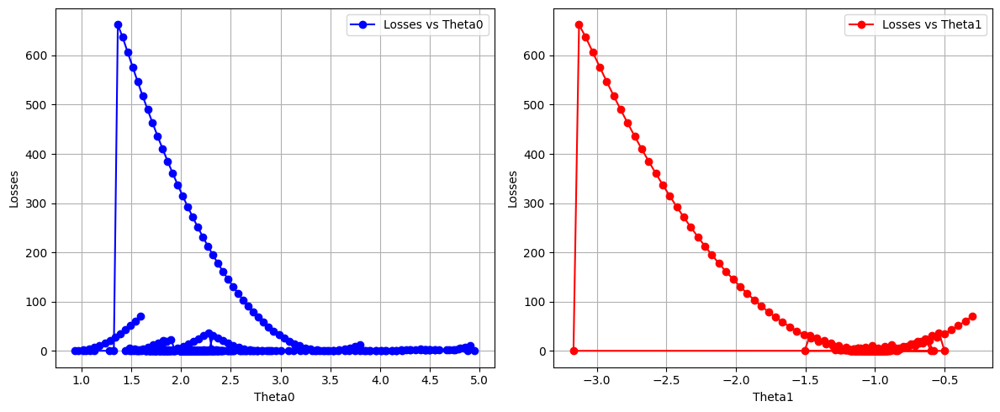

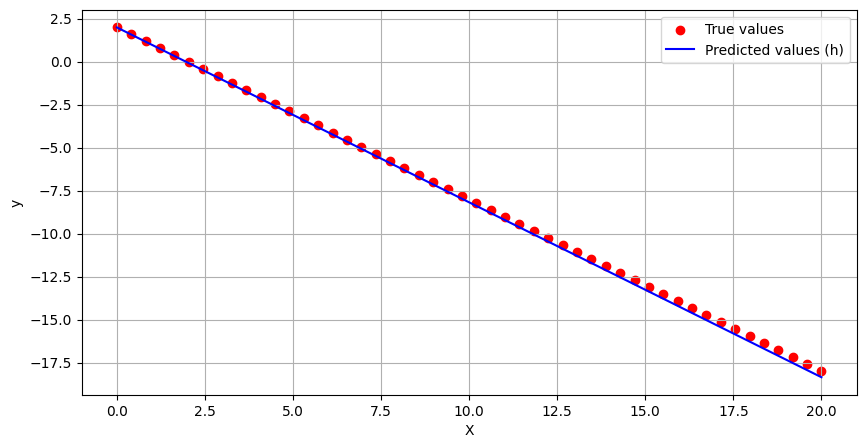

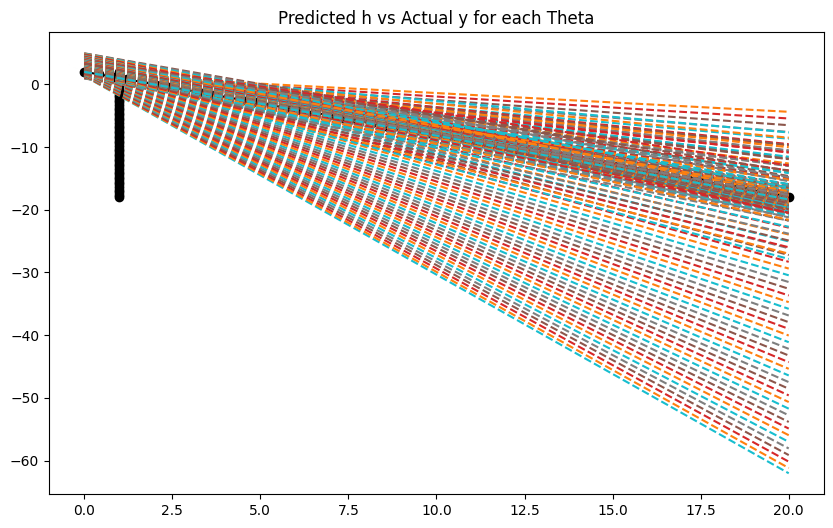

0.9987532650381474


In [266]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.05, beta1=0.2, beta2=0, epsilon=1e-8, n_iterations=500)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

##### The following results uses alpha = 0.0005, beta1 = 0.8, beta2 = 0.8, epsilon =  1e-08, and max. iterations = 5000.

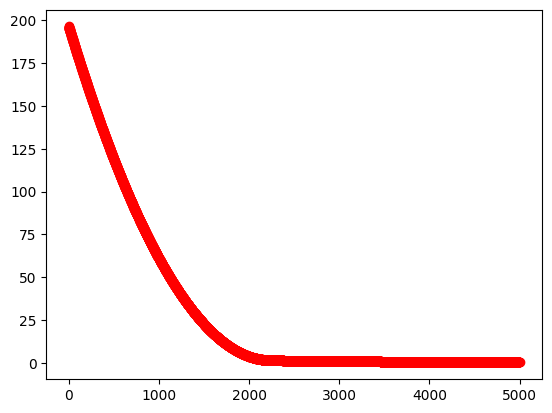

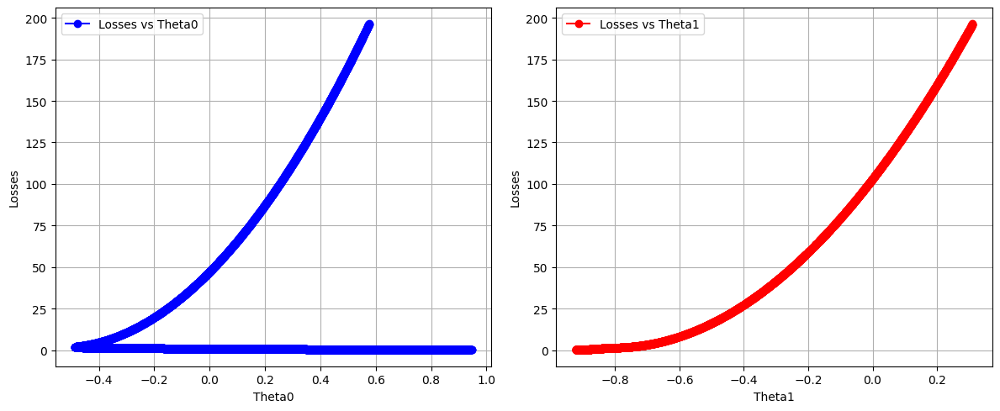

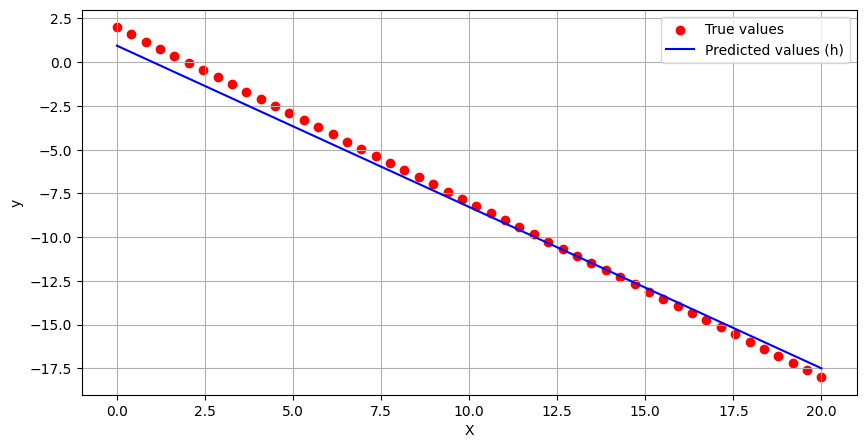

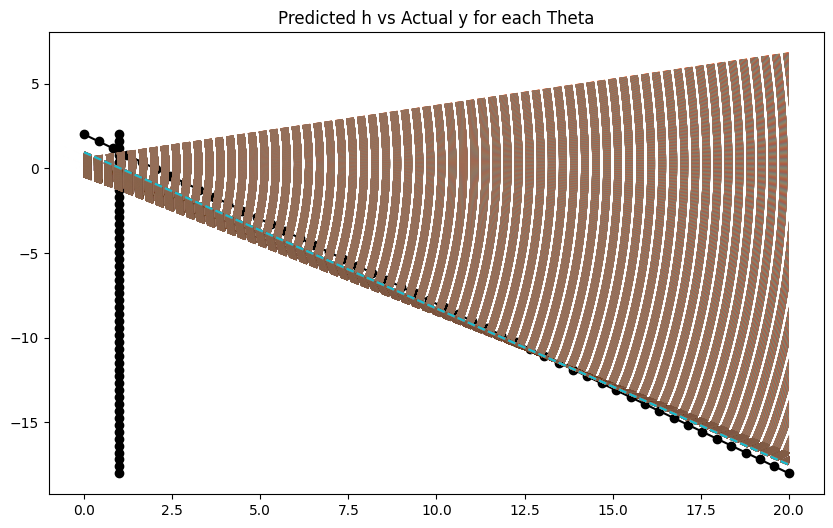

0.9917608453911465


In [267]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.0005, beta1=0.8, beta2=0.8, epsilon=1e-8, n_iterations=5000)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

### Play with the parameters and see the results

##### The following results uses alpha = 0.001, beta1 = 0.9, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

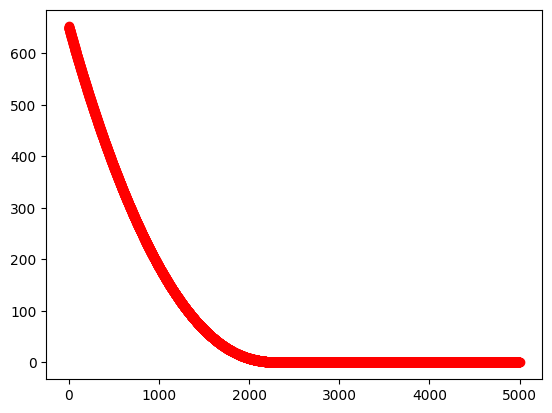

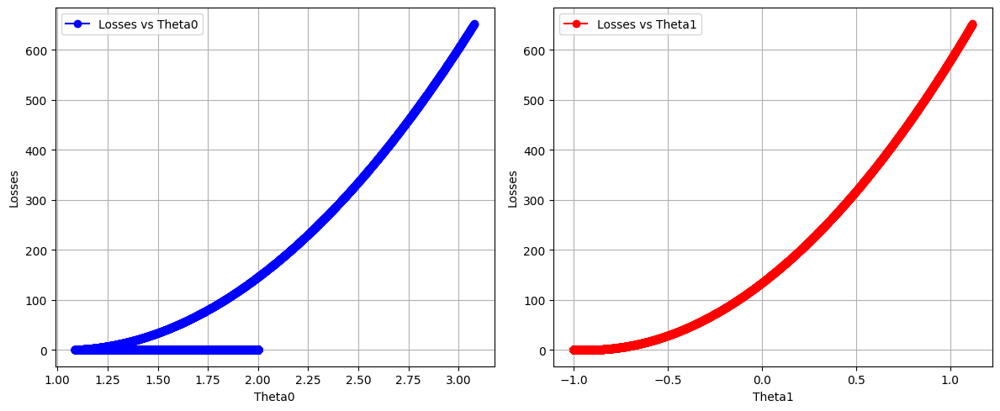

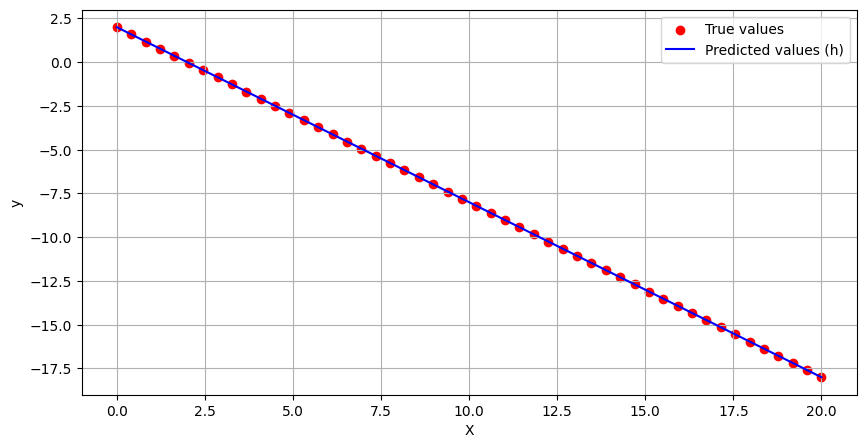

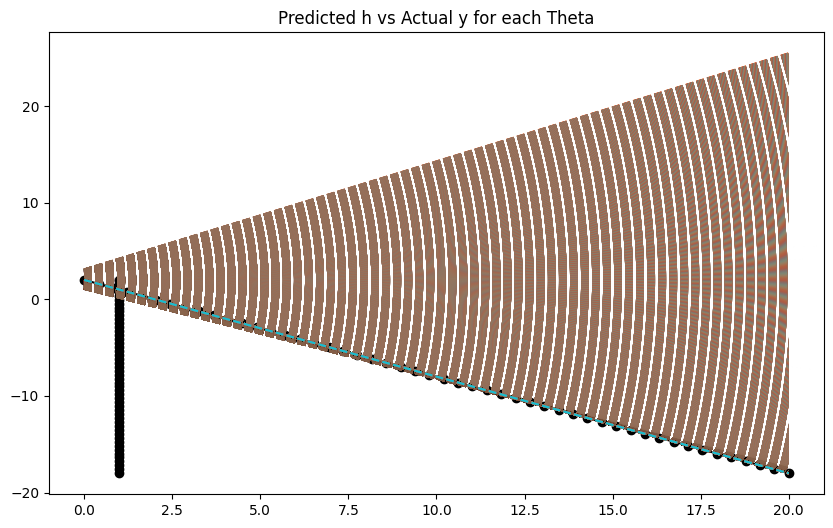

0.9999999993245032


In [268]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.001, beta1=0.9, beta2=0.99, epsilon=1e-8, n_iterations=5000)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

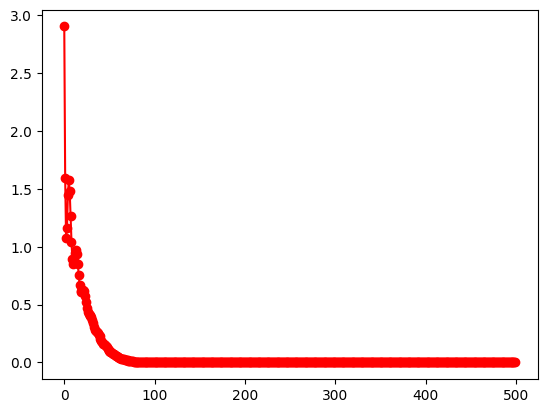

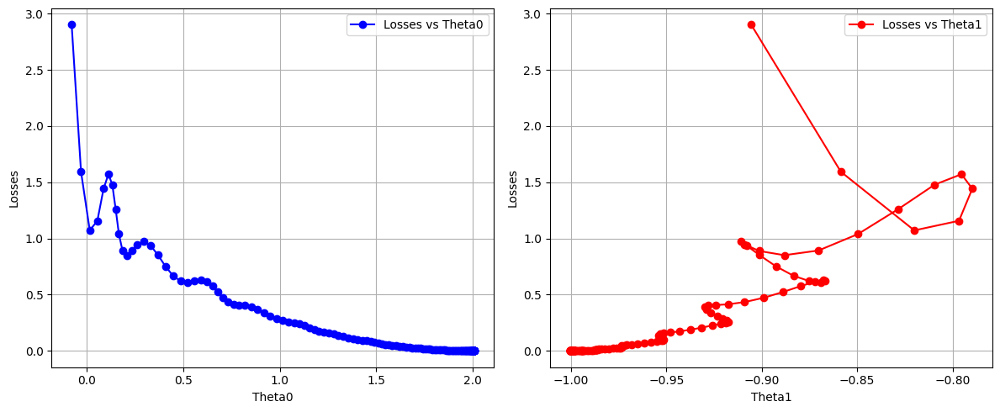

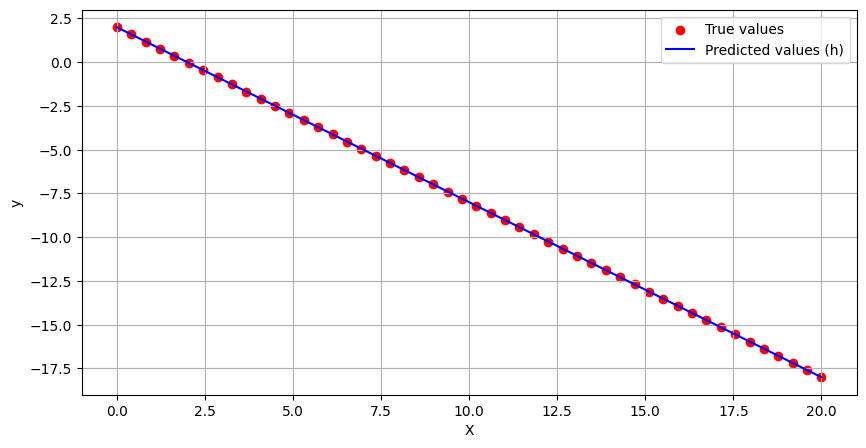

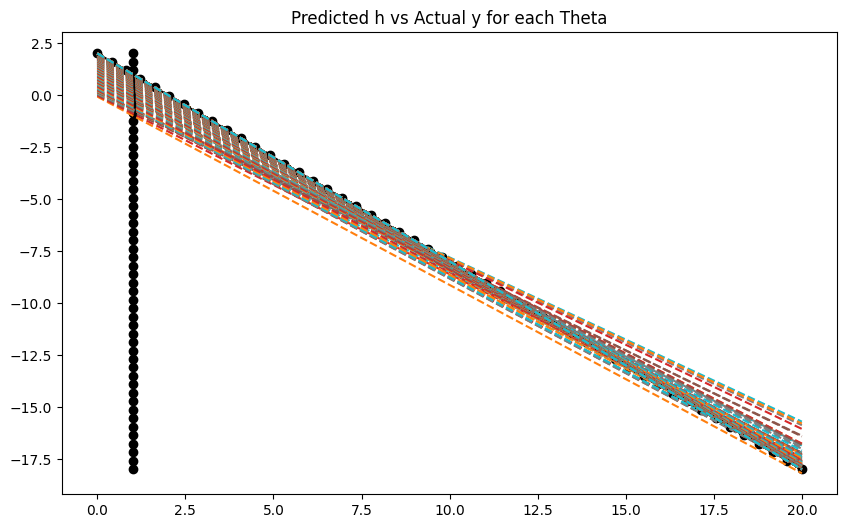

1.0


In [269]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.05, beta1=0.9, beta2=0.999, epsilon=1e-8, n_iterations=500)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

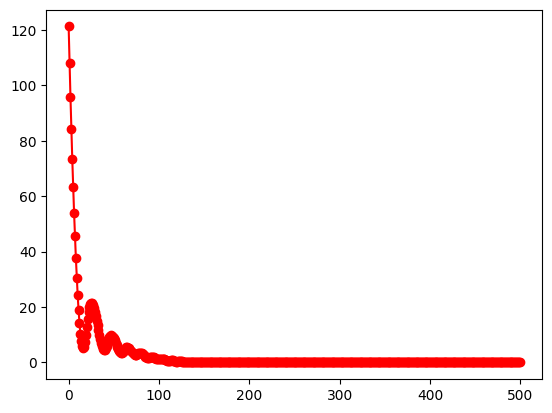

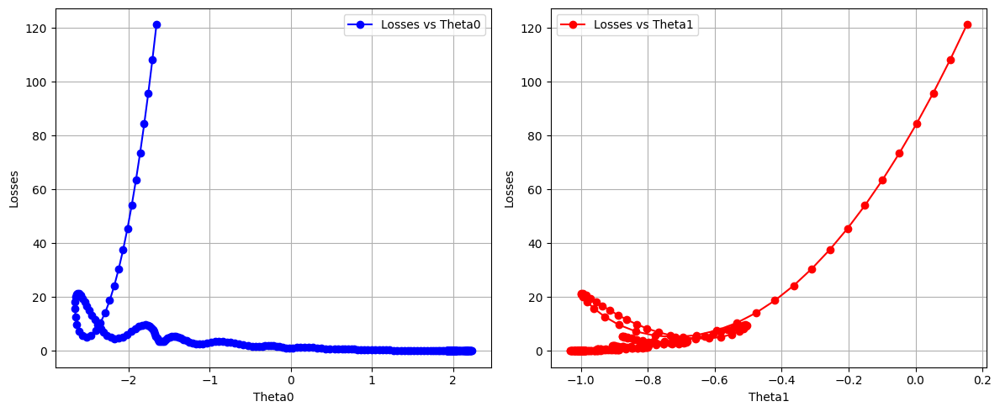

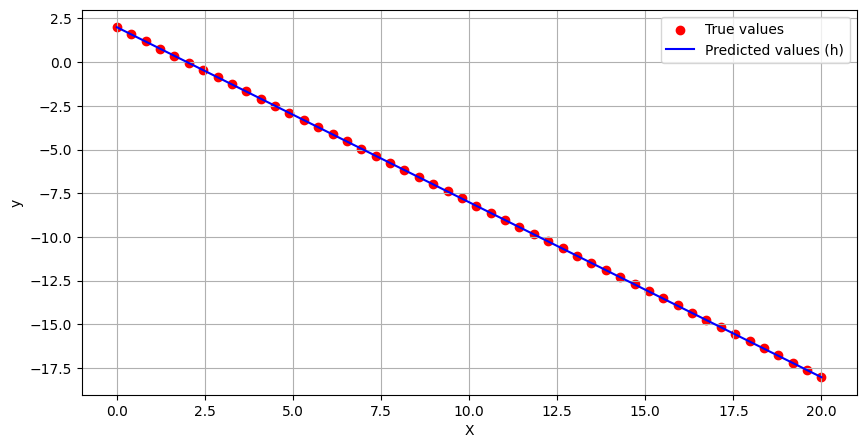

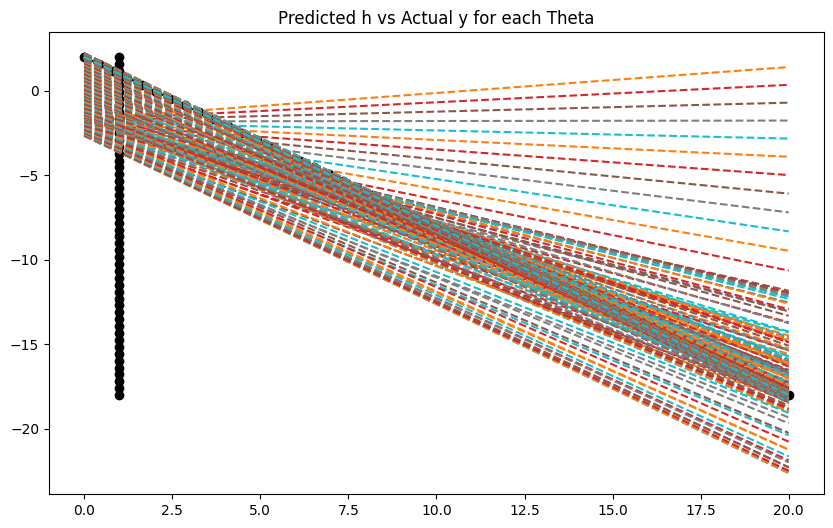

0.9999951932016612


In [270]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.05, beta1=0.92, beta2=0.79, epsilon=1e-8, n_iterations=500)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

##### The following results uses alpha = 0.001, beta1 = 0.9, beta2 = 0.5, epsilon =  1e-08, and max. iterations = 5000.

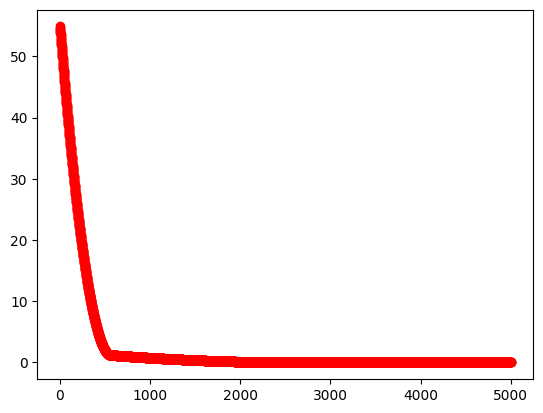

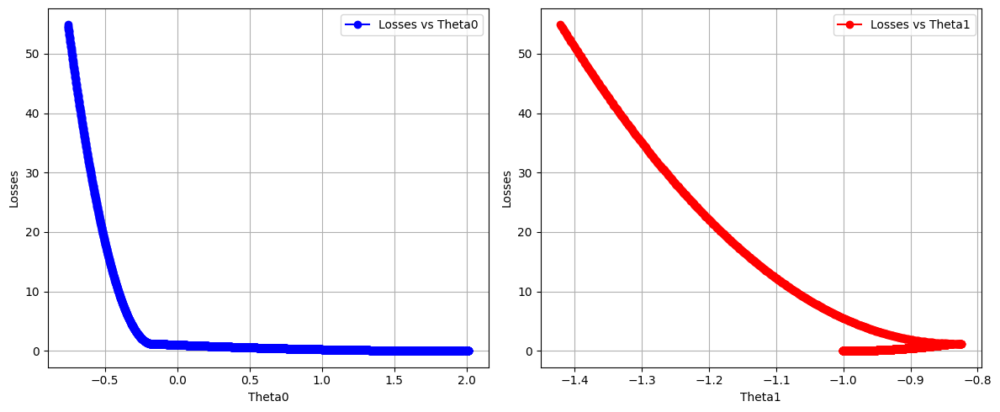

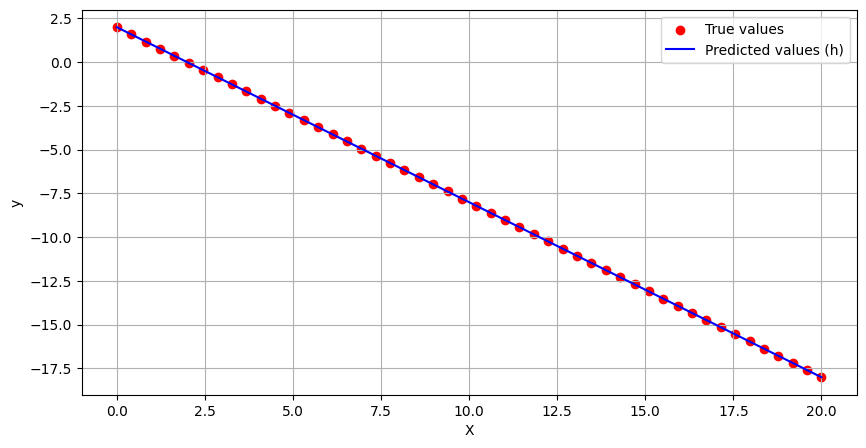

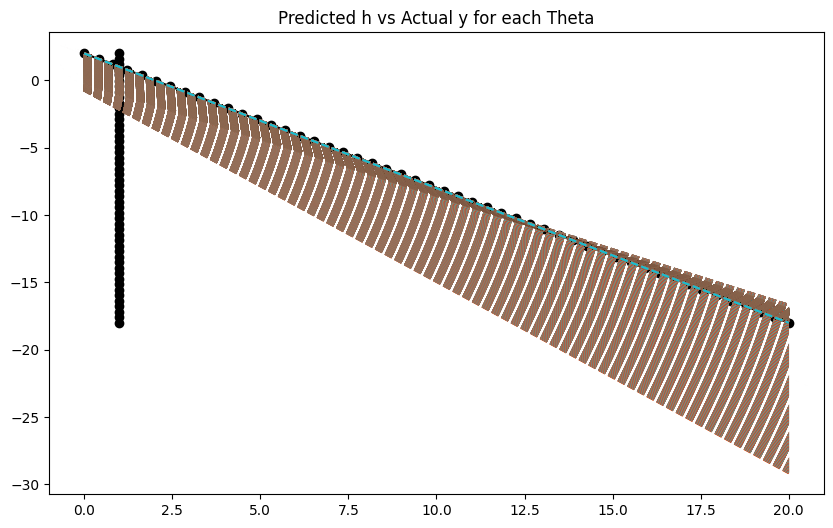

0.9999998574640343


In [271]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.001, beta1=0.9, beta2=0.5, epsilon=1e-8, n_iterations=5000)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

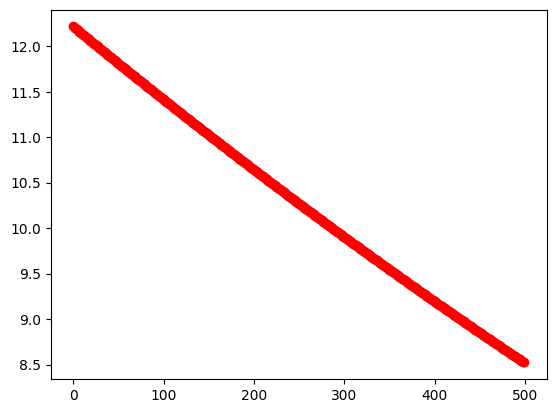

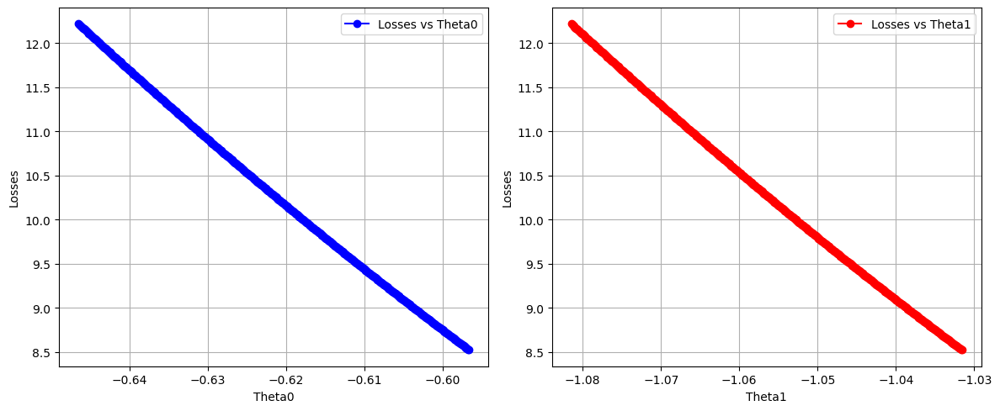

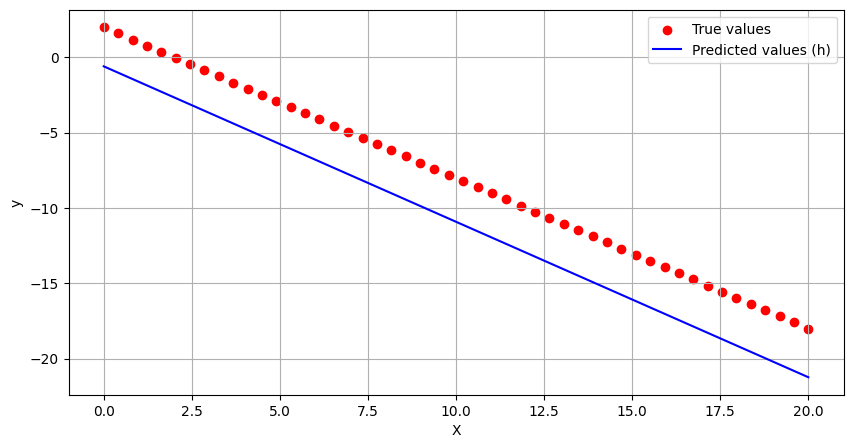

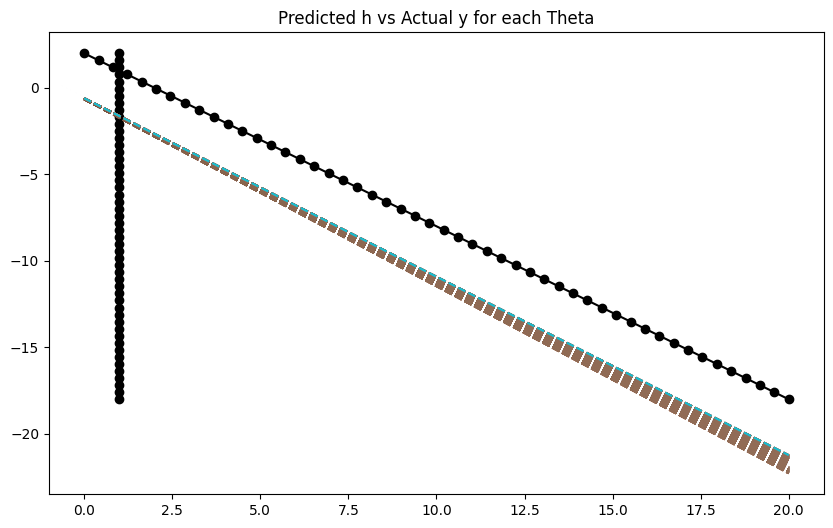

0.7544966654005552


In [272]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.0001, beta1=0.2, beta2=0.7, epsilon=1e-8, n_iterations=500)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

##### The following results uses alpha = 0.001, beta1 = 0.5, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

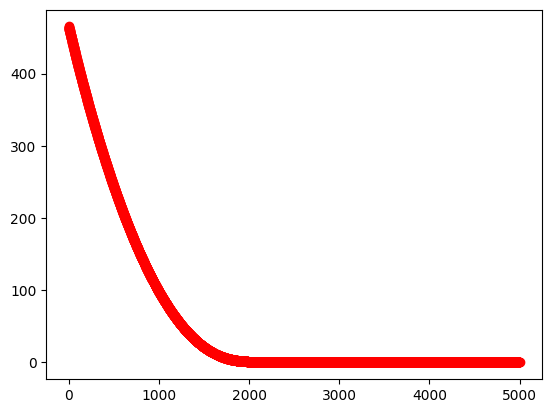

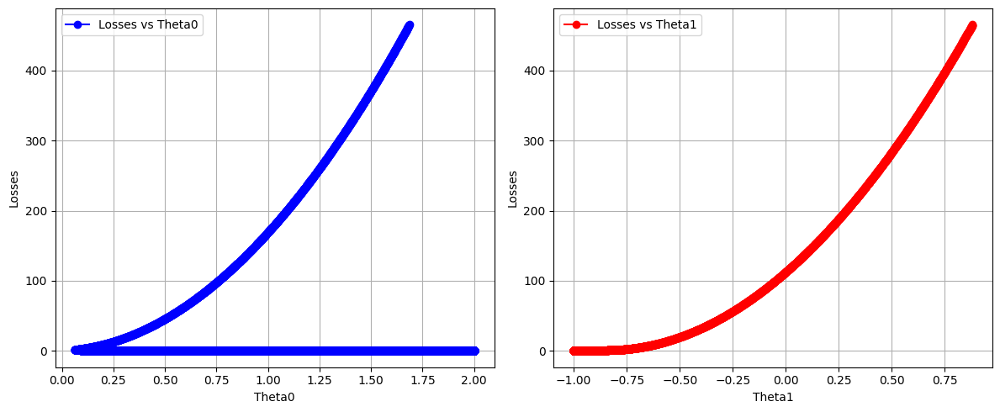

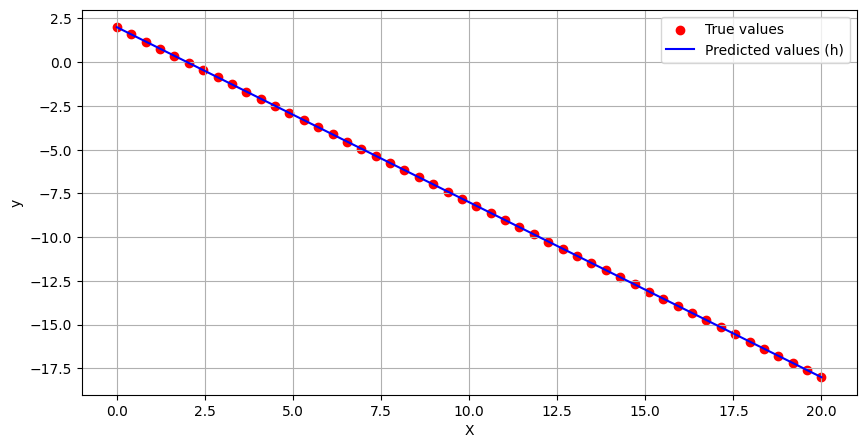

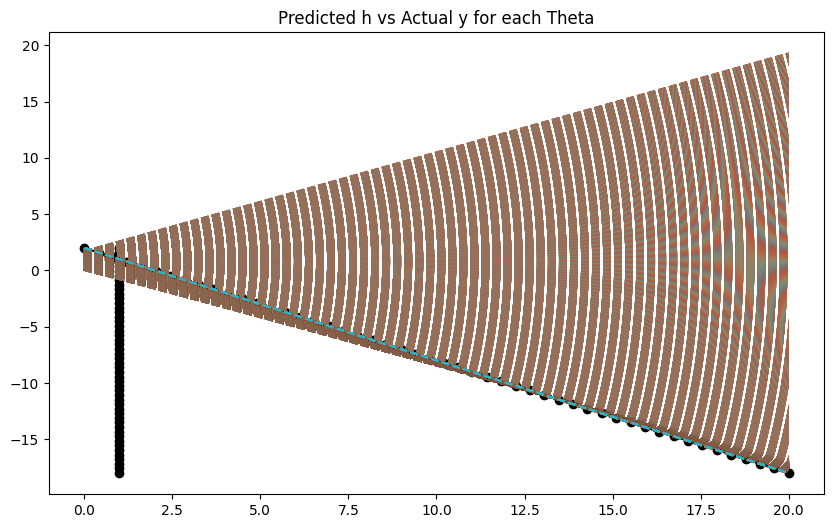

1.0


In [273]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.001, beta1=0.5, beta2=0.99, epsilon=1e-8, n_iterations=5000)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

##### The following results uses alpha = 0.001, beta1 = 0.5, beta2 = 0.5, epsilon =  1e-08, and max. iterations = 5000.

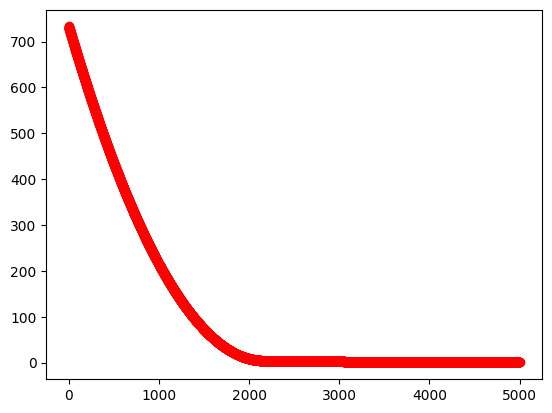

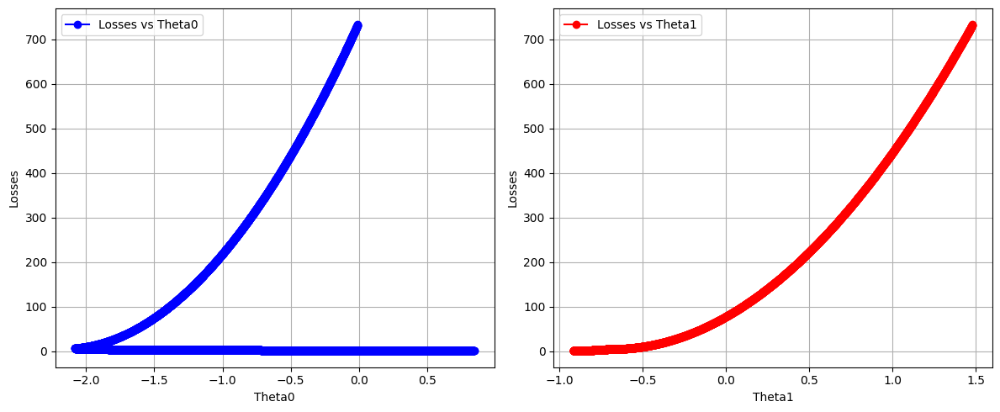

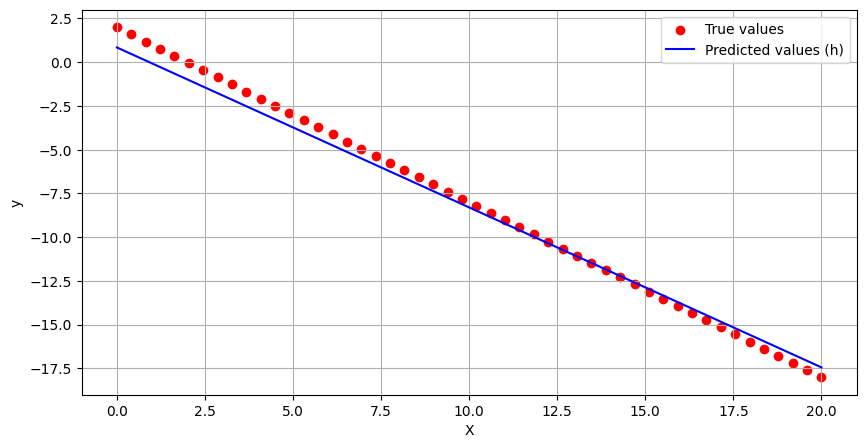

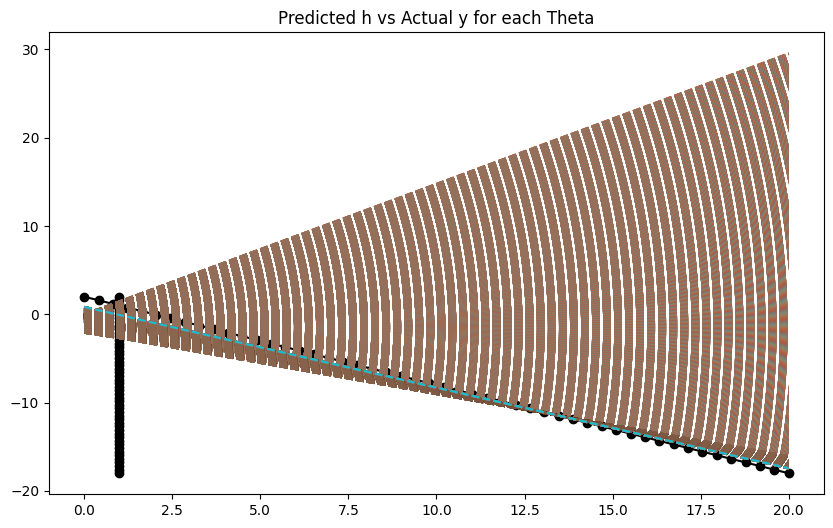

0.9900955770201384


In [274]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.001, beta1=0.5, beta2=0.5, epsilon=1e-8, n_iterations=5000)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

##### The following results uses alpha = 0.01, beta1 = 0.9, beta2 = 0.99, epsilon =  1e-08, and max. iterations = 5000.

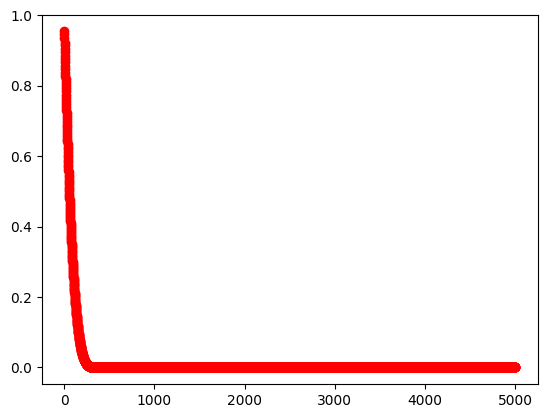

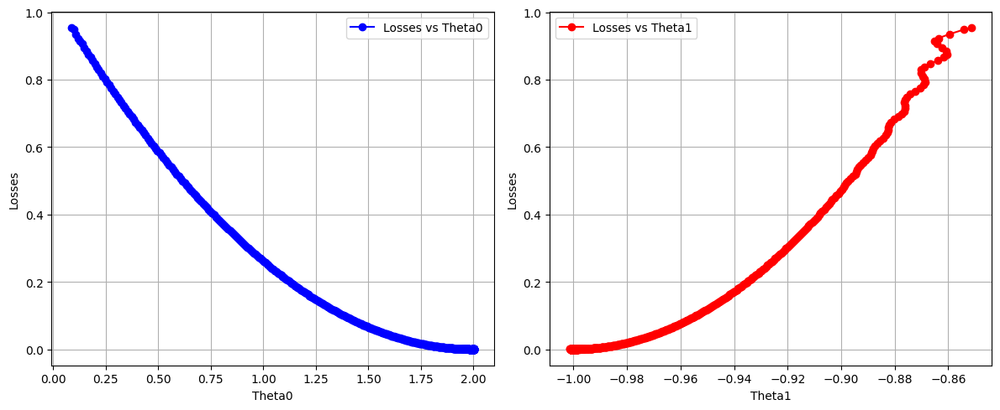

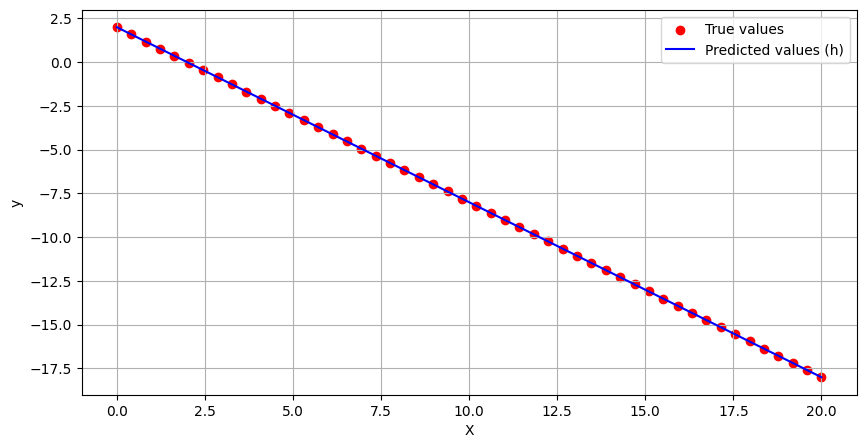

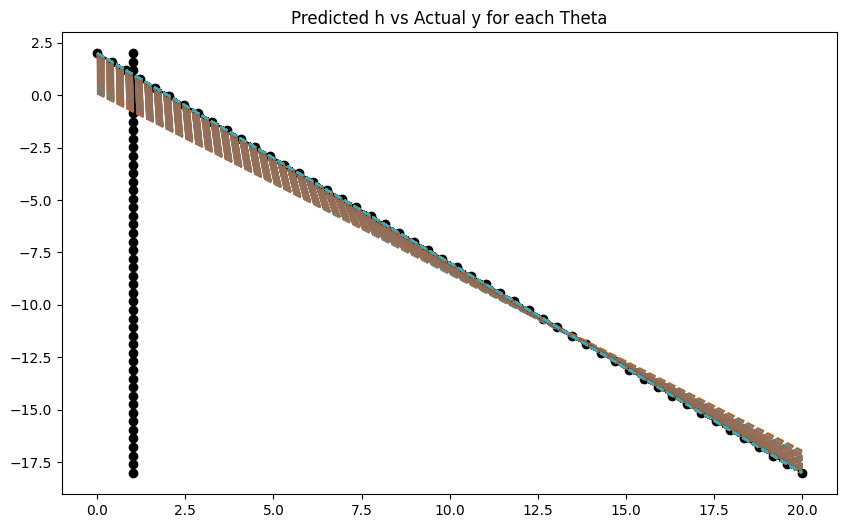

0.9999999751784614


In [275]:
theta_0_history, theta_1_history, loss_history, hypothesis_history, theta, r2=adam_optimization(X_b, y, learning_rate=0.01, beta1=0.9, beta2=0.99, epsilon=1e-8, n_iterations=5000)
y_pred = X_b.dot(theta)
plot_losses(theta_0_history, theta_1_history, loss_history, X_b, y, y_pred)
print(r2)

## Congratulations 
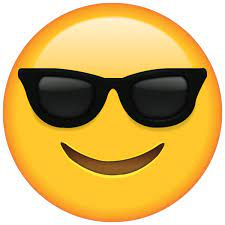